In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **Importing Data**

In [ ]:
import pandas as pd
import numpy as np
# To display all the columns of dataframe
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)

import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use("default")

from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

import warnings
warnings.filterwarnings("ignore")

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/Technocolabs/Bondora_preprocessed.csv")

In [ ]:
df.head()

,BidsPortfolioManager,BidsApi,BidsManual,NewCreditCustomer,VerificationType,LanguageCode,Age,Gender,Country,AppliedAmount,Amount,Interest,LoanDuration,MonthlyPayment,UseOfLoan,Education,MaritalStatus,EmploymentStatus,EmploymentDurationCurrentEmployer,OccupationArea,HomeOwnershipType,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,RefinanceLiabilities,DebtToIncome,FreeCash,MonthlyPaymentDay,Rating,Restructured,CreditScoreEsMicroL,PrincipalPaymentsMade,InterestAndPenaltyPaymentsMade,PrincipalBalance,InterestAndPenaltyBalance,NoOfPreviousLoansBeforeLoan,AmountOfPreviousLoansBeforeLoan,PreviousRepaymentsBeforeLoan,PreviousEarlyRepaymentsCountBeforeLoan,Defaulted
0,0,0,115.0410,True,Unverified/Cross Referenced Phone,Estonian,61,Woman,Estonia,319.5582,115.0408,30.0,12,130.393314,Other,Vocational Education,Married,Fully Employed,UpTo3Years,Retail and Wholesale,Owner,10500.0,0,0.0,0,0.0,0.0,25,F,False,M,115.0408,20.4222,0.00,0.00,1,83.0852,0.0000,0,0
1,0,0,140.6057,False,Unverified/Cross Referenced Phone,Estonian,48,Woman,Estonia,191.7349,140.6057,25.0,1,130.393314,Other,Higher Education,Divorced,Fully Employed,MoreThan5Years,Education,Owner,10800.0,0,0.0,0,0.0,0.0,15,F,False,M,140.6057,2.0227,0.00,0.00,2,255.6467,258.6256,0,0
2,0,0,319.5580,True,Unverified/Cross Referenced Phone,Estonian,58,Woman,Estonia,319.5582,319.5409,25.0,20,130.393314,Home Improvement,Secondary Education,Married,Fully Employed,UpTo4Years,Mining,Owner,7000.0,0,0.0,0,0.0,0.0,25,F,True,M,203.1909,59.7626,116.35,414.07,0,0.0000,0.0000,0,1
3,0,0,57.5205,True,Unverified/Cross Referenced Phone,Estonian,23,Woman,Estonia,127.8233,57.5205,45.0,15,130.393314,Loan Consolidation,Basic Education,Single,Not Specified,UpTo2Years,Other,Owner,11600.0,0,0.0,0,0.0,0.0,15,F,False,M,57.5205,18.7323,0.00,0.00,1,134.2144,0.0000,0,0
4,0,0,319.5582,True,Unverified/Cross Referenced Phone,Estonian,25,Woman,Estonia,319.5582,319.5436,30.0,12,130.393314,Vehicle,Secondary Education,Cohabitant,Fully Employed,UpTo2Years,Retail and Wholesale,Owner,6800.0,0,0.0,0,0.0,0.0,25,F,False,M,319.5436,220.4200,0.00,0.00,1,146.9966,0.0000,0,0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 77394 entries, 0 to 77393
Data columns (total 40 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   BidsPortfolioManager                    77394 non-null  int64  
 1   BidsApi                                 77394 non-null  int64  
 2   BidsManual                              77394 non-null  float64
 3   NewCreditCustomer                       77394 non-null  bool   
 4   VerificationType                        77394 non-null  object 
 5   LanguageCode                            77394 non-null  object 
 6   Age                                     77394 non-null  int64  
 7   Gender                                  77394 non-null  object 
 8   Country                                 77394 non-null  object 
 9   AppliedAmount                           77394 non-null  float64
 10  Amount                                  77394 non-null  fl

**Re-Converting Categorical Variables**

In [ ]:
cat_cols=['VerificationType','LanguageCode','Gender','Country','UseOfLoan','Education','MaritalStatus','EmploymentStatus',
          'EmploymentDurationCurrentEmployer','OccupationArea','HomeOwnershipType','Rating','CreditScoreEsMicroL','LoanDuration']

for col in cat_cols:
  df[col] = df[col].astype("category")

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 77394 entries, 0 to 77393
Data columns (total 40 columns):
 #   Column                                  Non-Null Count  Dtype   
---  ------                                  --------------  -----   
 0   BidsPortfolioManager                    77394 non-null  int64   
 1   BidsApi                                 77394 non-null  int64   
 2   BidsManual                              77394 non-null  float64 
 3   NewCreditCustomer                       77394 non-null  bool    
 4   VerificationType                        77394 non-null  category
 5   LanguageCode                            77394 non-null  category
 6   Age                                     77394 non-null  int64   
 7   Gender                                  77394 non-null  category
 8   Country                                 77394 non-null  category
 9   AppliedAmount                           77394 non-null  float64 
 10  Amount                                  77394 

In [ ]:
# To test Modeling Performence with Random Forest after each step

def Test_Performence(X, y):

  X_train, X_test, y_train, y_test = train_test_split( X , y, stratify=y, random_state=0 )

  clf = RandomForestClassifier(random_state=0)

  clf.fit(X_train,y_train)

  print("Random Forest Test Set Accuracy: " , clf.score(X_test,y_test), "\n" )

  # To plot Feature Importance

  results = list(zip(X, clf.feature_importances_))

  importance = pd.DataFrame(results, columns = ["Feature", "Importance"])

  importance = importance.sort_values(by="Importance", ascending=False)

  plt.figure(figsize=[15,10])

  sns.barplot(x = importance.Importance, y = importance.Feature)

  plt.title("Random Forest Feature Importance")


# **Creating Regression Target Variable**

In [ ]:
Reg_DF = df[["Amount","Interest","MonthlyPayment"]]
Reg_DF

,Amount,Interest,MonthlyPayment
0,115.0408,30.00,130.393314
1,140.6057,25.00,130.393314
2,319.5409,25.00,130.393314
3,57.5205,45.00,130.393314
4,319.5436,30.00,130.393314
...,...,...,...
77389,3000.0000,31.01,107.680000
77390,3000.0000,18.25,85.330000
77391,2500.0000,24.83,80.420000
77392,3000.0000,17.74,84.510000


In [ ]:
# Calculating Toal Loan Amount after Interest

Reg_DF["TotalAmount"] = Reg_DF["Amount"].values + ( (Reg_DF["Interest"].values/100) * Reg_DF["Amount"].values )
Reg_DF["TotalAmount"]

0         149.553040
1         175.757125
2         399.426125
3          83.404725
4         415.406680
            ...     
77389    3930.300000
77390    3547.500000
77391    3120.750000
77392    3532.200000
77393    3915.000000
Name: TotalAmount, Length: 77394, dtype: float64

In [ ]:
Reg_DF = Reg_DF[Reg_DF["MonthlyPayment"] != 0].reset_index(drop=True)

In [ ]:
Reg_DF[Reg_DF["MonthlyPayment"] == 0]

,Amount,Interest,MonthlyPayment,TotalAmount


In [ ]:
Reg_DF

,Amount,Interest,MonthlyPayment,TotalAmount
0,115.0408,30.00,130.393314,149.553040
1,140.6057,25.00,130.393314,175.757125
2,319.5409,25.00,130.393314,399.426125
3,57.5205,45.00,130.393314,83.404725
4,319.5436,30.00,130.393314,415.406680
...,...,...,...,...
73899,3000.0000,31.01,107.680000,3930.300000
73900,3000.0000,18.25,85.330000,3547.500000
73901,2500.0000,24.83,80.420000,3120.750000
73902,3000.0000,17.74,84.510000,3532.200000


In [ ]:
# Calculating how much months to pay the loan then dividing by 12 to get the year

Months = []
Counter = 1

Reg_DF_Copy = Reg_DF[["TotalAmount","MonthlyPayment"]]

for index, row in Reg_DF_Copy.iterrows():

    Current_EMI = row["MonthlyPayment"]
    
    while( Current_EMI < row["TotalAmount"]):
      
      Counter = Counter + 1

      Current_EMI += Current_EMI
      
    Months.append(Counter/12)

    Counter = 1

In [ ]:
len(Months)

73904

In [ ]:
pd.Series(Months)

0        0.166667
1        0.166667
2        0.250000
3        0.083333
4        0.250000
           ...   
73899    0.583333
73900    0.583333
73901    0.583333
73902    0.583333
73903    0.583333
Length: 73904, dtype: float64

In [ ]:
Reg_DF["RepaymentYears"] = pd.Series(Months)

In [ ]:
Reg_DF["RepaymentYears"].max()

0.6666666666666666

In [ ]:
Reg_DF

,Amount,Interest,MonthlyPayment,TotalAmount,RepaymentYears
0,115.0408,30.00,130.393314,149.553040,0.166667
1,140.6057,25.00,130.393314,175.757125,0.166667
2,319.5409,25.00,130.393314,399.426125,0.250000
3,57.5205,45.00,130.393314,83.404725,0.083333
4,319.5436,30.00,130.393314,415.406680,0.250000
...,...,...,...,...,...
73899,3000.0000,31.01,107.680000,3930.300000,0.583333
73900,3000.0000,18.25,85.330000,3547.500000,0.583333
73901,2500.0000,24.83,80.420000,3120.750000,0.583333
73902,3000.0000,17.74,84.510000,3532.200000,0.583333


In [ ]:
#Reg_DF.drop(columns="TotalAmount", inplace=True)
Reg_DF

,Amount,Interest,MonthlyPayment,TotalAmount,RepaymentYears
0,115.0408,30.00,130.393314,149.553040,0.166667
1,140.6057,25.00,130.393314,175.757125,0.166667
2,319.5409,25.00,130.393314,399.426125,0.250000
3,57.5205,45.00,130.393314,83.404725,0.083333
4,319.5436,30.00,130.393314,415.406680,0.250000
...,...,...,...,...,...
73899,3000.0000,31.01,107.680000,3930.300000,0.583333
73900,3000.0000,18.25,85.330000,3547.500000,0.583333
73901,2500.0000,24.83,80.420000,3120.750000,0.583333
73902,3000.0000,17.74,84.510000,3532.200000,0.583333


In [ ]:
Reg_DF["RepaymentYears"].value_counts()

0.500000    39726
0.583333    22760
0.416667     6377
0.333333     2628
0.250000     1192
0.166667      609
0.083333      442
0.666667      170
Name: RepaymentYears, dtype: int64

In [ ]:
Reg_DF_Full = df.drop(columns="Defaulted")
Reg_DF_Full = Reg_DF_Full[Reg_DF_Full["MonthlyPayment"] != 0].reset_index(drop=True)
Reg_DF_Full["RepaymentYears"] = Reg_DF["RepaymentYears"]
Reg_DF_Full

,BidsPortfolioManager,BidsApi,BidsManual,NewCreditCustomer,VerificationType,LanguageCode,Age,Gender,Country,AppliedAmount,Amount,Interest,LoanDuration,MonthlyPayment,UseOfLoan,Education,MaritalStatus,EmploymentStatus,EmploymentDurationCurrentEmployer,OccupationArea,HomeOwnershipType,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,RefinanceLiabilities,DebtToIncome,FreeCash,MonthlyPaymentDay,Rating,Restructured,CreditScoreEsMicroL,PrincipalPaymentsMade,InterestAndPenaltyPaymentsMade,PrincipalBalance,InterestAndPenaltyBalance,NoOfPreviousLoansBeforeLoan,AmountOfPreviousLoansBeforeLoan,PreviousRepaymentsBeforeLoan,PreviousEarlyRepaymentsCountBeforeLoan,RepaymentYears
0,0,0,115.0410,True,Unverified/Cross Referenced Phone,Estonian,61,Woman,Estonia,319.5582,115.0408,30.00,12,130.393314,Other,Vocational Education,Married,Fully Employed,UpTo3Years,Retail and Wholesale,Owner,10500.0,0,0.00,0,0.00,0.00,25,F,False,M,115.0408,20.4222,0.00,0.00,1,83.0852,0.0000,0,0.166667
1,0,0,140.6057,False,Unverified/Cross Referenced Phone,Estonian,48,Woman,Estonia,191.7349,140.6057,25.00,1,130.393314,Other,Higher Education,Divorced,Fully Employed,MoreThan5Years,Education,Owner,10800.0,0,0.00,0,0.00,0.00,15,F,False,M,140.6057,2.0227,0.00,0.00,2,255.6467,258.6256,0,0.166667
2,0,0,319.5580,True,Unverified/Cross Referenced Phone,Estonian,58,Woman,Estonia,319.5582,319.5409,25.00,20,130.393314,Home Improvement,Secondary Education,Married,Fully Employed,UpTo4Years,Mining,Owner,7000.0,0,0.00,0,0.00,0.00,25,F,True,M,203.1909,59.7626,116.35,414.07,0,0.0000,0.0000,0,0.250000
3,0,0,57.5205,True,Unverified/Cross Referenced Phone,Estonian,23,Woman,Estonia,127.8233,57.5205,45.00,15,130.393314,Loan Consolidation,Basic Education,Single,Not Specified,UpTo2Years,Other,Owner,11600.0,0,0.00,0,0.00,0.00,15,F,False,M,57.5205,18.7323,0.00,0.00,1,134.2144,0.0000,0,0.083333
4,0,0,319.5582,True,Unverified/Cross Referenced Phone,Estonian,25,Woman,Estonia,319.5582,319.5436,30.00,12,130.393314,Vehicle,Secondary Education,Cohabitant,Fully Employed,UpTo2Years,Retail and Wholesale,Owner,6800.0,0,0.00,0,0.00,0.00,25,F,False,M,319.5436,220.4200,0.00,0.00,1,146.9966,0.0000,0,0.250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73899,2515,0,485.0000,True,Income Verified,Finnish,37,Male,Finland,3000.0000,3000.0000,31.01,60,107.680000,Loan Consolidation,Vocational Education,Single,Fully Employed,MoreThan5Years,Other,Council House,1400.0,1,500.00,0,7.69,792.32,1,E,False,M,2308.1900,0.0000,0.00,0.00,0,0.0000,0.0000,0,0.583333
73900,1880,0,1120.0000,False,Income Verified,Finnish,35,Male,Finland,3000.0000,3000.0000,18.25,60,85.330000,Home Improvement,Vocational Education,Single,Fully Employed,MoreThan5Years,Transport and Warehousing,Owner,2265.0,5,1777.46,0,31.58,520.67,7,B,False,M,3000.0000,1990.0300,0.00,0.00,1,3000.0000,389.3600,0,0.583333
73901,1975,0,525.0000,True,Income Unverified,Finnish,40,Male,Finland,2500.0000,2500.0000,24.83,60,80.420000,Loan Consolidation,Vocational Education,Married,Entrepreneur,MoreThan5Years,Construction,Owner,2500.0,2,1350.00,0,3.22,1069.58,1,D,False,M,1869.7600,199.3300,630.24,1227.98,0,0.0000,0.0000,0,0.583333
73902,1840,0,1160.0000,False,Income Expenses Verified,Estonian,47,Woman,Estonia,3000.0000,3000.0000,17.74,60,84.510000,Other,Higher Education,Married,Fully Employed,MoreThan5Years,Healthcare and SocialHelp,"Tenant, Unfurnished Property",540.0,8,732.05,2,44.35,50.49,1,B,True,M,2257.5400,561.5300,0.00,0.00,1,500.0000,96.8000,0,0.583333


In [ ]:
plt.figure(figsize=(25,10))

sns.pairplot(Reg_DF , diag_kind="kde")

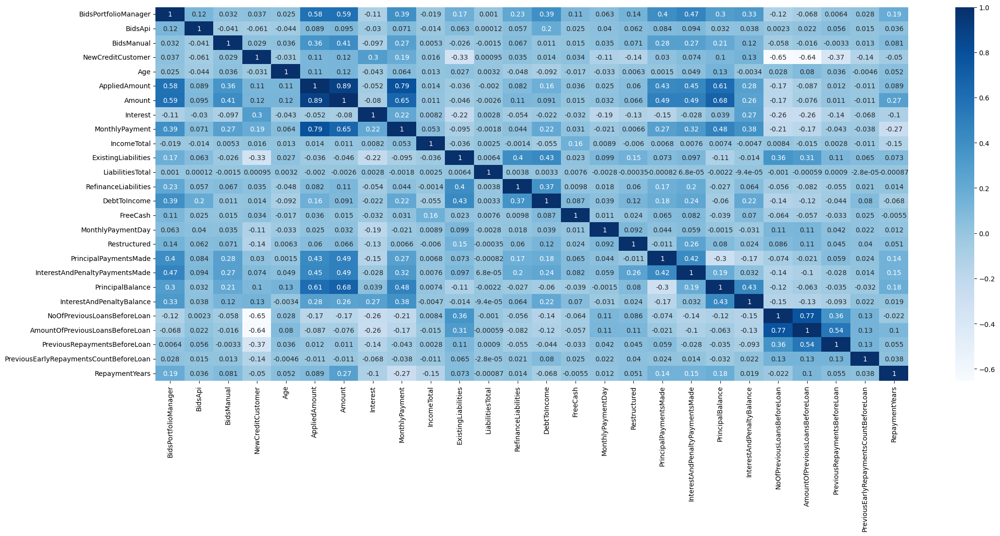

In [ ]:
plt.figure(figsize=(25,10))
sns.heatmap( Reg_DF_Full.corr(), annot=True, cmap='Blues')

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Label encoding for categoricals
for colname in Reg_DF_Full.select_dtypes(["object","category","bool"]):
    Reg_DF_Full[colname], _ = Reg_DF_Full[colname].factorize()

In [ ]:
Reg_DF_Full

,BidsPortfolioManager,BidsApi,BidsManual,NewCreditCustomer,VerificationType,LanguageCode,Age,Gender,Country,AppliedAmount,Amount,Interest,LoanDuration,MonthlyPayment,UseOfLoan,Education,MaritalStatus,EmploymentStatus,EmploymentDurationCurrentEmployer,OccupationArea,HomeOwnershipType,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,RefinanceLiabilities,DebtToIncome,FreeCash,MonthlyPaymentDay,Rating,Restructured,CreditScoreEsMicroL,PrincipalPaymentsMade,InterestAndPenaltyPaymentsMade,PrincipalBalance,InterestAndPenaltyBalance,NoOfPreviousLoansBeforeLoan,AmountOfPreviousLoansBeforeLoan,PreviousRepaymentsBeforeLoan,PreviousEarlyRepaymentsCountBeforeLoan,RepaymentYears
0,0,0,115.0410,0,0,0,61,0,0,319.5582,115.0408,30.00,0,130.393314,0,0,0,0,0,0,0,10500.0,0,0.00,0,0.00,0.00,25,0,0,0,115.0408,20.4222,0.00,0.00,1,83.0852,0.0000,0,0.166667
1,0,0,140.6057,1,0,0,48,0,0,191.7349,140.6057,25.00,1,130.393314,0,1,1,0,1,1,0,10800.0,0,0.00,0,0.00,0.00,15,0,0,0,140.6057,2.0227,0.00,0.00,2,255.6467,258.6256,0,0.166667
2,0,0,319.5580,0,0,0,58,0,0,319.5582,319.5409,25.00,2,130.393314,1,2,0,0,2,2,0,7000.0,0,0.00,0,0.00,0.00,25,0,1,0,203.1909,59.7626,116.35,414.07,0,0.0000,0.0000,0,0.250000
3,0,0,57.5205,0,0,0,23,0,0,127.8233,57.5205,45.00,3,130.393314,2,3,2,1,3,3,0,11600.0,0,0.00,0,0.00,0.00,15,0,0,0,57.5205,18.7323,0.00,0.00,1,134.2144,0.0000,0,0.083333
4,0,0,319.5582,0,0,0,25,0,0,319.5582,319.5436,30.00,0,130.393314,3,2,3,0,3,0,0,6800.0,0,0.00,0,0.00,0.00,25,0,0,0,319.5436,220.4200,0.00,0.00,1,146.9966,0.0000,0,0.250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73899,2515,0,485.0000,0,3,3,37,1,1,3000.0000,3000.0000,31.01,22,107.680000,2,0,2,0,1,3,4,1400.0,1,500.00,0,7.69,792.32,1,3,0,0,2308.1900,0.0000,0.00,0.00,0,0.0000,0.0000,0,0.583333
73900,1880,0,1120.0000,1,3,3,35,1,1,3000.0000,3000.0000,18.25,22,85.330000,1,0,2,0,1,6,0,2265.0,5,1777.46,0,31.58,520.67,7,6,0,0,3000.0000,1990.0300,0.00,0.00,1,3000.0000,389.3600,0,0.583333
73901,1975,0,525.0000,0,2,3,40,1,1,2500.0000,2500.0000,24.83,22,80.420000,2,0,0,4,1,7,0,2500.0,2,1350.00,0,3.22,1069.58,1,4,0,0,1869.7600,199.3300,630.24,1227.98,0,0.0000,0.0000,0,0.583333
73902,1840,0,1160.0000,1,1,0,47,0,0,3000.0000,3000.0000,17.74,22,84.510000,0,1,0,0,1,9,1,540.0,8,732.05,2,44.35,50.49,1,6,1,0,2257.5400,561.5300,0.00,0.00,1,500.0000,96.8000,0,0.583333


In [ ]:
X = Reg_DF_Full.copy()
y = X.pop("RepaymentYears")

In [ ]:
from sklearn.linear_model import LinearRegression
X_train, X_test, y_train, y_test = train_test_split( X , y, stratify=y, random_state=0 )


Preprocessing_Pipeline = Pipeline([
    ("Scaler", StandardScaler() ),
    # ("Transformer", PowerTransformer() ),
])

X_train = Preprocessing_Pipeline.fit_transform(X_train)

lr = LinearRegression()

lr.fit(X_train,y_train)

X_test = Preprocessing_Pipeline.transform(X_test)

print("Linear Regression Test Set Accuracy: " , lr.score(X_test,y_test), "\n" )

Linear Regression Test Set Accuracy:  0.6263571827266103 



In [ ]:
lr.score(X_test ,  y_test)

0.6263571827266103

In [ ]:
results = list(zip(X, lr.coef_))

importance = pd.DataFrame(results, columns = ["Feature", "Coefficient"])
importance = importance.sort_values(by="Coefficient", ascending=False)
importance.sort_values(by="Coefficient" , ascending=False).style.background_gradient(cmap='YlOrRd',axis=0)

,Feature,Coefficient
4,VerificationType,0.018988
7,Gender,0.006522
8,Country,0.005521
16,MaritalStatus,0.004462
12,LoanDuration,0.003141
28,Rating,0.002901
14,UseOfLoan,0.002840
38,PreviousEarlyRepaymentsCountBeforeLoan,0.002837
17,EmploymentStatus,0.001813
18,EmploymentDurationCurrentEmployer,0.001274




---



# **Mutual Information Selection**

To detect any kind of relationship, Unlike correlation that can only detect linear relationships.

In [ ]:
X = df.copy()
y = X.pop("Defaulted")

# Label encoding for categoricals
for colname in X.select_dtypes(["object","category","bool"]):
    X[colname], _ = X[colname].factorize()

# All discrete features should now have integer dtypes (double-check this before using MI!)
discrete_features = X.dtypes == int

In [ ]:
from sklearn.feature_selection import mutual_info_regression

def make_mi_scores(X, y, discrete_features):
    mi_scores = mutual_info_regression(X, y, discrete_features=discrete_features)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=df.drop(columns="Defaulted").columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

mi_scores = make_mi_scores(X, y, discrete_features)

In [ ]:
MI_Score = pd.DataFrame(mi_scores)
MI_Score.style.background_gradient(cmap='YlOrRd',axis=0)

,MI Scores
InterestAndPenaltyBalance,0.674443
PrincipalBalance,0.663651
PrincipalPaymentsMade,0.527632
BidsPortfolioManager,0.316315
MonthlyPayment,0.083060
InterestAndPenaltyPaymentsMade,0.072060
Interest,0.058864
LoanDuration,0.055176
Amount,0.045798
AppliedAmount,0.045470


In [ ]:
MI_Score = pd.DataFrame(mi_scores)
MI_Score.style.background_gradient(cmap='YlOrRd',axis=0)

,MI Scores
InterestAndPenaltyBalance,0.674443
PrincipalBalance,0.663651
PrincipalPaymentsMade,0.527632
BidsPortfolioManager,0.316315
MonthlyPayment,0.083060
InterestAndPenaltyPaymentsMade,0.072060
Interest,0.058864
LoanDuration,0.055176
Amount,0.045798
AppliedAmount,0.045470


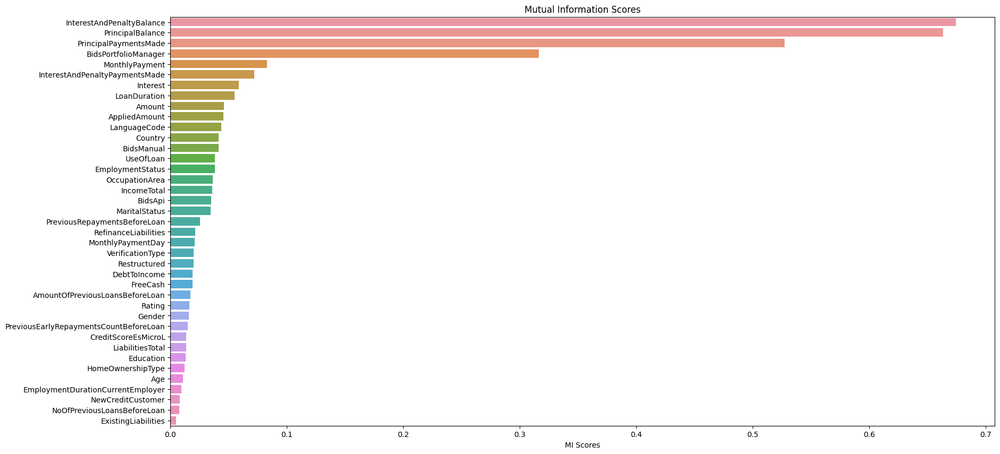

In [ ]:
def plot_mi_scores(scores):
    scores = scores.sort_values(ascending=False)
    sns.barplot(x = scores, y = scores.index)
    plt.title("Mutual Information Scores")


plt.figure(dpi=100, figsize=(20, 10))
plot_mi_scores(mi_scores)

<Figure size 2500x1000 with 0 Axes>

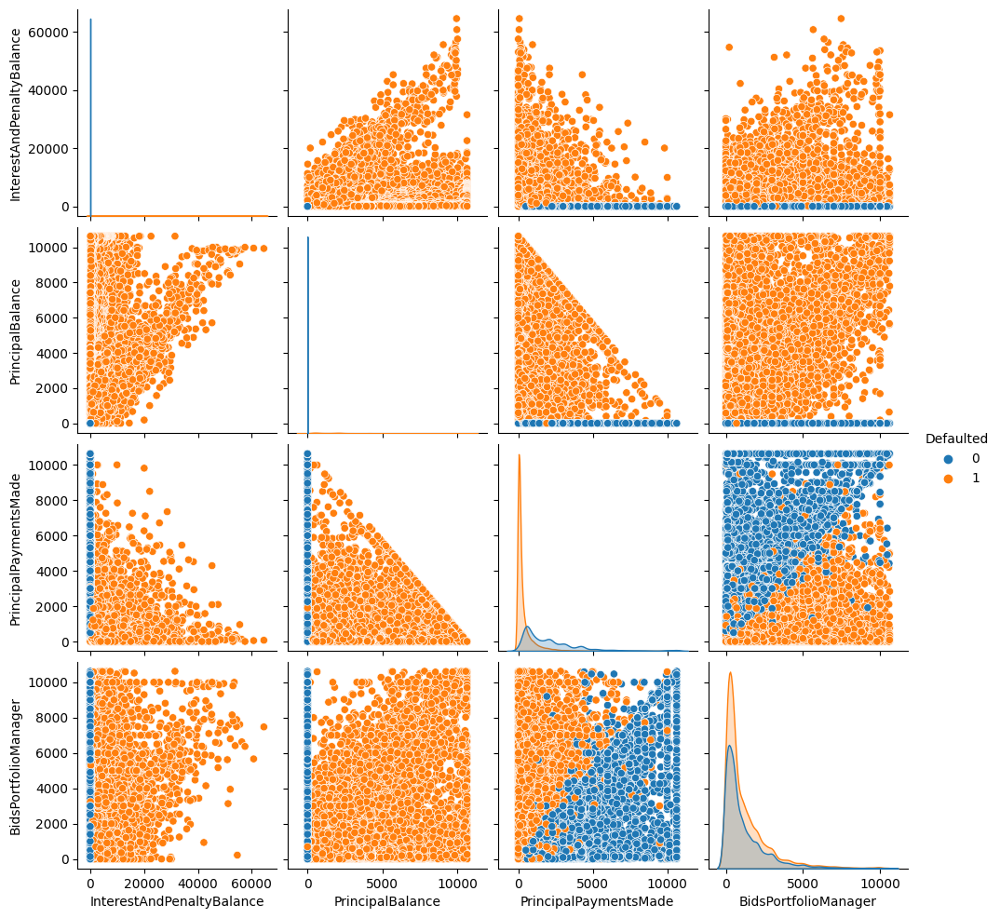

In [ ]:
High_MI_Score = MI_Score.iloc[:4,:].index
High_MI_Score = High_MI_Score.insert(0,"Defaulted")

plt.figure(figsize=(25,10))

sns.pairplot(df[High_MI_Score] , diag_kind="kde" , hue="Defaulted", data=df)

Random Forest Test Set Accuracy:  0.999948317742519 



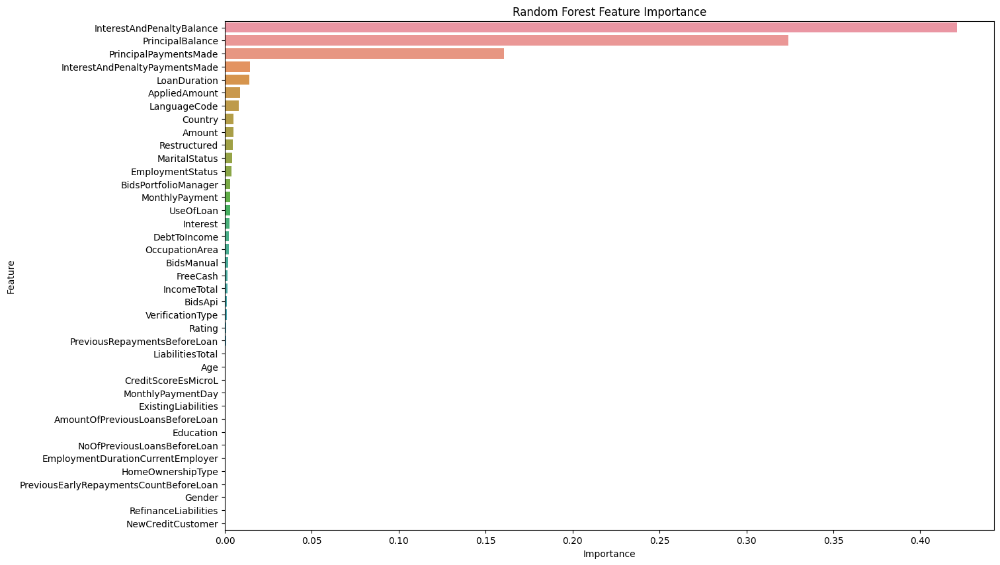

In [ ]:
Test_Performence(X, y)



---



# **Now let's see the correlation between features**

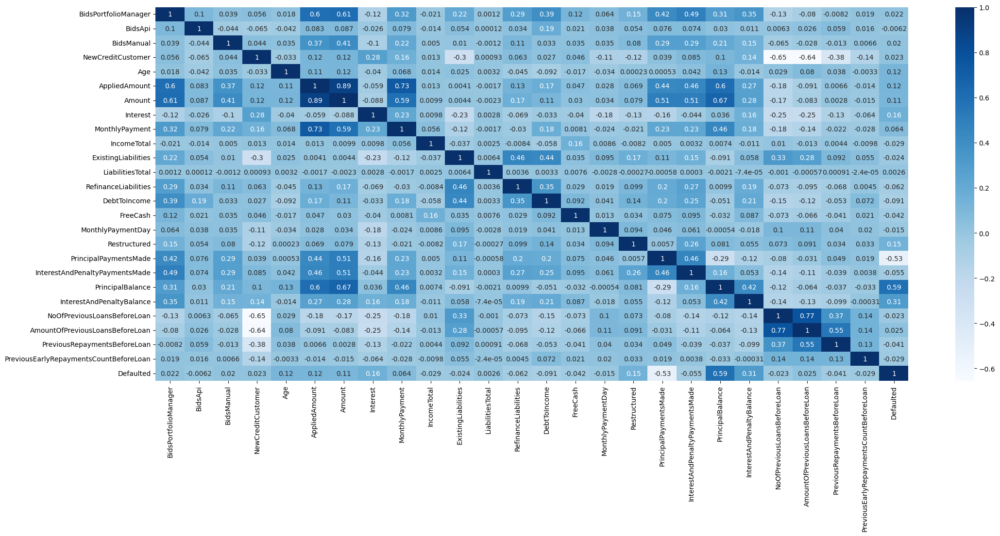

In [ ]:
plt.figure(figsize=(25,10))
sns.heatmap( df.corr(), annot=True, cmap='Blues')

Seperating plots to : High Positive , High Negative , low-no Correlation between Features

> High Positve Correlation

In [ ]:
High_Positive_Corr = df.corr() > 0.5 # high positve correlation
High_Positive_Corr = (High_Positive_Corr==True).sum() > 1 # to find who has correlation with other cloumns 
High_Positive_Corr = High_Positive_Corr[High_Positive_Corr==True].index

High_Positive_Corr

Index(['BidsPortfolioManager', 'AppliedAmount', 'Amount', 'MonthlyPayment',
       'NoOfPreviousLoansBeforeLoan', 'AmountOfPreviousLoansBeforeLoan',
       'PreviousRepaymentsBeforeLoan'],
      dtype='object')

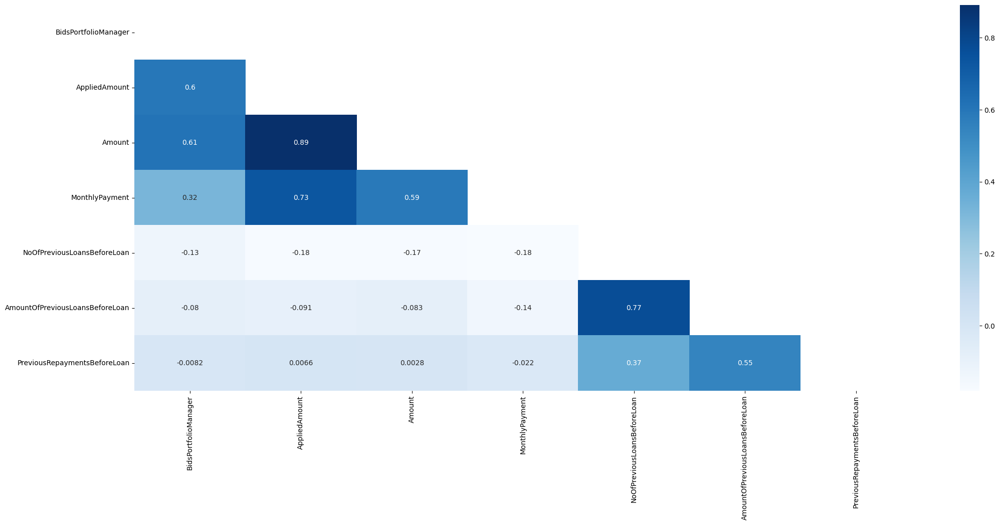

In [ ]:
plt.figure(figsize=(25,10))
mask = np.triu(np.ones_like(df[High_Positive_Corr].corr(), dtype=bool))
sns.heatmap( df[High_Positive_Corr].corr(), annot=True, cmap='Blues', mask=mask)

**Looks like these features are highly positive correlated with each other**

> `AppliedAmount , Amount , MonthlyPayment , PrincipalBalance`

> `BidsPortfolioManager` ----> `AppliedAmount , Amount`

> `Amount` ----> `InterestAndPenaltyPaymentsMade, PrincipalBalance`

> `NoOfPreviousLoansBeforeLoan , AmountOfPreviousLoansBeforeLoan`

> `AmountOfPreviousLoansBeforeLoan` ---->`PreviousRepaymentsBeforeLoan`

> `Defaulted` ----> `PrincipalBalance`, `PrincipalPaymentsMade`

Let's draw a scatter plot to verify this assumptios

In [ ]:
Pos_Corr_Features1 = df[["AppliedAmount" , "Amount" , "MonthlyPayment" , "PrincipalBalance","BidsPortfolioManager"]]
print(Pos_Corr_Features1.info())
print("--------------------------------------------")
Pos_Corr_Features2 = df[["PreviousRepaymentsBeforeLoan" , "NoOfPreviousLoansBeforeLoan" , "AmountOfPreviousLoansBeforeLoan"]]
print(Pos_Corr_Features2.info())
print("--------------------------------------------")
Pos_Corr_Features3 = df[["Amount" , "InterestAndPenaltyPaymentsMade" , "PrincipalBalance"]]
print(Pos_Corr_Features3.info())
print("--------------------------------------------")
Pos_Corr_Features4 = df[["Defaulted" ,"PrincipalBalance"]]
print(Pos_Corr_Features4.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 77394 entries, 0 to 77393
Data columns (total 5 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   AppliedAmount         77394 non-null  float64
 1   Amount                77394 non-null  float64
 2   MonthlyPayment        77394 non-null  float64
 3   PrincipalBalance      77394 non-null  float64
 4   BidsPortfolioManager  77394 non-null  int64  
dtypes: float64(4), int64(1)
memory usage: 3.0 MB
None
--------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 77394 entries, 0 to 77393
Data columns (total 3 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   PreviousRepaymentsBeforeLoan     77394 non-null  float64
 1   NoOfPreviousLoansBeforeLoan      77394 non-null  int64  
 2   AmountOfPreviousLoansBeforeLoan  77394 non-null  float64
dtypes: float64(2

<Figure size 2500x1000 with 0 Axes>

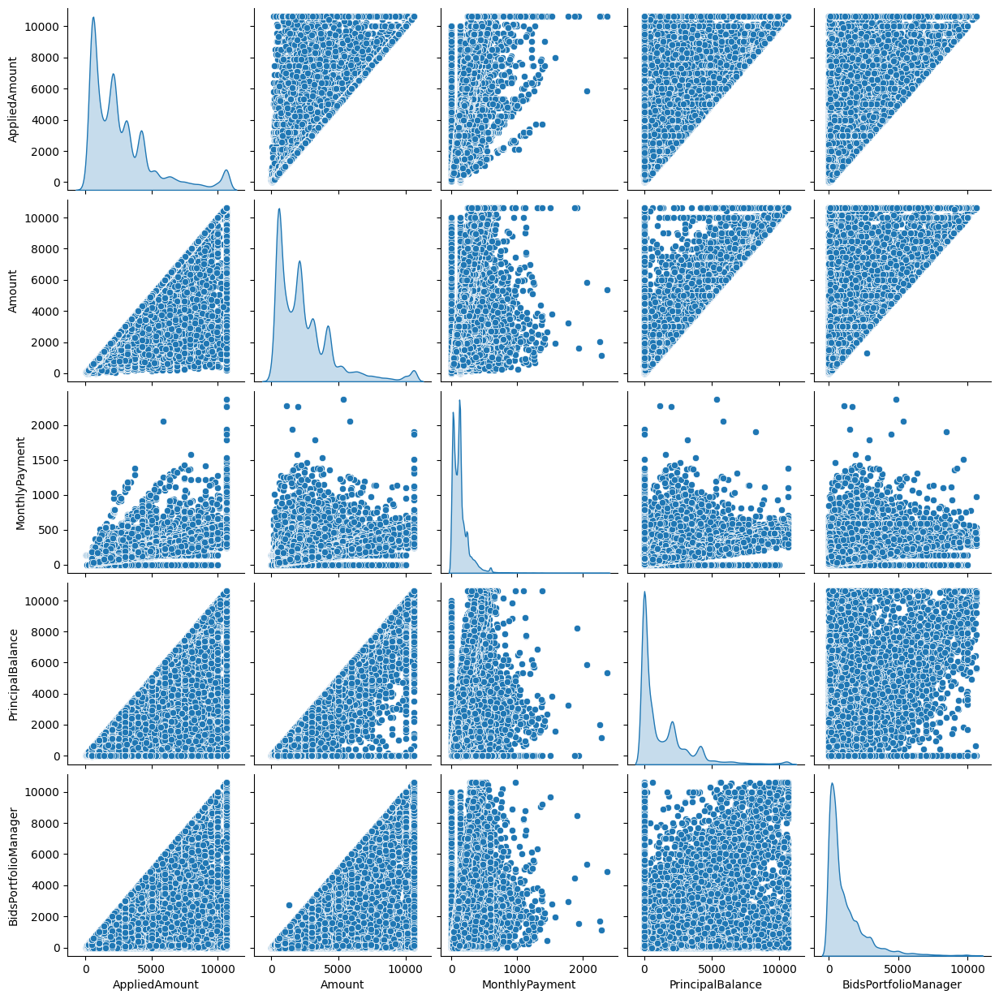

In [ ]:
plt.figure(figsize=(25,10))

sns.pairplot(Pos_Corr_Features1 , diag_kind="kde")

<Figure size 3000x3000 with 0 Axes>

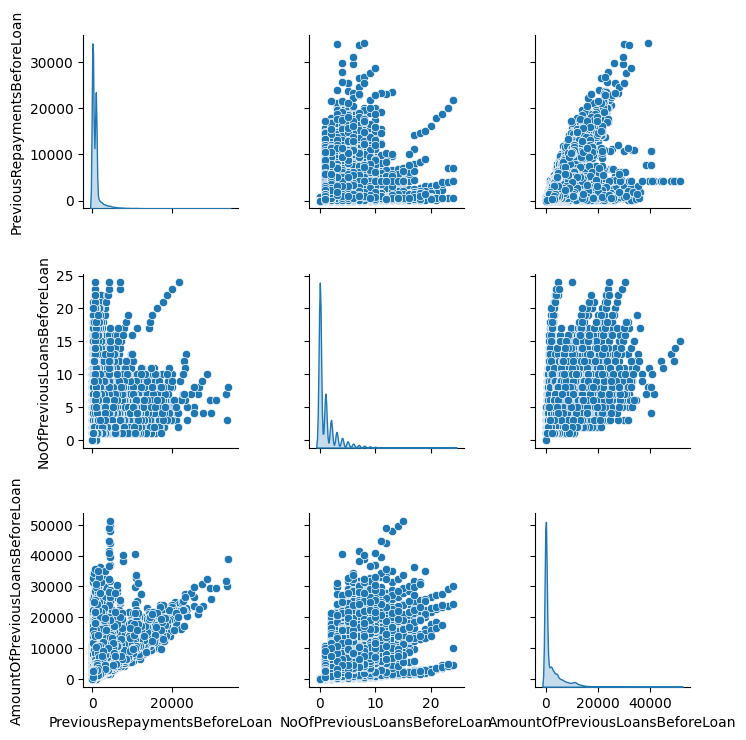

In [ ]:
plt.figure(figsize=(30,30))

sns.pairplot(Pos_Corr_Features2 , diag_kind="kde")

<Figure size 2500x1000 with 0 Axes>

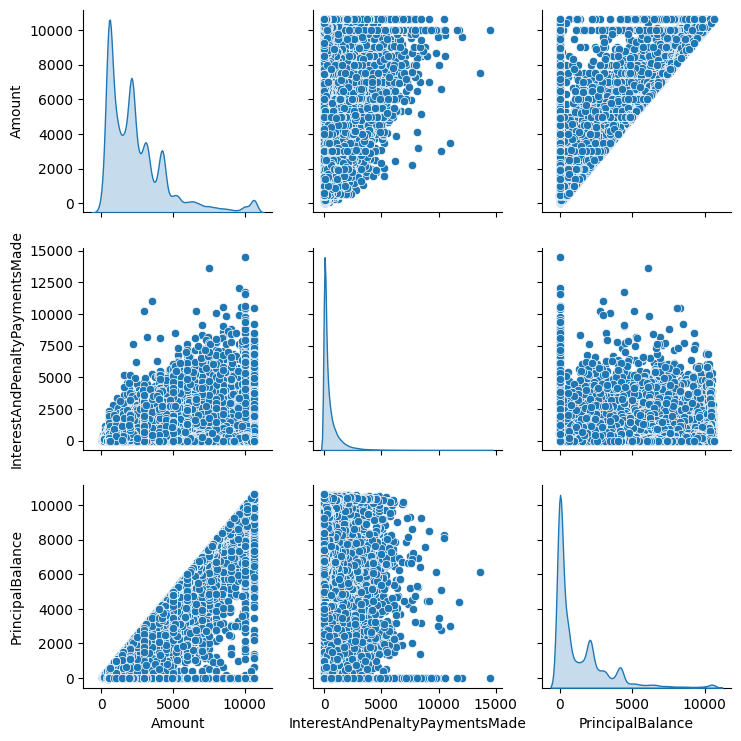

In [ ]:
plt.figure(figsize=(25,10))

sns.pairplot(Pos_Corr_Features3 , diag_kind="kde")

<Figure size 2500x1000 with 0 Axes>

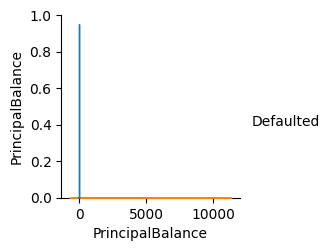

In [ ]:
plt.figure(figsize=(25,10))

sns.pairplot(Pos_Corr_Features4 , diag_kind="kde", hue="Defaulted")

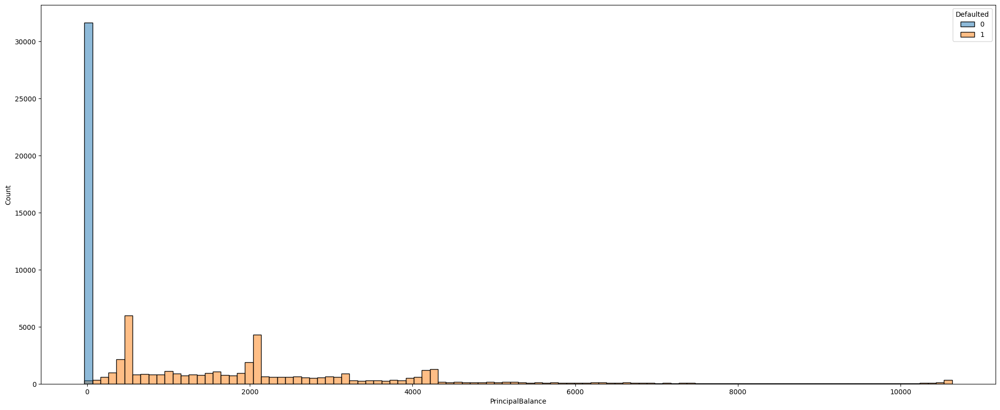

In [ ]:
plt.figure(figsize=(25,10))

sns.histplot(x="PrincipalBalance" , hue="Defaulted", data=Pos_Corr_Features4)

It looks there is actually a postive relationshp between those features



---



High Negative Correlation

In [ ]:
High_Negative_Corr = df.corr() < 0 # high negative correlation

High_Negative_Corr

High_Negative_Corr = (High_Negative_Corr==True).sum() >= 7 # to filter columns with high negative correlation
High_Negative_Corr = High_Negative_Corr[High_Negative_Corr==True].index 

High_Negative_Corr

Index(['NewCreditCustomer', 'Age', 'Interest', 'MonthlyPayment', 'IncomeTotal',
       'LiabilitiesTotal', 'RefinanceLiabilities', 'DebtToIncome', 'FreeCash',
       'MonthlyPaymentDay', 'PrincipalPaymentsMade', 'PrincipalBalance',
       'InterestAndPenaltyBalance', 'NoOfPreviousLoansBeforeLoan',
       'AmountOfPreviousLoansBeforeLoan', 'PreviousRepaymentsBeforeLoan',
       'PreviousEarlyRepaymentsCountBeforeLoan', 'Defaulted'],
      dtype='object')

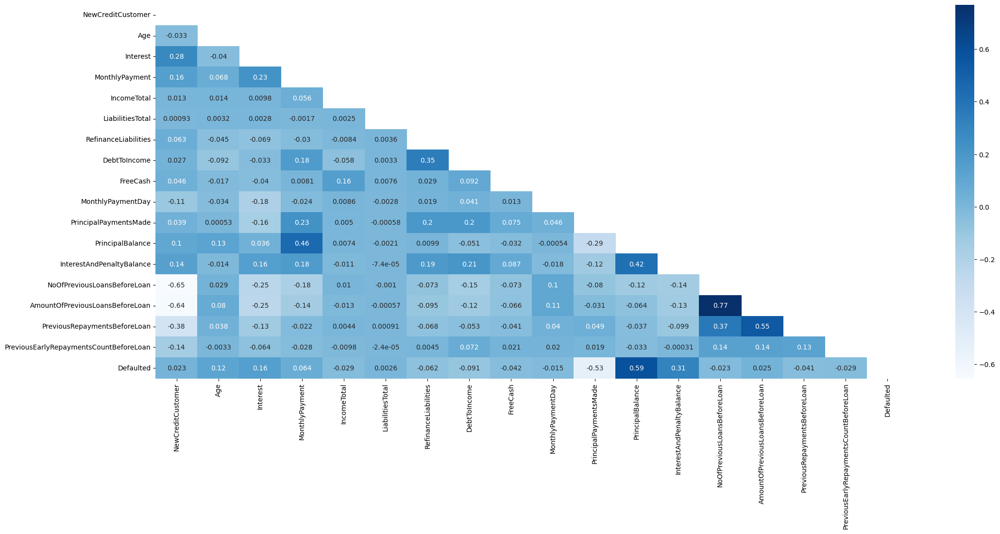

In [ ]:
plt.figure(figsize=(25,10))
mask = np.triu(np.ones_like(df[High_Negative_Corr].corr(), dtype=bool))
sns.heatmap( df[High_Negative_Corr].corr(), annot=True, cmap='Blues', mask=mask)

**Looks like NewCreditCustomer Columns are high negatively corralted with these features**

> `NewCreditCustomer` ----> `AmountOfPreviousLoansBeforeLoan,  NoOfPreviousLoansBeforeLoan`

> `PrincipalPaymentsMade` ----> `Defaulted`

Let's draw a scatter plot to verify this assumptios

In [ ]:
# NewCreditCustomer --> bool
Negative_Corr_Features1 = df[[ "NewCreditCustomer","AmountOfPreviousLoansBeforeLoan", "NoOfPreviousLoansBeforeLoan", "PrincipalBalance"]]

Negative_Corr_Features2 = df[["Defaulted" , "PrincipalPaymentsMade"]]

In [ ]:
print(Negative_Corr_Features1.info())
print("--------------------------------------------")
print(Negative_Corr_Features2.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 77394 entries, 0 to 77393
Data columns (total 4 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   NewCreditCustomer                77394 non-null  bool   
 1   AmountOfPreviousLoansBeforeLoan  77394 non-null  float64
 2   NoOfPreviousLoansBeforeLoan      77394 non-null  int64  
 3   PrincipalBalance                 77394 non-null  float64
dtypes: bool(1), float64(2), int64(1)
memory usage: 1.8 MB
None
--------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 77394 entries, 0 to 77393
Data columns (total 2 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Defaulted              77394 non-null  int64  
 1   PrincipalPaymentsMade  77394 non-null  float64
dtypes: float64(1), int64(1)
memory usage: 1.2 MB
None


<Figure size 2500x1000 with 0 Axes>

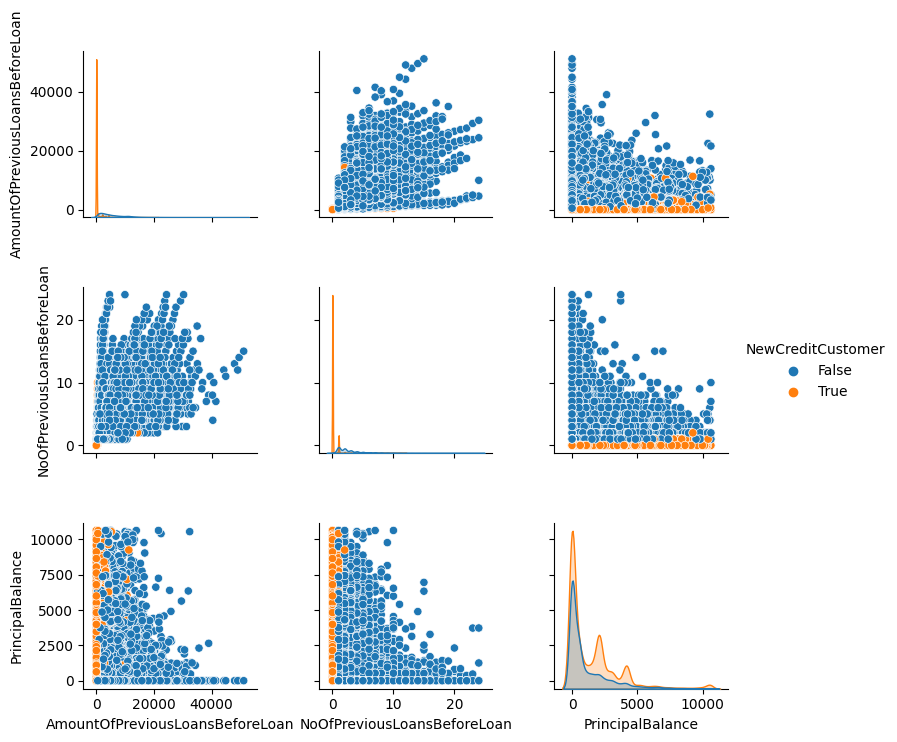

In [ ]:
plt.figure(figsize=(25,10))

sns.pairplot(Negative_Corr_Features1, diag_kind="kde" , hue="NewCreditCustomer")

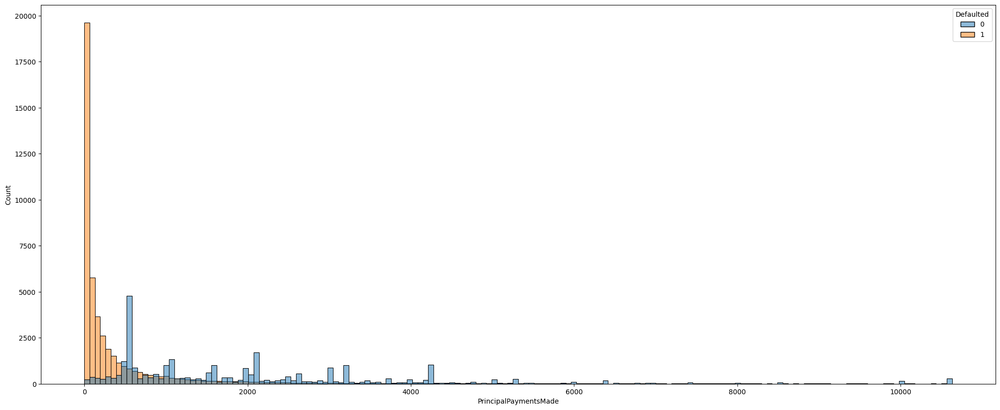

In [ ]:
plt.figure(figsize=(25,10))

sns.histplot(x="PrincipalPaymentsMade" , hue="Defaulted", data=Negative_Corr_Features2)

It looks there is actually a negative relationshp between NewCreditCustomer Column and those features



---



**Low Corrlated Features (No Correlation)**

In [ ]:
low_corr_features = df.drop( columns=Pos_Corr_Features1.columns)
low_corr_features = low_corr_features.drop( columns=Pos_Corr_Features2.columns)
low_corr_features = low_corr_features.drop( columns=["InterestAndPenaltyPaymentsMade","Defaulted"])
low_corr_features = low_corr_features.drop( columns=["NewCreditCustomer","PrincipalPaymentsMade"])

low_corr_features

,BidsApi,BidsManual,VerificationType,LanguageCode,Age,Gender,Country,Interest,LoanDuration,UseOfLoan,Education,MaritalStatus,EmploymentStatus,EmploymentDurationCurrentEmployer,OccupationArea,HomeOwnershipType,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,RefinanceLiabilities,DebtToIncome,FreeCash,MonthlyPaymentDay,Rating,Restructured,CreditScoreEsMicroL,InterestAndPenaltyBalance,PreviousEarlyRepaymentsCountBeforeLoan
0,0,115.0410,Unverified/Cross Referenced Phone,Estonian,61,Woman,Estonia,30.00,12,Other,Vocational Education,Married,Fully Employed,UpTo3Years,Retail and Wholesale,Owner,10500.0,0,0.00,0,0.00,0.00,25,F,False,M,0.00,0
1,0,140.6057,Unverified/Cross Referenced Phone,Estonian,48,Woman,Estonia,25.00,1,Other,Higher Education,Divorced,Fully Employed,MoreThan5Years,Education,Owner,10800.0,0,0.00,0,0.00,0.00,15,F,False,M,0.00,0
2,0,319.5580,Unverified/Cross Referenced Phone,Estonian,58,Woman,Estonia,25.00,20,Home Improvement,Secondary Education,Married,Fully Employed,UpTo4Years,Mining,Owner,7000.0,0,0.00,0,0.00,0.00,25,F,True,M,414.07,0
3,0,57.5205,Unverified/Cross Referenced Phone,Estonian,23,Woman,Estonia,45.00,15,Loan Consolidation,Basic Education,Single,Not Specified,UpTo2Years,Other,Owner,11600.0,0,0.00,0,0.00,0.00,15,F,False,M,0.00,0
4,0,319.5582,Unverified/Cross Referenced Phone,Estonian,25,Woman,Estonia,30.00,12,Vehicle,Secondary Education,Cohabitant,Fully Employed,UpTo2Years,Retail and Wholesale,Owner,6800.0,0,0.00,0,0.00,0.00,25,F,False,M,0.00,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77389,0,485.0000,Income Verified,Finnish,37,Male,Finland,31.01,60,Loan Consolidation,Vocational Education,Single,Fully Employed,MoreThan5Years,Other,Council House,1400.0,1,500.00,0,7.69,792.32,1,E,False,M,0.00,0
77390,0,1120.0000,Income Verified,Finnish,35,Male,Finland,18.25,60,Home Improvement,Vocational Education,Single,Fully Employed,MoreThan5Years,Transport and Warehousing,Owner,2265.0,5,1777.46,0,31.58,520.67,7,B,False,M,0.00,0
77391,0,525.0000,Income Unverified,Finnish,40,Male,Finland,24.83,60,Loan Consolidation,Vocational Education,Married,Entrepreneur,MoreThan5Years,Construction,Owner,2500.0,2,1350.00,0,3.22,1069.58,1,D,False,M,1227.98,0
77392,0,1160.0000,Income Expenses Verified,Estonian,47,Woman,Estonia,17.74,60,Other,Higher Education,Married,Fully Employed,MoreThan5Years,Healthcare and SocialHelp,"Tenant, Unfurnished Property",540.0,8,732.05,2,44.35,50.49,1,B,True,M,0.00,0


In [ ]:
low_corr_features.dtypes

BidsApi                                      int64
BidsManual                                 float64
VerificationType                          category
LanguageCode                              category
Age                                          int64
Gender                                    category
Country                                   category
Interest                                   float64
LoanDuration                              category
UseOfLoan                                 category
Education                                 category
MaritalStatus                             category
EmploymentStatus                          category
EmploymentDurationCurrentEmployer         category
OccupationArea                            category
HomeOwnershipType                         category
IncomeTotal                                float64
ExistingLiabilities                          int64
LiabilitiesTotal                           float64
RefinanceLiabilities           

In [ ]:
low_corr_features.iloc[: , :10].dtypes

BidsApi                int64
BidsManual           float64
VerificationType    category
LanguageCode        category
Age                    int64
Gender              category
Country             category
Interest             float64
LoanDuration        category
UseOfLoan           category
dtype: object

<Figure size 2500x1000 with 0 Axes>

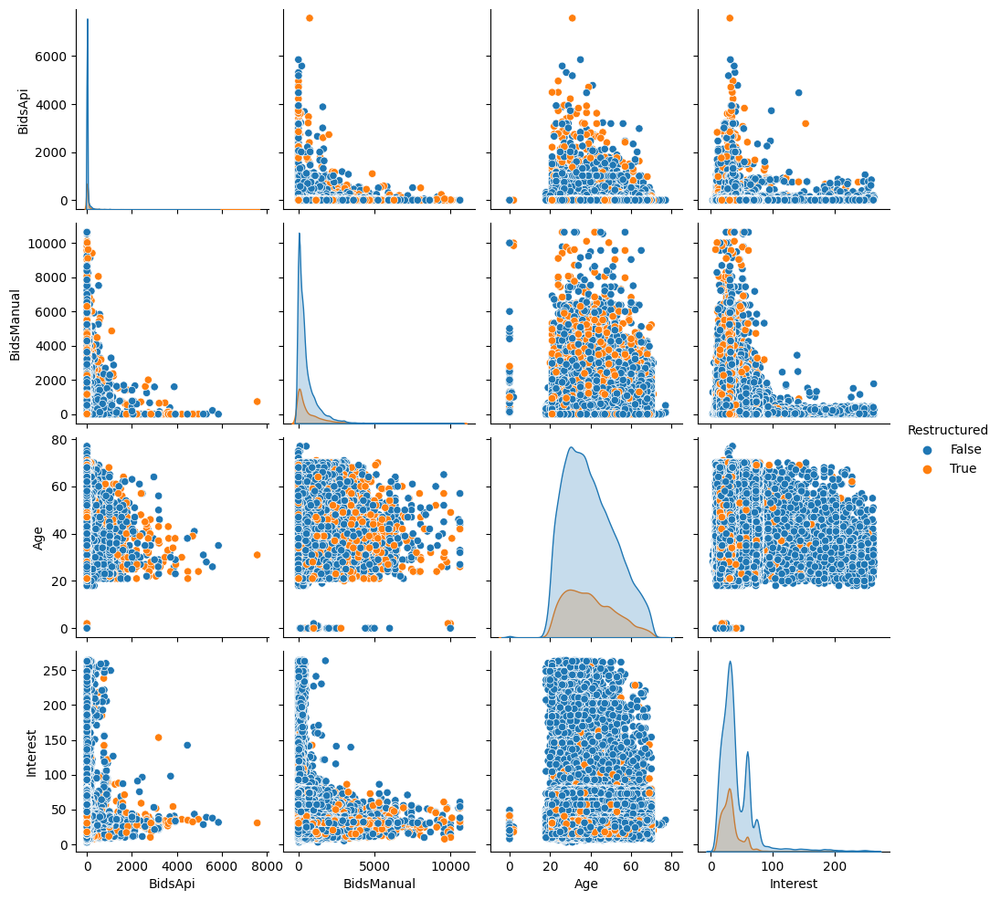

In [ ]:
plt.figure(figsize=(25,10))

low_corr_features1 = low_corr_features.iloc[: , :10]
low_corr_features1["Restructured"] = low_corr_features["Restructured"]

sns.pairplot(low_corr_features1 , diag_kind="kde" ,hue="Restructured" )

In [ ]:
low_corr_features.iloc[: , 10:20].dtypes

Education                            category
MaritalStatus                        category
EmploymentStatus                     category
EmploymentDurationCurrentEmployer    category
OccupationArea                       category
HomeOwnershipType                    category
IncomeTotal                           float64
ExistingLiabilities                     int64
LiabilitiesTotal                      float64
RefinanceLiabilities                    int64
dtype: object

<Figure size 2500x1000 with 0 Axes>

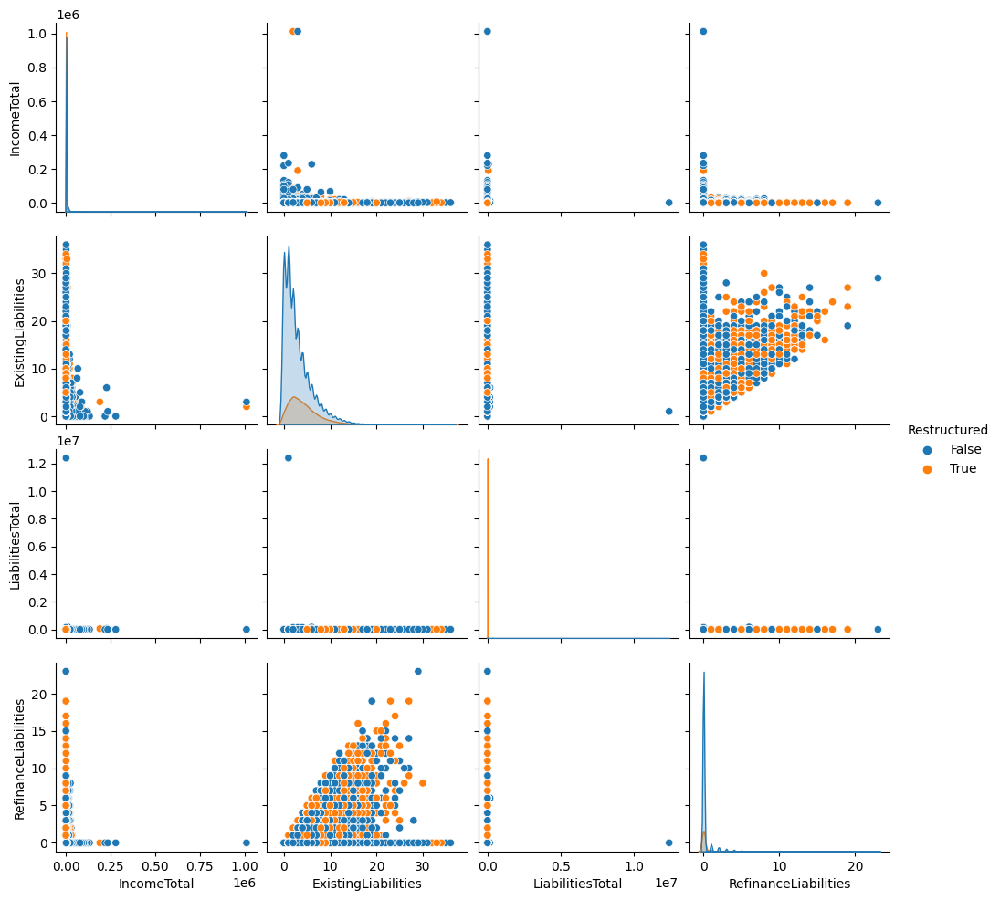

In [ ]:
plt.figure(figsize=(25,10))

low_corr_features2 = low_corr_features.iloc[: , 10:20]
low_corr_features2["Restructured"] = low_corr_features["Restructured"]

sns.pairplot(low_corr_features2 , diag_kind="kde" , hue="Restructured")

In [ ]:
low_corr_features.iloc[: , 20:].dtypes

DebtToIncome                               float64
FreeCash                                   float64
MonthlyPaymentDay                            int64
Rating                                    category
Restructured                                  bool
CreditScoreEsMicroL                       category
InterestAndPenaltyBalance                  float64
PreviousEarlyRepaymentsCountBeforeLoan       int64
dtype: object

<Figure size 2500x1000 with 0 Axes>

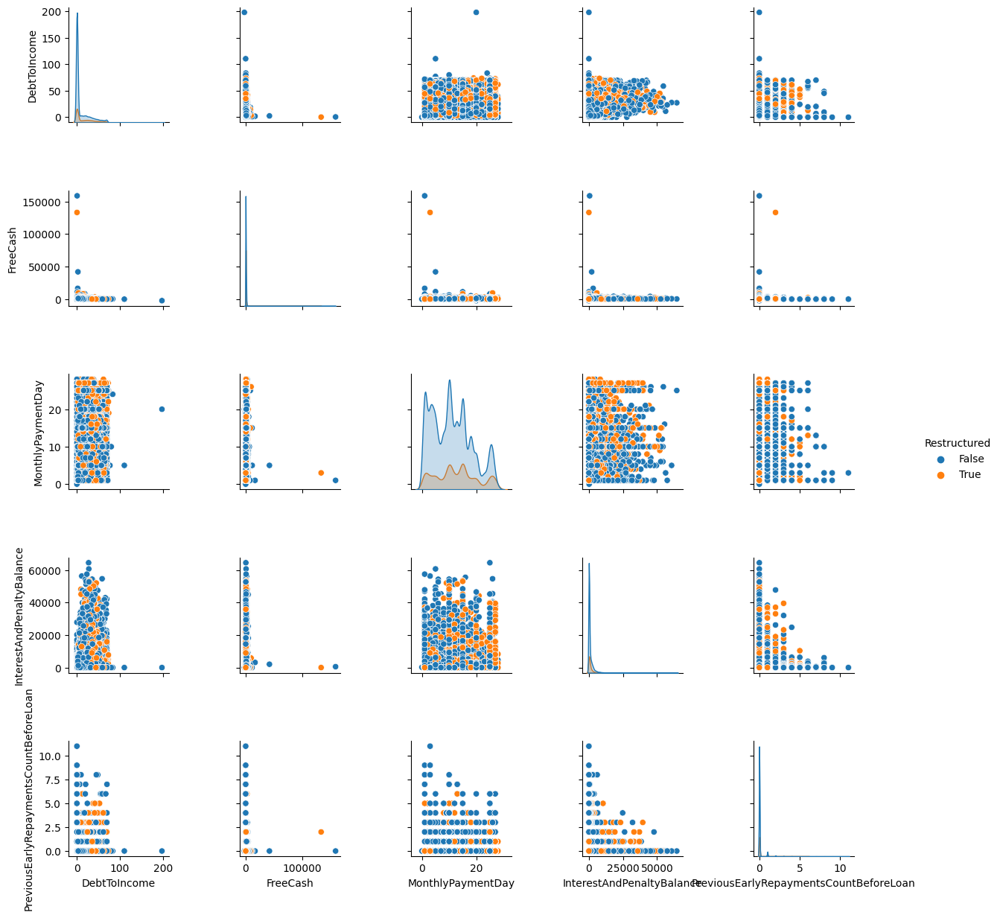

In [ ]:
plt.figure(figsize=(25,10))

low_corr_features3 = low_corr_features.iloc[: , 20:]
low_corr_features3["Restructured"] = low_corr_features["Restructured"]

sns.pairplot(low_corr_features3 , diag_kind="kde" , hue="Restructured")

It looks like there is no actuall relationshp between those features



---



# **Feature Selection based on Correlation**

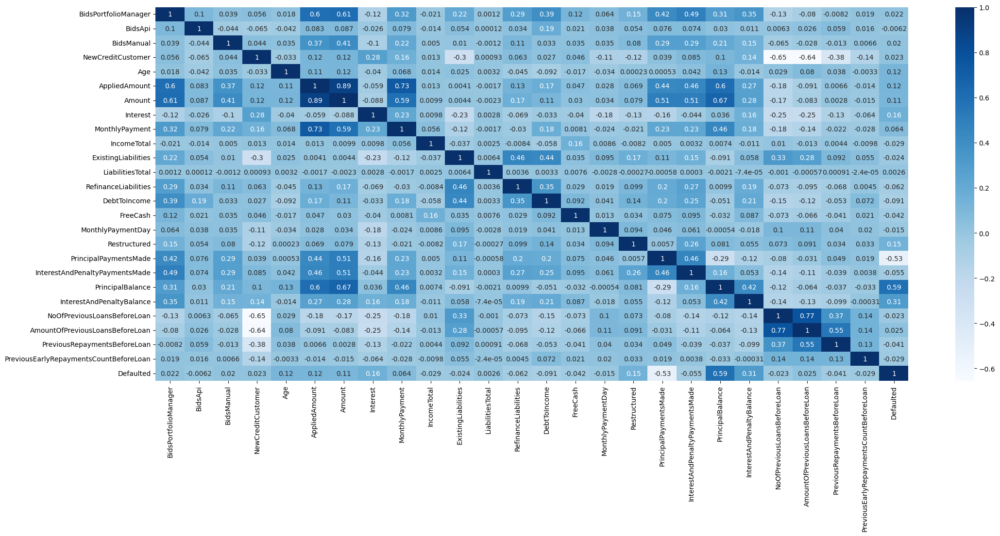

In [ ]:
plt.figure(figsize=(25,10))
sns.heatmap( df.corr(), annot=True, cmap='Blues')

In [ ]:
df = df.drop(columns=["NewCreditCustomer","Amount","AmountOfPreviousLoansBeforeLoan","AppliedAmount"])

Removed Selected Features that has more than one high positive correlation to other features

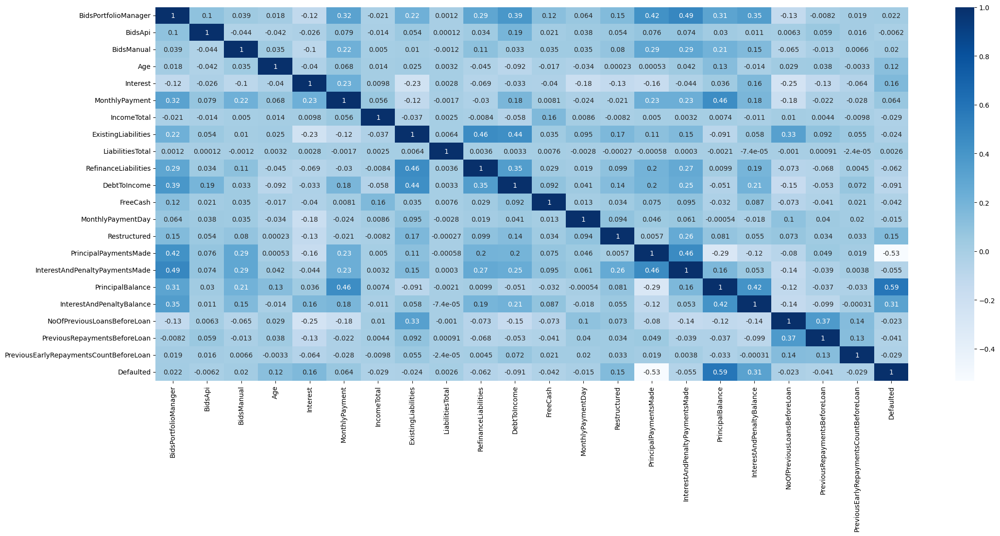

In [ ]:
plt.figure(figsize=(25,10))
sns.heatmap( df.corr(), annot=True, cmap='Blues')

Random Forest Test Set Accuracy:  0.999948317742519 



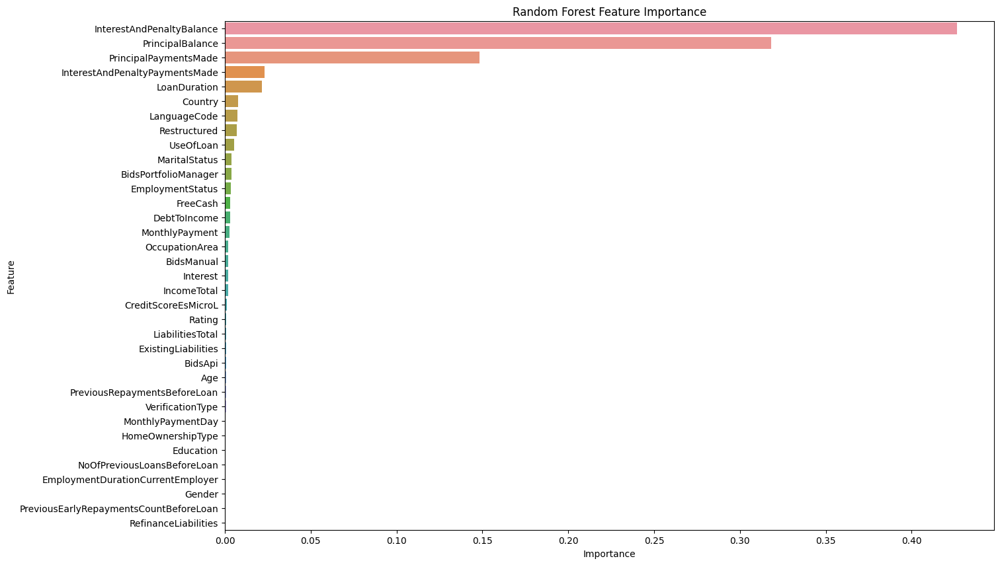

In [ ]:
X = df.copy()
y = X.pop("Defaulted")

# Label encoding for categoricals
for colname in X.select_dtypes(["object","category","bool"]):
    X[colname], _ = X[colname].factorize()

Test_Performence(X, y)

In [ ]:
df.shape

(77394, 36)



---



# **Dropping Features that won't be available in Deployment (Data Leakage)**



In [ ]:
df.columns

Index(['BidsPortfolioManager', 'BidsApi', 'BidsManual', 'VerificationType',
       'LanguageCode', 'Age', 'Gender', 'Country', 'Interest', 'LoanDuration',
       'MonthlyPayment', 'UseOfLoan', 'Education', 'MaritalStatus',
       'EmploymentStatus', 'EmploymentDurationCurrentEmployer',
       'OccupationArea', 'HomeOwnershipType', 'IncomeTotal',
       'ExistingLiabilities', 'LiabilitiesTotal', 'RefinanceLiabilities',
       'DebtToIncome', 'FreeCash', 'MonthlyPaymentDay', 'Rating',
       'Restructured', 'CreditScoreEsMicroL', 'PrincipalPaymentsMade',
       'InterestAndPenaltyPaymentsMade', 'PrincipalBalance',
       'InterestAndPenaltyBalance', 'NoOfPreviousLoansBeforeLoan',
       'PreviousRepaymentsBeforeLoan',
       'PreviousEarlyRepaymentsCountBeforeLoan', 'Defaulted'],
      dtype='object')

In [ ]:
df = df.drop( columns=["PrincipalPaymentsMade","PrincipalBalance","InterestAndPenaltyPaymentsMade","InterestAndPenaltyBalance","Restructured"] )
df

,BidsPortfolioManager,BidsApi,BidsManual,VerificationType,LanguageCode,Age,Gender,Country,Interest,LoanDuration,MonthlyPayment,UseOfLoan,Education,MaritalStatus,EmploymentStatus,EmploymentDurationCurrentEmployer,OccupationArea,HomeOwnershipType,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,RefinanceLiabilities,DebtToIncome,FreeCash,MonthlyPaymentDay,Rating,CreditScoreEsMicroL,NoOfPreviousLoansBeforeLoan,PreviousRepaymentsBeforeLoan,PreviousEarlyRepaymentsCountBeforeLoan,Defaulted
0,0,0,115.0410,Unverified/Cross Referenced Phone,Estonian,61,Woman,Estonia,30.00,12,130.393314,Other,Vocational Education,Married,Fully Employed,UpTo3Years,Retail and Wholesale,Owner,10500.0,0,0.00,0,0.00,0.00,25,F,M,1,0.0000,0,0
1,0,0,140.6057,Unverified/Cross Referenced Phone,Estonian,48,Woman,Estonia,25.00,1,130.393314,Other,Higher Education,Divorced,Fully Employed,MoreThan5Years,Education,Owner,10800.0,0,0.00,0,0.00,0.00,15,F,M,2,258.6256,0,0
2,0,0,319.5580,Unverified/Cross Referenced Phone,Estonian,58,Woman,Estonia,25.00,20,130.393314,Home Improvement,Secondary Education,Married,Fully Employed,UpTo4Years,Mining,Owner,7000.0,0,0.00,0,0.00,0.00,25,F,M,0,0.0000,0,1
3,0,0,57.5205,Unverified/Cross Referenced Phone,Estonian,23,Woman,Estonia,45.00,15,130.393314,Loan Consolidation,Basic Education,Single,Not Specified,UpTo2Years,Other,Owner,11600.0,0,0.00,0,0.00,0.00,15,F,M,1,0.0000,0,0
4,0,0,319.5582,Unverified/Cross Referenced Phone,Estonian,25,Woman,Estonia,30.00,12,130.393314,Vehicle,Secondary Education,Cohabitant,Fully Employed,UpTo2Years,Retail and Wholesale,Owner,6800.0,0,0.00,0,0.00,0.00,25,F,M,1,0.0000,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77389,2515,0,485.0000,Income Verified,Finnish,37,Male,Finland,31.01,60,107.680000,Loan Consolidation,Vocational Education,Single,Fully Employed,MoreThan5Years,Other,Council House,1400.0,1,500.00,0,7.69,792.32,1,E,M,0,0.0000,0,0
77390,1880,0,1120.0000,Income Verified,Finnish,35,Male,Finland,18.25,60,85.330000,Home Improvement,Vocational Education,Single,Fully Employed,MoreThan5Years,Transport and Warehousing,Owner,2265.0,5,1777.46,0,31.58,520.67,7,B,M,1,389.3600,0,0
77391,1975,0,525.0000,Income Unverified,Finnish,40,Male,Finland,24.83,60,80.420000,Loan Consolidation,Vocational Education,Married,Entrepreneur,MoreThan5Years,Construction,Owner,2500.0,2,1350.00,0,3.22,1069.58,1,D,M,0,0.0000,0,1
77392,1840,0,1160.0000,Income Expenses Verified,Estonian,47,Woman,Estonia,17.74,60,84.510000,Other,Higher Education,Married,Fully Employed,MoreThan5Years,Healthcare and SocialHelp,"Tenant, Unfurnished Property",540.0,8,732.05,2,44.35,50.49,1,B,M,1,96.8000,0,0


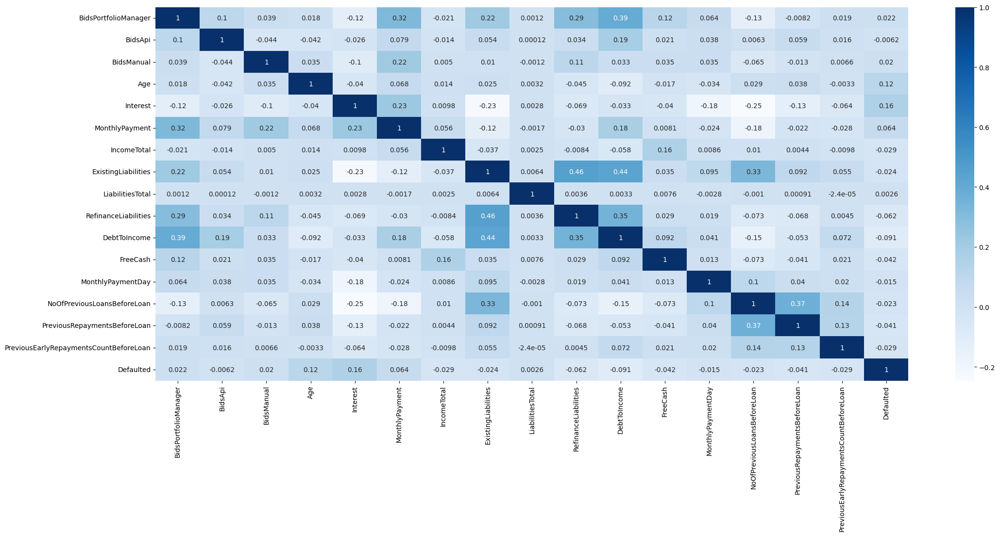

In [ ]:
plt.figure(figsize=(25,10))
sns.heatmap( df.corr(), annot=True, cmap='Blues')

In [ ]:
X = df.copy()
y = X.pop("Defaulted")

# Label encoding for categoricals
for colname in X.select_dtypes(["object","category","bool"]):
    X[colname], _ = X[colname].factorize()

# All discrete features should now have integer dtypes (double-check this before using MI!)
discrete_features = X.dtypes == int

In [ ]:
from sklearn.feature_selection import mutual_info_regression

def make_mi_scores(X, y, discrete_features):
    mi_scores = mutual_info_regression(X, y, discrete_features=discrete_features)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=df.drop(columns="Defaulted").columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

mi_scores = make_mi_scores(X, y, discrete_features)

In [ ]:
MI_Score = pd.DataFrame(mi_scores)
MI_Score.style.background_gradient(cmap='YlOrRd',axis=0)

,MI Scores
BidsPortfolioManager,0.324445
MonthlyPayment,0.086941
LoanDuration,0.058427
Interest,0.057430
BidsManual,0.043841
LanguageCode,0.040916
Country,0.040072
MaritalStatus,0.037883
EmploymentStatus,0.035185
IncomeTotal,0.035097


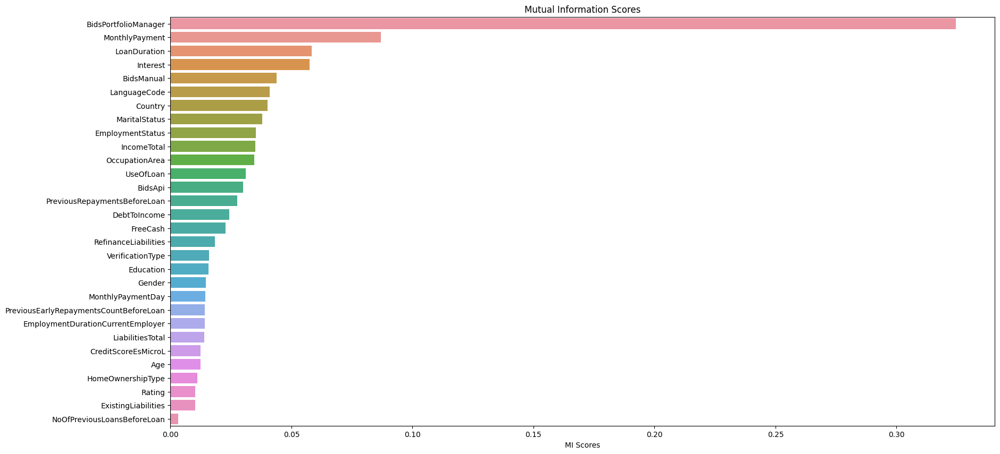

In [ ]:
def plot_mi_scores(scores):
    scores = scores.sort_values(ascending=False)
    sns.barplot(x = scores, y = scores.index)
    plt.title("Mutual Information Scores")


plt.figure(dpi=100, figsize=(20, 10))
plot_mi_scores(mi_scores)

<Figure size 2500x1000 with 0 Axes>

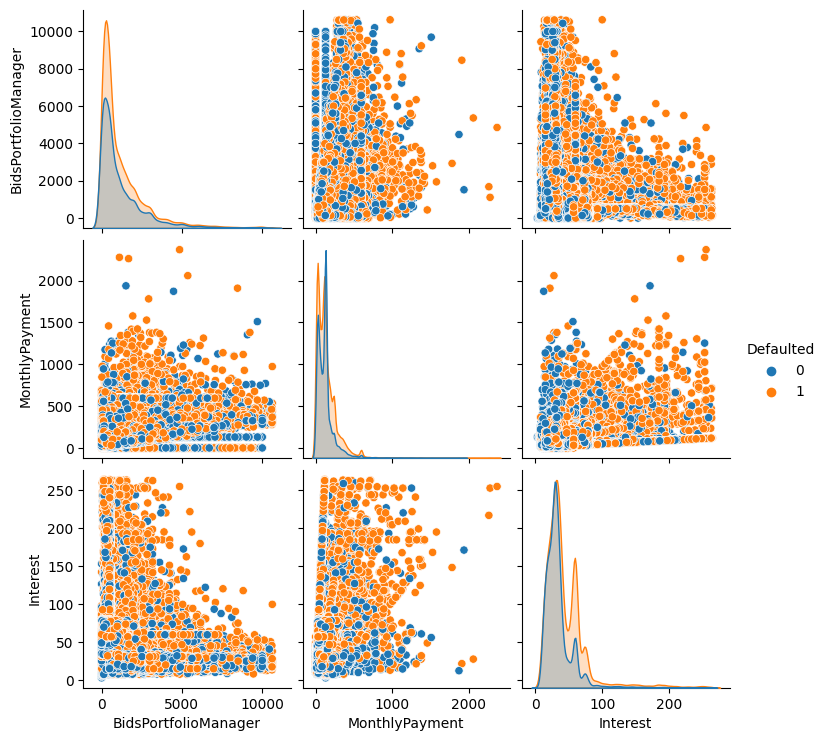

In [ ]:
High_MI_Score = MI_Score.iloc[:4,:].index
High_MI_Score = High_MI_Score.insert(0,"Defaulted")

plt.figure(figsize=(25,10))

sns.pairplot(df[High_MI_Score] , diag_kind="kde" , hue="Defaulted", data=df)

Random Forest Test Set Accuracy:  0.7489792754147501 



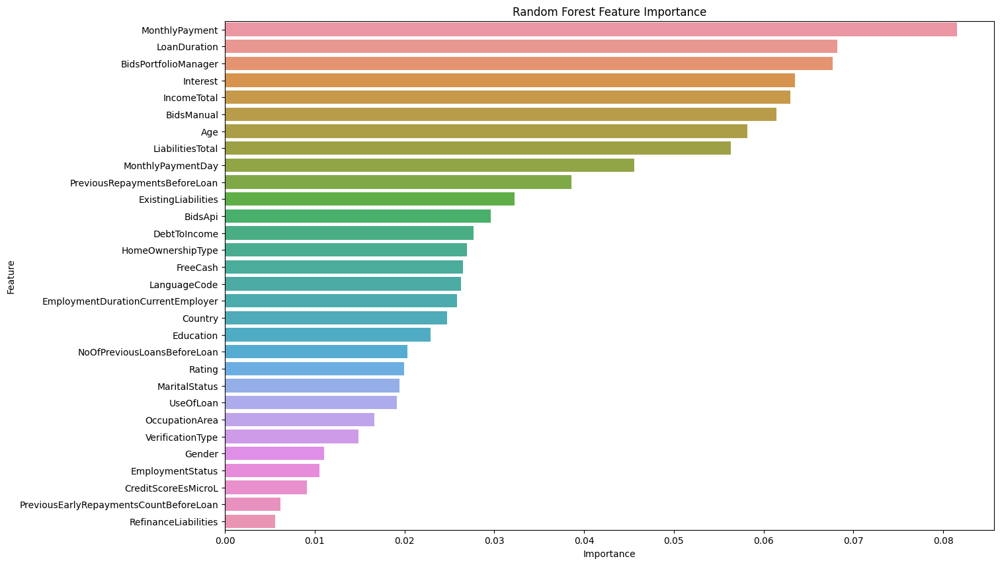

In [ ]:
Test_Performence(X, y)

In [ ]:
df.to_csv('/content/drive/MyDrive/Technocolabs/Bondora_modeling.csv',index=False)

# **Removing Outliers**

In [ ]:
dtypes = pd.DataFrame(df.dtypes,columns=["Data Type"])

dtypes["Unique Values"]=df.nunique().sort_values(ascending=True)

dtypes["Null Values"]=df.isnull().sum()

dtypes["% null Values"]=df.isnull().sum()/len(df)

dtypes.sort_values(by="Unique Values" , ascending=False).style.background_gradient(cmap='YlOrRd',axis=0)

,Data Type,Unique Values,Null Values,% null Values
LiabilitiesTotal,float64,28843,0,0.000000
PreviousRepaymentsBeforeLoan,float64,26751,0,0.000000
FreeCash,float64,21493,0,0.000000
MonthlyPayment,float64,21335,0,0.000000
DebtToIncome,float64,6723,0,0.000000
Interest,float64,5981,0,0.000000
BidsPortfolioManager,int64,5277,0,0.000000
BidsManual,float64,3876,0,0.000000
IncomeTotal,float64,3744,0,0.000000
BidsApi,int64,716,0,0.000000


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 77394 entries, 0 to 77393
Data columns (total 31 columns):
 #   Column                                  Non-Null Count  Dtype   
---  ------                                  --------------  -----   
 0   BidsPortfolioManager                    77394 non-null  int64   
 1   BidsApi                                 77394 non-null  int64   
 2   BidsManual                              77394 non-null  float64 
 3   VerificationType                        77394 non-null  category
 4   LanguageCode                            77394 non-null  category
 5   Age                                     77394 non-null  int64   
 6   Gender                                  77394 non-null  category
 7   Country                                 77394 non-null  category
 8   Interest                                77394 non-null  float64 
 9   LoanDuration                            77394 non-null  category
 10  MonthlyPayment                          77394 

In [ ]:
df.describe()

,BidsPortfolioManager,BidsApi,BidsManual,Age,Interest,MonthlyPayment,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,RefinanceLiabilities,DebtToIncome,FreeCash,MonthlyPaymentDay,NoOfPreviousLoansBeforeLoan,PreviousRepaymentsBeforeLoan,PreviousEarlyRepaymentsCountBeforeLoan,Defaulted
count,77394.000000,77394.000000,77394.000000,77394.000000,77394.00000,77394.000000,7.739400e+04,77394.000000,7.739400e+04,77394.000000,77394.000000,77394.000000,77394.000000,77394.000000,77394.000000,77394.000000,77394.000000
mean,1221.504303,32.766506,563.032056,39.611611,40.30165,130.393314,1.868975e+03,3.350815,7.149255e+02,0.300127,12.011918,195.241403,11.356539,1.140799,861.138387,0.077474,0.591415
std,1531.208800,163.557245,821.757218,12.188868,30.61795,125.725231,6.193487e+03,3.494328,4.459142e+04,1.123265,18.824047,848.437821,7.336154,2.028045,1799.053621,0.384662,0.491575
min,0.000000,0.000000,0.000000,0.000000,3.00000,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,-2332.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,246.000000,0.000000,19.000000,30.000000,23.42000,43.070000,8.900000e+02,1.000000,1.130400e+02,0.000000,0.000000,0.000000,5.000000,0.000000,0.000000,0.000000,0.000000
50%,613.000000,0.000000,283.000000,38.000000,31.95500,113.040000,1.300000e+03,2.000000,3.830000e+02,0.000000,0.000000,0.000000,10.000000,0.000000,366.270000,0.000000,1.000000
75%,1629.000000,5.000000,745.000000,48.000000,50.33000,162.107500,2.000000e+03,5.000000,7.360000e+02,0.000000,20.790000,269.007500,16.000000,1.000000,861.138387,0.000000,1.000000
max,10625.000000,7570.000000,10630.000000,77.000000,264.31000,2368.540000,1.012019e+06,36.000000,1.240000e+07,23.000000,198.020000,158748.640000,28.000000,24.000000,34077.420000,11.000000,1.000000


In [ ]:
Numeric_Cols = [ col for col in df if df[col].dtype in ["int64","float64"]]
print(len(Numeric_Cols))

Numeric_Cols

17


['BidsPortfolioManager',
 'BidsApi',
 'BidsManual',
 'Age',
 'Interest',
 'MonthlyPayment',
 'IncomeTotal',
 'ExistingLiabilities',
 'LiabilitiesTotal',
 'RefinanceLiabilities',
 'DebtToIncome',
 'FreeCash',
 'MonthlyPaymentDay',
 'NoOfPreviousLoansBeforeLoan',
 'PreviousRepaymentsBeforeLoan',
 'PreviousEarlyRepaymentsCountBeforeLoan',
 'Defaulted']

**Removing Outliers with standard deviation**

In [ ]:
X = df.copy()


for col in X[Numeric_Cols]:
  mean, std = df[col].mean(), df[col].std()
  cut_off = std * 3
  low, high = mean - cut_off, mean + cut_off 
  mask = X[col].between(low, high)
  X = X[mask]
  
y = X.pop("Defaulted")
X.describe()

,BidsPortfolioManager,BidsApi,BidsManual,Age,Interest,MonthlyPayment,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,RefinanceLiabilities,DebtToIncome,FreeCash,MonthlyPaymentDay,NoOfPreviousLoansBeforeLoan,PreviousRepaymentsBeforeLoan,PreviousEarlyRepaymentsCountBeforeLoan
count,63421.000000,63421.000000,63421.000000,63421.000000,63421.000000,63421.000000,63421.000000,63421.000000,63421.000000,63421.000000,63421.000000,63421.000000,63421.000000,63421.000000,63421.000000,63421.000000
mean,1012.054666,16.234433,509.468561,39.719036,37.445566,116.358971,1693.303756,2.817537,470.560276,0.127828,9.846139,181.271505,11.272717,0.944908,663.071879,0.039971
std,1089.859180,52.895189,606.928498,12.321953,19.748748,90.818060,1793.915061,2.626739,636.551562,0.489735,16.534077,344.630942,7.268558,1.474537,942.394467,0.195893
min,0.000000,0.000000,0.000000,18.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-106.000000,0.000000,0.000000,0.000000,0.000000
25%,230.000000,0.000000,50.000000,30.000000,23.830000,42.310000,868.000000,1.000000,94.090000,0.000000,0.000000,0.000000,5.000000,0.000000,0.000000,0.000000
50%,560.000000,0.000000,297.000000,38.000000,32.180000,111.480000,1290.000000,2.000000,350.000000,0.000000,0.000000,0.000000,10.000000,0.000000,446.100000,0.000000
75%,1474.000000,5.000000,732.000000,48.000000,49.260000,149.300000,1960.000000,4.000000,655.000000,0.000000,15.800000,257.020000,15.000000,1.000000,861.138387,0.000000
max,5815.000000,522.000000,3028.000000,76.000000,132.100000,507.530000,20424.000000,13.000000,80133.090000,3.000000,68.480000,2739.860000,28.000000,7.000000,6258.250000,1.000000


In [ ]:
X

,BidsPortfolioManager,BidsApi,BidsManual,VerificationType,LanguageCode,Age,Gender,Country,Interest,LoanDuration,MonthlyPayment,UseOfLoan,Education,MaritalStatus,EmploymentStatus,EmploymentDurationCurrentEmployer,OccupationArea,HomeOwnershipType,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,RefinanceLiabilities,DebtToIncome,FreeCash,MonthlyPaymentDay,Rating,CreditScoreEsMicroL,NoOfPreviousLoansBeforeLoan,PreviousRepaymentsBeforeLoan,PreviousEarlyRepaymentsCountBeforeLoan
0,0,0,115.0410,Unverified/Cross Referenced Phone,Estonian,61,Woman,Estonia,30.00,12,130.393314,Other,Vocational Education,Married,Fully Employed,UpTo3Years,Retail and Wholesale,Owner,10500.0,0,0.00,0,0.00,0.00,25,F,M,1,0.0000,0
1,0,0,140.6057,Unverified/Cross Referenced Phone,Estonian,48,Woman,Estonia,25.00,1,130.393314,Other,Higher Education,Divorced,Fully Employed,MoreThan5Years,Education,Owner,10800.0,0,0.00,0,0.00,0.00,15,F,M,2,258.6256,0
2,0,0,319.5580,Unverified/Cross Referenced Phone,Estonian,58,Woman,Estonia,25.00,20,130.393314,Home Improvement,Secondary Education,Married,Fully Employed,UpTo4Years,Mining,Owner,7000.0,0,0.00,0,0.00,0.00,25,F,M,0,0.0000,0
3,0,0,57.5205,Unverified/Cross Referenced Phone,Estonian,23,Woman,Estonia,45.00,15,130.393314,Loan Consolidation,Basic Education,Single,Not Specified,UpTo2Years,Other,Owner,11600.0,0,0.00,0,0.00,0.00,15,F,M,1,0.0000,0
4,0,0,319.5582,Unverified/Cross Referenced Phone,Estonian,25,Woman,Estonia,30.00,12,130.393314,Vehicle,Secondary Education,Cohabitant,Fully Employed,UpTo2Years,Retail and Wholesale,Owner,6800.0,0,0.00,0,0.00,0.00,25,F,M,1,0.0000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77389,2515,0,485.0000,Income Verified,Finnish,37,Male,Finland,31.01,60,107.680000,Loan Consolidation,Vocational Education,Single,Fully Employed,MoreThan5Years,Other,Council House,1400.0,1,500.00,0,7.69,792.32,1,E,M,0,0.0000,0
77390,1880,0,1120.0000,Income Verified,Finnish,35,Male,Finland,18.25,60,85.330000,Home Improvement,Vocational Education,Single,Fully Employed,MoreThan5Years,Transport and Warehousing,Owner,2265.0,5,1777.46,0,31.58,520.67,7,B,M,1,389.3600,0
77391,1975,0,525.0000,Income Unverified,Finnish,40,Male,Finland,24.83,60,80.420000,Loan Consolidation,Vocational Education,Married,Entrepreneur,MoreThan5Years,Construction,Owner,2500.0,2,1350.00,0,3.22,1069.58,1,D,M,0,0.0000,0
77392,1840,0,1160.0000,Income Expenses Verified,Estonian,47,Woman,Estonia,17.74,60,84.510000,Other,Higher Education,Married,Fully Employed,MoreThan5Years,Healthcare and SocialHelp,"Tenant, Unfurnished Property",540.0,8,732.05,2,44.35,50.49,1,B,M,1,96.8000,0


**Removing Outliers with Percentile**

In [ ]:
X = df.copy()


for col in X[Numeric_Cols]:
  low, high = X[col].quantile([0.001, 0.99])
  mask = X[col].between(low, high)
  X = X[mask]
  
X.describe()

,BidsPortfolioManager,BidsApi,BidsManual,Age,Interest,MonthlyPayment,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,RefinanceLiabilities,DebtToIncome,FreeCash,MonthlyPaymentDay,NoOfPreviousLoansBeforeLoan,PreviousRepaymentsBeforeLoan,PreviousEarlyRepaymentsCountBeforeLoan,Defaulted
count,67314.000000,67314.000000,67314.000000,67314.000000,67314.000000,67314.000000,67314.000000,67314.000000,67314.000000,67314.000000,67314.000000,67314.000000,67314.000000,67314.000000,67314.000000,67314.000000,67314.000000
mean,1090.128829,18.931664,521.134080,39.406676,38.968312,121.309184,1566.985944,2.984461,457.186368,0.184390,10.470692,169.250573,11.264447,1.023769,741.728369,0.056838,0.594171
std,1241.473769,63.810147,653.071835,11.961415,24.786051,103.430620,1320.812465,2.832269,447.702311,0.698066,17.053851,304.657832,7.245247,1.655135,1209.987956,0.263637,0.491055
min,0.000000,0.000000,0.000000,18.000000,8.080000,0.000000,200.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,245.000000,0.000000,32.000000,30.000000,23.680000,42.035000,856.000000,1.000000,100.000000,0.000000,0.000000,0.000000,5.000000,0.000000,0.000000,0.000000,0.000000
50%,585.000000,0.000000,290.000000,38.000000,32.040000,109.900000,1250.000000,2.000000,353.240000,0.000000,0.000000,0.000000,10.000000,0.000000,434.085000,0.000000,1.000000
75%,1513.000000,5.000000,735.000000,48.000000,50.655000,154.227500,1900.000000,4.000000,659.385000,0.000000,17.810000,257.000000,15.000000,1.000000,861.138387,0.000000,1.000000
max,7575.000000,635.000000,3770.000000,68.000000,191.300000,594.880000,13700.000000,16.000000,2491.000000,5.000000,67.970000,1535.800000,27.000000,9.000000,9376.220000,2.000000,1.000000


In [ ]:
df = X
df

,BidsPortfolioManager,BidsApi,BidsManual,VerificationType,LanguageCode,Age,Gender,Country,Interest,LoanDuration,MonthlyPayment,UseOfLoan,Education,MaritalStatus,EmploymentStatus,EmploymentDurationCurrentEmployer,OccupationArea,HomeOwnershipType,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,RefinanceLiabilities,DebtToIncome,FreeCash,MonthlyPaymentDay,Rating,CreditScoreEsMicroL,NoOfPreviousLoansBeforeLoan,PreviousRepaymentsBeforeLoan,PreviousEarlyRepaymentsCountBeforeLoan,Defaulted
0,0,0,115.0410,Unverified/Cross Referenced Phone,Estonian,61,Woman,Estonia,30.00,12,130.393314,Other,Vocational Education,Married,Fully Employed,UpTo3Years,Retail and Wholesale,Owner,10500.0,0,0.00,0,0.00,0.00,25,F,M,1,0.0000,0,0
1,0,0,140.6057,Unverified/Cross Referenced Phone,Estonian,48,Woman,Estonia,25.00,1,130.393314,Other,Higher Education,Divorced,Fully Employed,MoreThan5Years,Education,Owner,10800.0,0,0.00,0,0.00,0.00,15,F,M,2,258.6256,0,0
2,0,0,319.5580,Unverified/Cross Referenced Phone,Estonian,58,Woman,Estonia,25.00,20,130.393314,Home Improvement,Secondary Education,Married,Fully Employed,UpTo4Years,Mining,Owner,7000.0,0,0.00,0,0.00,0.00,25,F,M,0,0.0000,0,1
3,0,0,57.5205,Unverified/Cross Referenced Phone,Estonian,23,Woman,Estonia,45.00,15,130.393314,Loan Consolidation,Basic Education,Single,Not Specified,UpTo2Years,Other,Owner,11600.0,0,0.00,0,0.00,0.00,15,F,M,1,0.0000,0,0
4,0,0,319.5582,Unverified/Cross Referenced Phone,Estonian,25,Woman,Estonia,30.00,12,130.393314,Vehicle,Secondary Education,Cohabitant,Fully Employed,UpTo2Years,Retail and Wholesale,Owner,6800.0,0,0.00,0,0.00,0.00,25,F,M,1,0.0000,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77389,2515,0,485.0000,Income Verified,Finnish,37,Male,Finland,31.01,60,107.680000,Loan Consolidation,Vocational Education,Single,Fully Employed,MoreThan5Years,Other,Council House,1400.0,1,500.00,0,7.69,792.32,1,E,M,0,0.0000,0,0
77390,1880,0,1120.0000,Income Verified,Finnish,35,Male,Finland,18.25,60,85.330000,Home Improvement,Vocational Education,Single,Fully Employed,MoreThan5Years,Transport and Warehousing,Owner,2265.0,5,1777.46,0,31.58,520.67,7,B,M,1,389.3600,0,0
77391,1975,0,525.0000,Income Unverified,Finnish,40,Male,Finland,24.83,60,80.420000,Loan Consolidation,Vocational Education,Married,Entrepreneur,MoreThan5Years,Construction,Owner,2500.0,2,1350.00,0,3.22,1069.58,1,D,M,0,0.0000,0,1
77392,1840,0,1160.0000,Income Expenses Verified,Estonian,47,Woman,Estonia,17.74,60,84.510000,Other,Higher Education,Married,Fully Employed,MoreThan5Years,Healthcare and SocialHelp,"Tenant, Unfurnished Property",540.0,8,732.05,2,44.35,50.49,1,B,M,1,96.8000,0,0


In [ ]:
#df.to_csv('/content/drive/MyDrive/Technocolabs/Bondora_modeling.csv',index=False)



---



# **Encoding Categorcial Features with Label Encoding**

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Label encoding for categoricals
for colname in df.select_dtypes(["object","category","bool"]):
    df[colname], _ = df[colname].factorize()

Random Forest Test Set Accuracy:  0.7412799334482144 



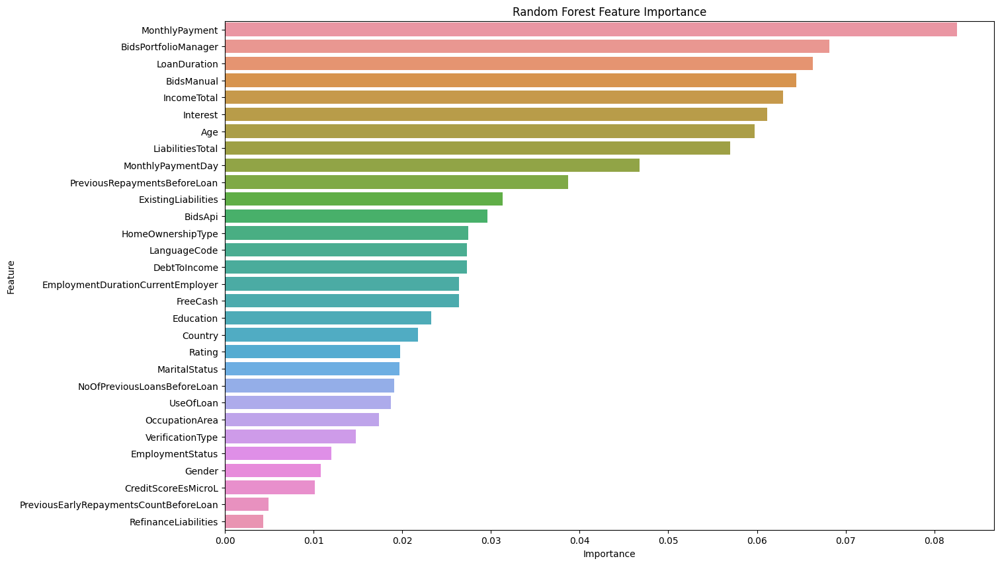

In [ ]:
X = df.copy()
y = X.pop("Defaulted")

Test_Performence(X, y)



---



# **Scaling and Normalization**

**Normalization with StandardScaler**
> Changes Values but keeps the same distribution

In [ ]:
from sklearn.preprocessing import StandardScaler

In [ ]:
Scaler = StandardScaler()
X_scaled = Scaler.fit_transform(X)

In [ ]:
X_scaled = pd.DataFrame(X_scaled, columns=df.drop(columns="Defaulted").columns)
X_scaled

,BidsPortfolioManager,BidsApi,BidsManual,VerificationType,LanguageCode,Age,Gender,Country,Interest,LoanDuration,MonthlyPayment,UseOfLoan,Education,MaritalStatus,EmploymentStatus,EmploymentDurationCurrentEmployer,OccupationArea,HomeOwnershipType,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,RefinanceLiabilities,DebtToIncome,FreeCash,MonthlyPaymentDay,Rating,CreditScoreEsMicroL,NoOfPreviousLoansBeforeLoan,PreviousRepaymentsBeforeLoan,PreviousEarlyRepaymentsCountBeforeLoan
0,-0.878099,-0.29669,-0.621825,-2.165641,-1.025965,1.805262,-1.460706,-0.864736,-0.361832,-3.102634,0.087829,-1.702118,-1.326498,-2.031734,-0.924485,-1.372827,-2.356221,-1.015396,6.763322,-1.053743,-1.021191,-0.264145,-0.613983,-0.555547,1.895816,-1.216256,-0.353922,-0.014361,-0.613009,-0.215594
1,-0.878099,-0.29669,-0.582679,-2.165641,-1.025965,0.718426,-1.460706,-0.864736,-0.563560,-2.951204,0.087829,-1.702118,-0.437305,-1.477649,-0.924485,-0.905602,-2.116953,-1.015396,6.990457,-1.053743,-1.021191,-0.264145,-0.613983,-0.555547,0.515591,-1.216256,-0.353922,0.589824,-0.399265,-0.215594
2,-0.878099,-0.29669,-0.308661,-2.165641,-1.025965,1.554453,-1.460706,-0.864736,-0.563560,-2.799774,0.087829,-1.429353,0.451888,-2.031734,-0.924485,-0.438378,-1.877686,-1.015396,4.113418,-1.053743,-1.021191,-0.264145,-0.613983,-0.555547,1.895816,-1.216256,-0.353922,-0.618546,-0.613009,-0.215594
3,-0.878099,-0.29669,-0.709902,-2.165641,-1.025965,-1.371644,-1.460706,-0.864736,0.243352,-2.648344,0.087829,-1.156589,1.341082,-0.923565,0.177686,0.028847,-1.638418,-1.015396,7.596149,-1.053743,-1.021191,-0.264145,-0.613983,-0.555547,0.515591,-1.216256,-0.353922,-0.014361,-0.613009,-0.215594
4,-0.878099,-0.29669,-0.308660,-2.165641,-1.025965,-1.204438,-1.460706,-0.864736,-0.361832,-3.102634,0.087829,-0.883824,0.451888,-0.369480,-0.924485,0.028847,-2.356221,-1.015396,3.961995,-1.053743,-1.021191,-0.264145,-0.613983,-0.555547,1.895816,-1.216256,-0.353922,-0.014361,-0.613009,-0.215594
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67309,1.147734,-0.29669,-0.055330,2.085726,0.564130,-0.201205,0.358562,0.367406,-0.321083,0.228830,-0.131772,-1.156589,-1.326498,-0.923565,-0.924485,-0.905602,-1.638418,0.641643,-0.126428,-0.700666,0.095630,-0.264145,-0.163055,2.045160,-1.416725,0.786105,-0.353922,-0.618546,-0.613009,-0.215594
67310,0.636241,-0.29669,0.917005,2.085726,0.564130,-0.368410,0.358562,0.367406,-0.835892,0.228830,-0.347861,-1.429353,-1.326498,-0.923565,-0.924485,-0.905602,0.275723,-1.015396,0.528477,0.711639,2.949021,-0.264145,1.237812,1.153497,-0.588590,1.787286,-0.353922,-0.014361,-0.291219,-0.215594
67311,0.712764,-0.29669,0.005920,0.668604,0.564130,0.049604,0.358562,0.367406,-0.570418,0.228830,-0.395333,-1.156589,-1.326498,-2.031734,2.382027,-0.905602,-0.920615,-1.015396,0.706399,-0.347590,1.994228,-0.264145,-0.425168,2.955237,-1.416725,0.285515,-0.353922,-0.618546,-0.613009,-0.215594
67312,0.604021,-0.29669,0.978255,-0.748519,-1.025965,0.634823,-1.460706,-0.864736,-0.856468,0.228830,-0.355789,-1.702118,-0.437305,-2.031734,-0.924485,-0.905602,0.993525,-0.601136,-0.777547,1.770869,0.613947,2.600935,1.986622,-0.389819,-1.416725,1.787286,-0.353922,-0.014361,-0.533008,-0.215594


In [ ]:
X_scaled.describe()

,BidsPortfolioManager,BidsApi,BidsManual,VerificationType,LanguageCode,Age,Gender,Country,Interest,LoanDuration,MonthlyPayment,UseOfLoan,Education,MaritalStatus,EmploymentStatus,EmploymentDurationCurrentEmployer,OccupationArea,HomeOwnershipType,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,RefinanceLiabilities,DebtToIncome,FreeCash,MonthlyPaymentDay,Rating,CreditScoreEsMicroL,NoOfPreviousLoansBeforeLoan,PreviousRepaymentsBeforeLoan,PreviousEarlyRepaymentsCountBeforeLoan
count,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04
mean,-1.070342e-16,-1.604458e-17,-1.051342e-16,-1.925350e-16,-7.848123e-17,-6.037829e-17,-4.053368e-17,-3.852811e-17,2.406687e-16,1.857794e-17,1.604458e-16,6.755613e-18,-8.951188e-17,-1.351123e-16,-3.546697e-17,-3.800032e-17,4.560039e-17,-6.924504e-17,-1.688903e-18,1.520013e-17,-9.795639e-17,-1.857794e-17,6.417833e-17,3.377807e-18,3.040026e-17,-8.275626e-17,-2.216686e-17,-1.688903e-17,1.401790e-16,6.671168e-17
std,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00
min,-8.780990e-01,-2.966896e-01,-7.979795e-01,-2.165641e+00,-1.025965e+00,-1.789657e+00,-1.460706e+00,-8.647358e-01,-1.246207e+00,-3.102634e+00,-1.172864e+00,-1.702118e+00,-1.326498e+00,-2.031734e+00,-9.244846e-01,-1.372827e+00,-2.356221e+00,-1.015396e+00,-1.034966e+00,-1.053743e+00,-1.021191e+00,-2.641455e-01,-6.139827e-01,-5.555473e-01,-1.416725e+00,-1.216256e+00,-3.539217e-01,-6.185460e-01,-6.130093e-01,-2.155943e-01
25%,-6.807515e-01,-2.966896e-01,-7.489800e-01,-7.485185e-01,-1.025965e+00,-7.864242e-01,-1.460706e+00,-8.647358e-01,-6.168157e-01,2.288303e-01,-7.664536e-01,-1.156589e+00,-4.373049e-01,-9.235646e-01,-9.244846e-01,-9.056021e-01,-2.028126e-01,-1.015396e+00,-5.382984e-01,-7.006665e-01,-7.978271e-01,-2.641455e-01,-6.139827e-01,-5.555473e-01,-8.646350e-01,-7.156656e-01,-3.539217e-01,-6.185460e-01,-6.130093e-01,-2.155943e-01
50%,-4.068814e-01,-2.966896e-01,-3.539209e-01,-7.485185e-01,-2.309174e-01,-1.176020e-01,3.585617e-01,-8.647358e-01,-2.795267e-01,2.288303e-01,-1.103084e-01,7.527624e-01,4.518883e-01,7.386887e-01,1.776860e-01,2.884667e-02,5.149901e-01,-1.868765e-01,-2.399949e-01,-3.475900e-01,-2.321791e-01,-2.641455e-01,-6.139827e-01,-5.555473e-01,-1.745222e-01,-2.150752e-01,-3.539217e-01,-6.185460e-01,-2.542551e-01,-2.155943e-01
75%,3.406228e-01,-2.183315e-01,3.274793e-01,6.686036e-01,5.641302e-01,7.184257e-01,3.585617e-01,3.674056e-01,4.715061e-01,5.316907e-01,3.182671e-01,7.527624e-01,4.518883e-01,7.386887e-01,1.776860e-01,9.632955e-01,5.149901e-01,2.273830e-01,2.521301e-01,3.585630e-01,4.516397e-01,-2.641455e-01,4.303640e-01,2.880283e-01,5.155905e-01,7.861055e-01,-3.539217e-01,-1.436099e-02,9.868768e-02,-2.155943e-01
max,5.223565e+00,9.654780e+00,4.974782e+00,2.085726e+00,3.744321e+00,2.390481e+00,2.177829e+00,2.831688e+00,6.145909e+00,1.440272e+00,4.578667e+00,7.527624e-01,3.119468e+00,7.386887e-01,4.586368e+00,2.364969e+00,1.950596e+00,3.127200e+00,9.186092e+00,4.595481e+00,4.542815e+00,6.898555e+00,3.371657e+00,4.485555e+00,2.171861e+00,2.287877e+00,6.546152e+00,4.819119e+00,7.136068e+00,7.370664e+00


**Log transformation for the highly skewed features**

> makes the highly skewed features less skewed

In [ ]:
from sklearn.preprocessing import PowerTransformer

In [ ]:
PowerTrans = PowerTransformer()

In [ ]:
X_transformed = PowerTrans.fit_transform(X_scaled)

In [ ]:
X = pd.DataFrame(X_transformed, columns=df.drop(columns="Defaulted").columns)
X

,BidsPortfolioManager,BidsApi,BidsManual,VerificationType,LanguageCode,Age,Gender,Country,Interest,LoanDuration,MonthlyPayment,UseOfLoan,Education,MaritalStatus,EmploymentStatus,EmploymentDurationCurrentEmployer,OccupationArea,HomeOwnershipType,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,RefinanceLiabilities,DebtToIncome,FreeCash,MonthlyPaymentDay,Rating,CreditScoreEsMicroL,NoOfPreviousLoansBeforeLoan,PreviousRepaymentsBeforeLoan,PreviousEarlyRepaymentsCountBeforeLoan
0,-1.452431,-0.588058,-0.713044,-3.110002,-1.059202,1.626883,-1.405118,-0.926427,-0.191222,-1.956384,0.408821,-1.460667,-1.431423,-1.570227,-1.286559,-1.610150,-1.773221,-1.204779,2.694744,-1.427117,-1.370583,-0.310468,-0.736490,-0.697550,1.716819,-1.329875,-0.413583,0.624861,-1.083023,-0.226723
1,-1.452431,-0.588058,-0.611388,-3.110002,-1.059202,0.785773,-1.405118,-0.926427,-0.572839,-1.945500,0.408821,-1.460667,-0.375288,-1.405900,-1.286559,-0.933442,-1.682397,-1.204779,2.715705,-1.427117,-1.370583,-0.310468,-0.736490,-0.697550,0.593702,-1.329875,-0.413583,1.197721,-0.354967,-0.226723
2,-1.452431,-0.588058,0.003053,-3.110002,-1.059202,1.444501,-1.405118,-0.926427,-0.572839,-1.933614,0.408821,-1.374655,0.526209,-1.570227,-1.286559,-0.327773,-1.584772,-1.204779,2.364073,-1.427117,-1.370583,-0.310468,-0.736490,-0.697550,1.716819,-1.329875,-0.413583,-0.831664,-1.083023,-0.226723
3,-1.452431,-0.588058,-0.954940,-3.110002,-1.059202,-1.535307,-1.405118,-0.926427,0.629608,-1.920588,0.408821,-1.274528,1.295032,-1.182988,0.468727,0.194664,-1.479203,-1.204779,2.767796,-1.427117,-1.370583,-0.310468,-0.736490,-0.697550,0.593702,-1.329875,-0.413583,0.624861,-1.083023,-0.226723
4,-1.452431,-0.588058,0.003054,-3.110002,-1.059202,-1.309411,-1.405118,-0.926427,-0.191222,-1.956384,0.408821,-1.155692,0.526209,-0.851572,-1.286559,0.194664,-1.773221,-1.204779,2.338183,-1.427117,-1.370583,-0.310468,-0.736490,-0.697550,1.716819,-1.329875,-0.413583,0.624861,-1.083023,-0.226723
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67309,1.357275,-0.588058,0.428542,1.745975,0.646990,-0.088175,0.315124,0.644573,-0.120855,-0.295227,0.145284,-1.274528,-1.431423,-1.182988,-1.286559,-0.933442,-1.479203,0.825133,0.209420,-0.724088,0.418363,-0.310468,0.489772,1.732729,-1.559807,0.846050,-0.413583,-0.831664,-1.083023,-0.226723
67310,1.077803,-0.588058,1.251940,1.745975,0.646990,-0.273624,0.315124,0.644573,-1.176354,-0.295227,-0.162922,-1.374655,-1.431423,-1.182988,-1.286559,-0.933442,0.019585,-1.204779,1.052015,0.945214,2.011261,-0.310468,1.506374,1.586954,-0.538000,1.609979,-0.413583,0.624861,-0.052999,-0.226723
67311,1.126897,-0.588058,0.512245,0.798445,0.646990,0.173545,0.315124,0.644573,-0.586790,-0.295227,-0.237067,-1.274528,-1.431423,-1.570227,1.950799,-0.933442,-1.097735,-1.204779,1.198096,-0.140069,1.648019,-0.310468,-0.124150,1.804719,-1.559807,0.406930,-0.413583,-0.831664,-1.083023,-0.226723
67312,1.056161,-0.588058,1.282965,-0.730376,-1.059202,0.714422,-1.405118,-0.926427,-1.226098,-0.295227,-0.175144,-1.460667,-0.375288,-1.570227,-1.286559,-0.933442,1.321485,-0.532162,-1.531541,1.542128,0.876012,3.222181,1.655130,-0.059624,-1.559807,1.609979,-0.413583,0.624861,-0.789345,-0.226723


In [ ]:
X.describe()

,BidsPortfolioManager,BidsApi,BidsManual,VerificationType,LanguageCode,Age,Gender,Country,Interest,LoanDuration,MonthlyPayment,UseOfLoan,Education,MaritalStatus,EmploymentStatus,EmploymentDurationCurrentEmployer,OccupationArea,HomeOwnershipType,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,RefinanceLiabilities,DebtToIncome,FreeCash,MonthlyPaymentDay,Rating,CreditScoreEsMicroL,NoOfPreviousLoansBeforeLoan,PreviousRepaymentsBeforeLoan,PreviousEarlyRepaymentsCountBeforeLoan
count,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04,6.731400e+04
mean,2.533355e-18,-9.457859e-17,-6.502278e-17,1.688903e-17,5.942829e-17,-1.266677e-17,-6.671168e-17,-2.005573e-17,2.660023e-17,8.064513e-17,-9.795639e-17,1.621347e-16,-2.026684e-17,1.587569e-16,-1.351123e-17,-3.926700e-17,6.755613e-18,-1.021787e-16,7.346729e-17,-7.600065e-18,6.755613e-18,-5.370713e-16,1.249788e-16,2.871136e-16,-7.262284e-17,7.177839e-17,-3.880255e-16,-1.351123e-17,6.755613e-18,-1.487079e-15
std,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00
min,-1.452431e+00,-5.880584e-01,-1.215413e+00,-3.110002e+00,-1.059202e+00,-2.123638e+00,-1.405118e+00,-9.264275e-01,-2.279040e+00,-1.956384e+00,-1.773735e+00,-1.460667e+00,-1.431423e+00,-1.570227e+00,-1.286559e+00,-1.610150e+00,-1.773221e+00,-1.204779e+00,-2.529565e+00,-1.427117e+00,-1.370583e+00,-3.104684e-01,-7.364903e-01,-6.975500e-01,-1.559807e+00,-1.329875e+00,-4.135829e-01,-8.316638e-01,-1.083023e+00,-2.267232e-01
25%,-8.705179e-01,-5.880584e-01,-1.068188e+00,-7.303764e-01,-1.059202e+00,-7.706651e-01,-1.405118e+00,-9.264275e-01,-6.828545e-01,-2.952266e-01,-8.954065e-01,-1.274528e+00,-3.752883e-01,-1.182988e+00,-1.286559e+00,-9.334416e-01,-5.487468e-01,-1.204779e+00,-7.664014e-01,-7.240880e-01,-9.160872e-01,-3.104684e-01,-7.364903e-01,-6.975500e-01,-8.648951e-01,-6.818044e-01,-4.135829e-01,-8.316638e-01,-1.083023e+00,-2.267232e-01
50%,-2.080065e-01,-5.880584e-01,-8.702247e-02,-7.303764e-01,-1.243921e-01,1.361063e-03,3.151235e-01,-9.264275e-01,-5.141164e-02,-2.952266e-01,1.732546e-01,7.886079e-01,5.262088e-01,7.971487e-01,4.687270e-01,1.946636e-01,3.937476e-01,3.023884e-02,-1.856505e-02,-1.400689e-01,2.028648e-02,-3.104684e-01,-7.364903e-01,-6.975500e-01,-7.813822e-02,-9.818283e-02,-4.135829e-01,-8.316638e-01,4.075926e-02,-2.267232e-01
75%,8.530460e-01,2.610607e-01,8.560521e-01,7.984447e-01,6.469896e-01,7.857733e-01,3.151235e-01,6.445733e-01,8.396718e-01,8.308305e-01,6.389883e-01,7.886079e-01,5.262088e-01,7.971487e-01,4.687270e-01,1.006895e+00,3.937476e-01,4.739671e-01,7.713894e-01,6.699922e-01,7.488331e-01,-3.104684e-01,1.166308e+00,1.190570e+00,5.937016e-01,8.460501e-01,-4.135829e-01,6.248613e-01,7.152710e-01,-2.267232e-01
max,2.201624e+00,2.331394e+00,2.142075e+00,1.745975e+00,2.936125e+00,2.032086e+00,2.367847e+00,1.941542e+00,2.720406e+00,8.778518e+00,2.519319e+00,7.886079e-01,2.640189e+00,7.971487e-01,2.764431e+00,1.944202e+00,3.881900e+00,2.175578e+00,2.883353e+00,2.471894e+00,2.471630e+00,3.222277e+00,1.794117e+00,1.864864e+00,1.920668e+00,1.954185e+00,2.452902e+00,1.969793e+00,2.330762e+00,4.410665e+00


Random Forest Test Set Accuracy:  0.7416958821082655 



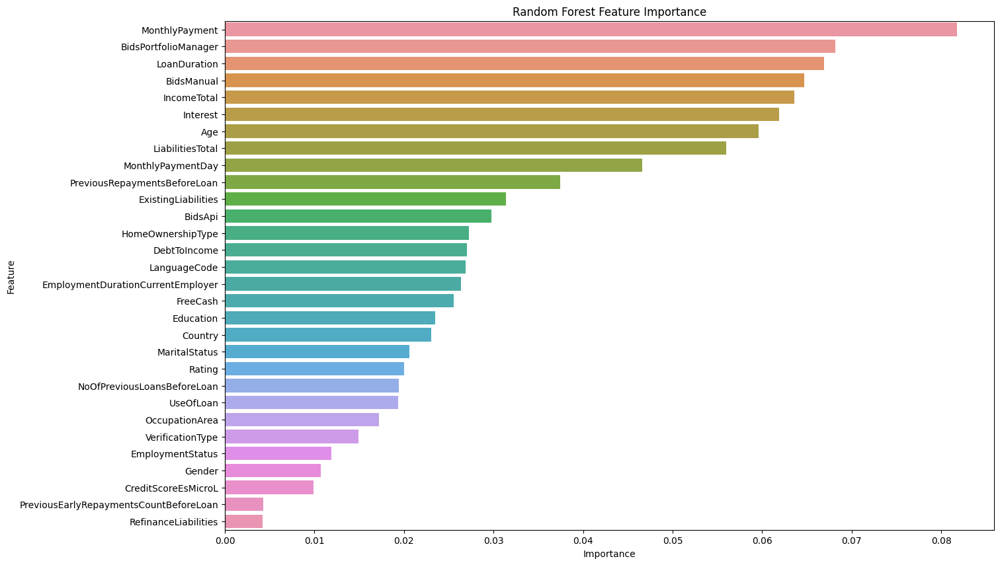

In [ ]:
Test_Performence(X, y)



---



# **Clustering With K-Means**

In [ ]:
from sklearn.cluster import KMeans

Finding Optimum Number of Clusters

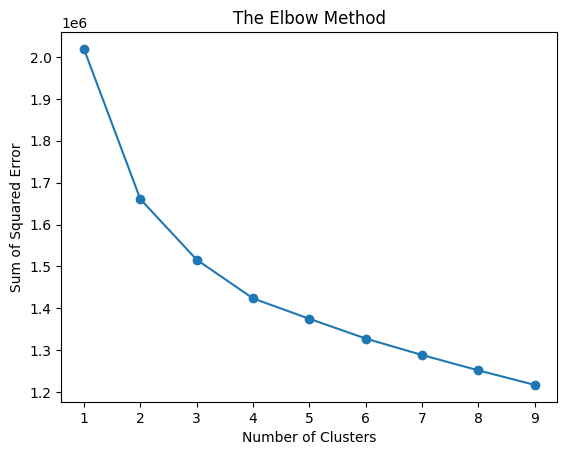

In [ ]:
inertias = []
k_rng = range(1,10)
for k in k_rng:

  km = KMeans(n_clusters=k)
  
  km.fit(X)
  inertias.append(km.inertia_)


plt.title('The Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('Sum of Squared Error')
plt.plot(k_rng,inertias ,'-o')

In [ ]:
kmeans = KMeans(n_clusters=3, n_init=10  ,random_state=0)

X["Cluster"] = kmeans.fit_predict(X)
X["Cluster"] = X["Cluster"].astype("category")

X.head()

,BidsPortfolioManager,BidsApi,BidsManual,VerificationType,LanguageCode,Age,Gender,Country,Interest,LoanDuration,MonthlyPayment,UseOfLoan,Education,MaritalStatus,EmploymentStatus,EmploymentDurationCurrentEmployer,OccupationArea,HomeOwnershipType,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,RefinanceLiabilities,DebtToIncome,FreeCash,MonthlyPaymentDay,Rating,CreditScoreEsMicroL,NoOfPreviousLoansBeforeLoan,PreviousRepaymentsBeforeLoan,PreviousEarlyRepaymentsCountBeforeLoan,Cluster
0,-1.452431,-0.588058,-0.713044,-3.110002,-1.059202,1.626883,-1.405118,-0.926427,-0.191222,-1.956384,0.408821,-1.460667,-1.431423,-1.570227,-1.286559,-1.610150,-1.773221,-1.204779,2.694744,-1.427117,-1.370583,-0.310468,-0.73649,-0.69755,1.716819,-1.329875,-0.413583,0.624861,-1.083023,-0.226723,2
1,-1.452431,-0.588058,-0.611388,-3.110002,-1.059202,0.785773,-1.405118,-0.926427,-0.572839,-1.945500,0.408821,-1.460667,-0.375288,-1.405900,-1.286559,-0.933442,-1.682397,-1.204779,2.715705,-1.427117,-1.370583,-0.310468,-0.73649,-0.69755,0.593702,-1.329875,-0.413583,1.197721,-0.354967,-0.226723,1
2,-1.452431,-0.588058,0.003053,-3.110002,-1.059202,1.444501,-1.405118,-0.926427,-0.572839,-1.933614,0.408821,-1.374655,0.526209,-1.570227,-1.286559,-0.327773,-1.584772,-1.204779,2.364073,-1.427117,-1.370583,-0.310468,-0.73649,-0.69755,1.716819,-1.329875,-0.413583,-0.831664,-1.083023,-0.226723,2
3,-1.452431,-0.588058,-0.954940,-3.110002,-1.059202,-1.535307,-1.405118,-0.926427,0.629608,-1.920588,0.408821,-1.274528,1.295032,-1.182988,0.468727,0.194664,-1.479203,-1.204779,2.767796,-1.427117,-1.370583,-0.310468,-0.73649,-0.69755,0.593702,-1.329875,-0.413583,0.624861,-1.083023,-0.226723,1
4,-1.452431,-0.588058,0.003054,-3.110002,-1.059202,-1.309411,-1.405118,-0.926427,-0.191222,-1.956384,0.408821,-1.155692,0.526209,-0.851572,-1.286559,0.194664,-1.773221,-1.204779,2.338183,-1.427117,-1.370583,-0.310468,-0.73649,-0.69755,1.716819,-1.329875,-0.413583,0.624861,-1.083023,-0.226723,1


In [ ]:
X["Cluster"].value_counts()

2    25604
1    21698
0    20012
Name: Cluster, dtype: int64

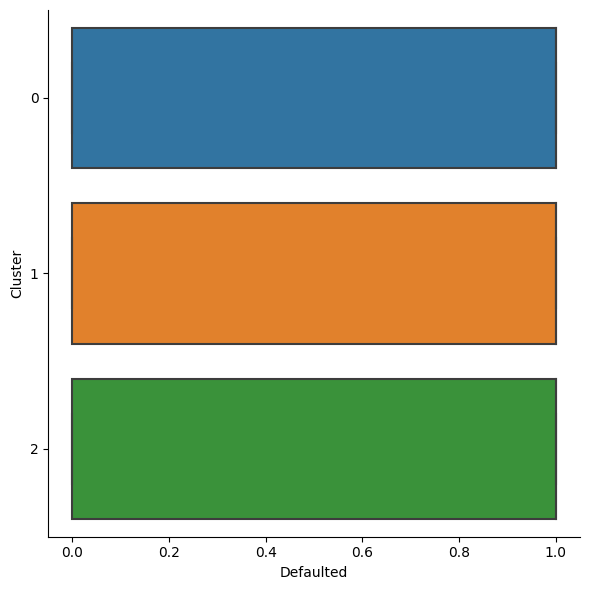

In [ ]:
Clusters = X.copy()
Clusters["Defaulted"] = df["Defaulted"]
sns.catplot(x="Defaulted", y="Cluster", data=Clusters, kind="box", height=6);

In [ ]:
Clusters.loc[ X["Cluster"] == 0 ]["Defaulted"].value_counts()

1.0    10411
0.0     6956
Name: Defaulted, dtype: int64

In [ ]:
Clusters.loc[ X["Cluster"] == 1 ]["Defaulted"].value_counts()

1.0    11607
0.0     7581
Name: Defaulted, dtype: int64

In [ ]:
Clusters.loc[ X["Cluster"] == 2 ]["Defaulted"].value_counts()

1.0    11797
0.0     9535
Name: Defaulted, dtype: int64

In [ ]:
X

,BidsPortfolioManager,BidsApi,BidsManual,VerificationType,LanguageCode,Age,Gender,Country,Interest,LoanDuration,MonthlyPayment,UseOfLoan,Education,MaritalStatus,EmploymentStatus,EmploymentDurationCurrentEmployer,OccupationArea,HomeOwnershipType,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,RefinanceLiabilities,DebtToIncome,FreeCash,MonthlyPaymentDay,Rating,CreditScoreEsMicroL,NoOfPreviousLoansBeforeLoan,PreviousRepaymentsBeforeLoan,PreviousEarlyRepaymentsCountBeforeLoan,Cluster
0,-1.452431,-0.588058,-0.713044,-3.110002,-1.059202,1.626883,-1.405118,-0.926427,-0.191222,-1.956384,0.408821,-1.460667,-1.431423,-1.570227,-1.286559,-1.610150,-1.773221,-1.204779,2.694744,-1.427117,-1.370583,-0.310468,-0.736490,-0.697550,1.716819,-1.329875,-0.413583,0.624861,-1.083023,-0.226723,2
1,-1.452431,-0.588058,-0.611388,-3.110002,-1.059202,0.785773,-1.405118,-0.926427,-0.572839,-1.945500,0.408821,-1.460667,-0.375288,-1.405900,-1.286559,-0.933442,-1.682397,-1.204779,2.715705,-1.427117,-1.370583,-0.310468,-0.736490,-0.697550,0.593702,-1.329875,-0.413583,1.197721,-0.354967,-0.226723,1
2,-1.452431,-0.588058,0.003053,-3.110002,-1.059202,1.444501,-1.405118,-0.926427,-0.572839,-1.933614,0.408821,-1.374655,0.526209,-1.570227,-1.286559,-0.327773,-1.584772,-1.204779,2.364073,-1.427117,-1.370583,-0.310468,-0.736490,-0.697550,1.716819,-1.329875,-0.413583,-0.831664,-1.083023,-0.226723,2
3,-1.452431,-0.588058,-0.954940,-3.110002,-1.059202,-1.535307,-1.405118,-0.926427,0.629608,-1.920588,0.408821,-1.274528,1.295032,-1.182988,0.468727,0.194664,-1.479203,-1.204779,2.767796,-1.427117,-1.370583,-0.310468,-0.736490,-0.697550,0.593702,-1.329875,-0.413583,0.624861,-1.083023,-0.226723,1
4,-1.452431,-0.588058,0.003054,-3.110002,-1.059202,-1.309411,-1.405118,-0.926427,-0.191222,-1.956384,0.408821,-1.155692,0.526209,-0.851572,-1.286559,0.194664,-1.773221,-1.204779,2.338183,-1.427117,-1.370583,-0.310468,-0.736490,-0.697550,1.716819,-1.329875,-0.413583,0.624861,-1.083023,-0.226723,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67309,1.357275,-0.588058,0.428542,1.745975,0.646990,-0.088175,0.315124,0.644573,-0.120855,-0.295227,0.145284,-1.274528,-1.431423,-1.182988,-1.286559,-0.933442,-1.479203,0.825133,0.209420,-0.724088,0.418363,-0.310468,0.489772,1.732729,-1.559807,0.846050,-0.413583,-0.831664,-1.083023,-0.226723,2
67310,1.077803,-0.588058,1.251940,1.745975,0.646990,-0.273624,0.315124,0.644573,-1.176354,-0.295227,-0.162922,-1.374655,-1.431423,-1.182988,-1.286559,-0.933442,0.019585,-1.204779,1.052015,0.945214,2.011261,-0.310468,1.506374,1.586954,-0.538000,1.609979,-0.413583,0.624861,-0.052999,-0.226723,2
67311,1.126897,-0.588058,0.512245,0.798445,0.646990,0.173545,0.315124,0.644573,-0.586790,-0.295227,-0.237067,-1.274528,-1.431423,-1.570227,1.950799,-0.933442,-1.097735,-1.204779,1.198096,-0.140069,1.648019,-0.310468,-0.124150,1.804719,-1.559807,0.406930,-0.413583,-0.831664,-1.083023,-0.226723,2
67312,1.056161,-0.588058,1.282965,-0.730376,-1.059202,0.714422,-1.405118,-0.926427,-1.226098,-0.295227,-0.175144,-1.460667,-0.375288,-1.570227,-1.286559,-0.933442,1.321485,-0.532162,-1.531541,1.542128,0.876012,3.222181,1.655130,-0.059624,-1.559807,1.609979,-0.413583,0.624861,-0.789345,-0.226723,2


Random Forest Test Set Accuracy:  0.7427654643769683 



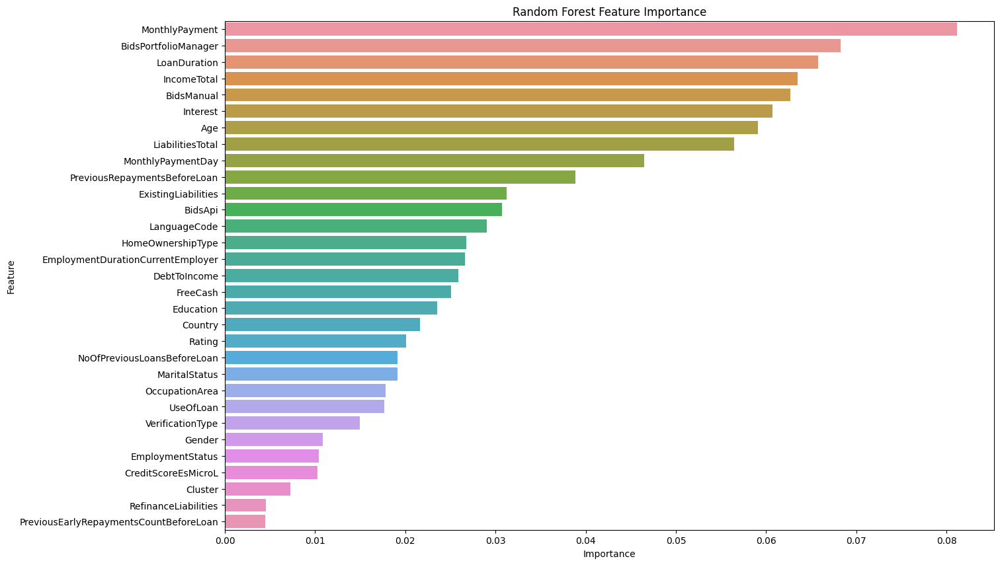

In [ ]:
Test_Performence(X, y)



---



# **PCA**

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
pca = PCA()
X_pca = pca.fit_transform(X)

In [ ]:
# Convert to dataframe
component_names = [f"PC{i+1}" for i in range(X_pca.shape[1])]
X_pca = pd.DataFrame(X_pca, columns=component_names)

X_pca.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31
0,0.850037,0.277301,-2.243071,2.180784,3.673438,-3.503083,-1.341458,-0.792045,-1.910941,-1.157958,0.613357,0.841111,0.505535,-0.466202,-1.341546,-0.443812,0.955874,0.366093,-1.275133,-1.695940,-1.051858,1.286871,-1.097666,0.301012,-0.178753,0.934318,0.032356,0.565421,-0.397528,0.280282,-0.098794
1,0.297515,-0.301735,-2.254286,1.665895,3.888686,-2.914340,-0.616802,-1.280383,-1.270535,-0.255991,0.532242,0.307986,0.195003,-0.938815,-1.240934,-0.804397,0.940039,-0.315030,-0.946070,-1.507952,-0.830194,1.625556,-0.962333,0.437232,0.088089,0.887160,0.093430,0.583851,0.311911,-0.108255,-0.222045
2,0.749095,0.160095,-3.290289,2.083029,3.180362,-2.767318,-1.433716,-1.085816,-0.783130,-0.740787,-0.409975,1.054569,-0.277854,-0.221641,-0.891792,-1.450271,1.468703,0.303385,-1.059240,-1.112518,-0.775809,1.043203,-0.505500,-0.081819,0.617747,0.958670,-0.166661,0.686712,-0.529365,0.389334,-0.120771
3,-0.261026,0.003036,-3.542727,0.922022,3.616112,-1.445163,0.027241,-1.736632,-1.127535,-0.889528,0.046031,0.367480,-0.517440,-0.487257,-1.068162,-1.448340,1.355727,-1.300902,1.145194,-0.714696,0.153811,1.435220,-1.515920,0.375351,-0.471260,0.853282,0.017816,0.541001,0.265882,-0.094982,-0.156150
4,0.147040,-0.482453,-3.492813,1.483897,3.608274,-1.758152,0.272030,-1.017856,-1.171187,-1.614745,-0.289363,-0.039068,-0.587669,-0.506554,-0.833564,-1.365505,1.493209,-1.010823,-0.267616,-1.241897,-0.789892,1.313282,-0.496822,0.503116,0.019674,0.714155,0.070171,0.315680,0.102942,-0.168970,-0.010423


In [ ]:
pca.explained_variance_ratio_

array([0.203924  , 0.12941446, 0.06924693, 0.05783234, 0.04190994,
       0.0410176 , 0.0353911 , 0.03305986, 0.03250994, 0.03036985,
       0.03022327, 0.02958362, 0.02786367, 0.02628834, 0.02550161,
       0.0238188 , 0.02267993, 0.02196925, 0.02092065, 0.01843282,
       0.01621926, 0.01415426, 0.01300632, 0.00982203, 0.00802094,
       0.00513922, 0.00429388, 0.00259799, 0.00200348, 0.00149323,
       0.0012914 ])

In [ ]:
pca.explained_variance_ratio_.cumsum()

array([0.203924  , 0.33333846, 0.40258539, 0.46041773, 0.50232767,
       0.54334527, 0.57873637, 0.61179623, 0.64430618, 0.67467603,
       0.7048993 , 0.73448292, 0.76234659, 0.78863493, 0.81413654,
       0.83795534, 0.86063528, 0.88260452, 0.90352517, 0.92195799,
       0.93817725, 0.95233151, 0.96533782, 0.97515986, 0.98318079,
       0.98832002, 0.9926139 , 0.99521189, 0.99721537, 0.9987086 ,
       1.        ])

In [ ]:
def make_mi_scores(X, y, discrete_features):
    mi_scores = mutual_info_regression(X, y, discrete_features=discrete_features)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

In [ ]:
mi_scores = make_mi_scores(X_pca, y, discrete_features=False)
mi_scores

PC2     0.032012
PC1     0.030674
PC26    0.020498
PC5     0.018058
PC3     0.013860
PC31    0.013705
PC28    0.010865
PC4     0.008479
PC7     0.007792
PC29    0.006938
PC30    0.006430
PC15    0.005783
PC19    0.004858
PC23    0.004731
PC21    0.004254
PC27    0.004240
PC22    0.003978
PC9     0.003692
PC6     0.003494
PC10    0.003384
PC16    0.002931
PC25    0.002497
PC13    0.002402
PC11    0.002137
PC14    0.001949
PC24    0.001948
PC17    0.001766
PC12    0.001082
PC8     0.000094
PC20    0.000000
PC18    0.000000
Name: MI Scores, dtype: float64

In [ ]:
def plot_variance(pca, width=8, dpi=100):
    # Create figure
    fig, axs = plt.subplots(1, 2)
    n = pca.n_components_
    grid = np.arange(1, n + 1)
    # Explained variance
    evr = pca.explained_variance_ratio_
    axs[0].bar(grid, evr)
    axs[0].set(
        xlabel="Component", title="% Explained Variance", ylim=(0.0, 1.0)
    )
    # Cumulative Variance
    cv = np.cumsum(evr)
    axs[1].plot(np.r_[0, grid], np.r_[0, cv], "o-")
    axs[1].set(
        xlabel="Component", title="% Cumulative Variance", ylim=(0.0, 1.0)
    )
    # Set up figure
    fig.set(figwidth=8, dpi=100)
    return axs

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7fc57032e110>,
      dtype=object)

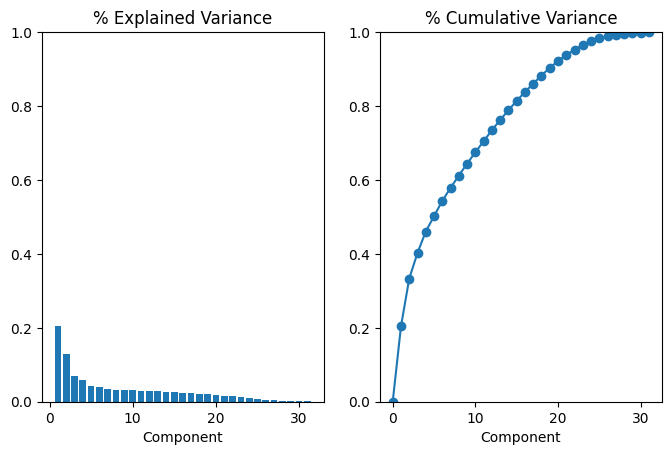

In [ ]:
plot_variance(pca)

Random Forest Test Set Accuracy:  0.721908610137263 



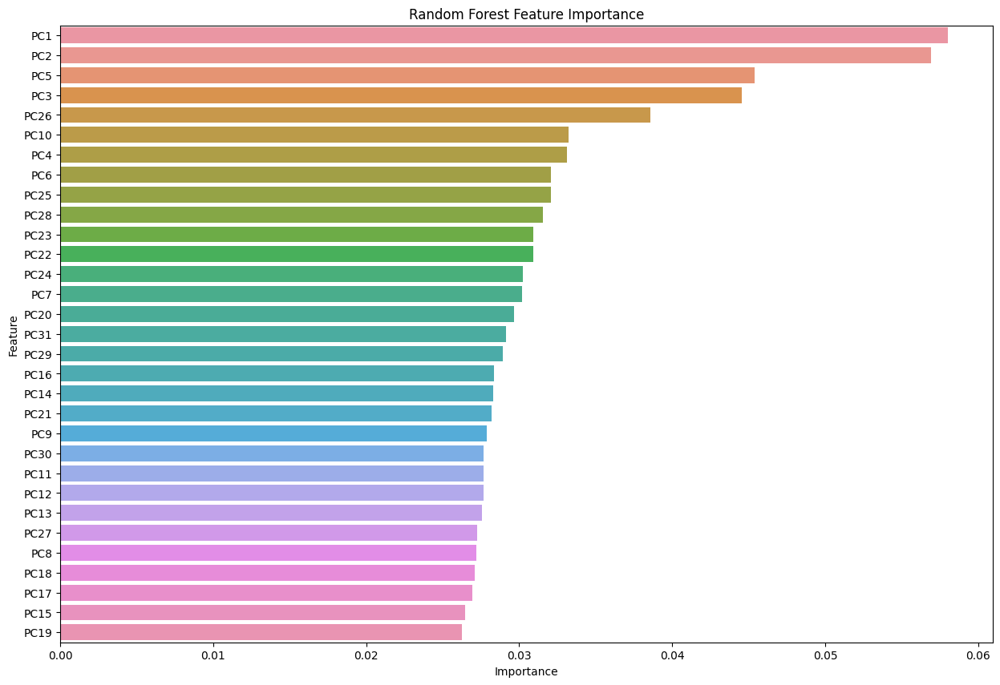

In [ ]:
Test_Performence(X_pca, y)

**Finding Optimum Number of Components**

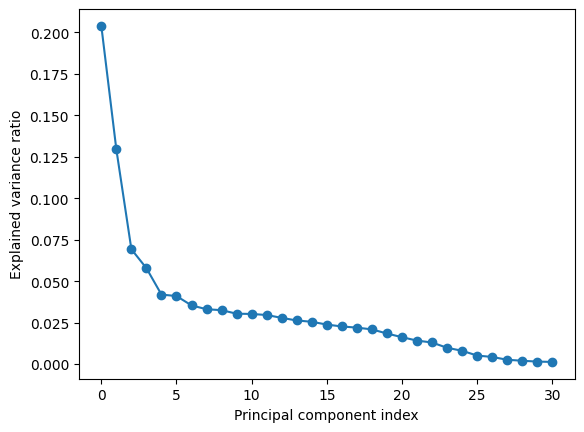

In [ ]:
# Plot the explained variance ratio
plt.plot(pca.explained_variance_ratio_,'-o')

plt.xlabel('Principal component index')
plt.ylabel('Explained variance ratio')
plt.show()

In [ ]:
pca = PCA(n_components = 16 )
X_pca = pca.fit_transform(X)

In [ ]:
# Convert to dataframe
component_names = [f"PC{i+1}" for i in range(X_pca.shape[1])]
X_pca = pd.DataFrame(X_pca, columns=component_names)

X_pca.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16
0,0.850037,0.277301,-2.243070,2.180778,3.673391,-3.503172,-1.341400,-0.791883,-1.910924,-1.158026,0.613709,0.840827,0.505687,-0.465754,-1.342318,-0.445214
1,0.297515,-0.301735,-2.254285,1.665888,3.888634,-2.914437,-0.616741,-1.280212,-1.270507,-0.256072,0.532633,0.307683,0.195188,-0.938319,-1.241756,-0.805861
2,0.749095,0.160094,-3.290287,2.083024,3.180327,-2.767383,-1.433675,-1.085682,-0.783125,-0.740831,-0.409707,1.054356,-0.277751,-0.221310,-0.892402,-1.451395
3,-0.261026,0.003035,-3.542726,0.922016,3.616068,-1.445244,0.027290,-1.736487,-1.127513,-0.889595,0.046361,0.367227,-0.517287,-0.486844,-1.068853,-1.449570
4,0.147040,-0.482454,-3.492812,1.483891,3.608232,-1.758232,0.272082,-1.017723,-1.171164,-1.614817,-0.289049,-0.039314,-0.587520,-0.506154,-0.834208,-1.366656


In [ ]:
pca.explained_variance_ratio_

array([0.203924  , 0.12941446, 0.06924693, 0.05783234, 0.04190994,
       0.0410176 , 0.0353911 , 0.03305986, 0.03250994, 0.03036985,
       0.03022327, 0.02958362, 0.02786367, 0.02628834, 0.0255016 ,
       0.02381878])

In [ ]:
pca.explained_variance_ratio_.cumsum()

array([0.203924  , 0.33333846, 0.40258539, 0.46041773, 0.50232767,
       0.54334527, 0.57873637, 0.61179623, 0.64430618, 0.67467603,
       0.7048993 , 0.73448292, 0.76234659, 0.78863493, 0.81413653,
       0.83795531])

In [ ]:
mi_scores = make_mi_scores(X_pca, y, discrete_features=False)
mi_scores

PC2     0.032144
PC1     0.030711
PC5     0.016013
PC3     0.013880
PC4     0.007833
PC14    0.006954
PC7     0.006404
PC15    0.006145
PC6     0.004159
PC16    0.003335
PC13    0.003242
PC9     0.003044
PC11    0.002501
PC10    0.002391
PC12    0.000539
PC8     0.000000
Name: MI Scores, dtype: float64

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7fc56e912c10>,
      dtype=object)

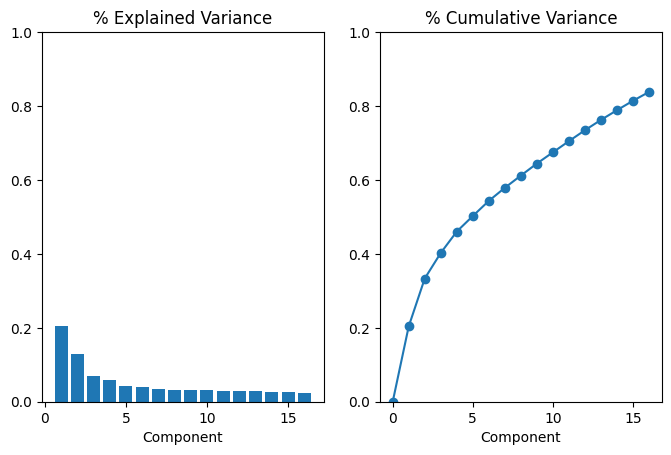

In [ ]:
plot_variance(pca)

Random Forest Test Set Accuracy:  0.7161447501336978 



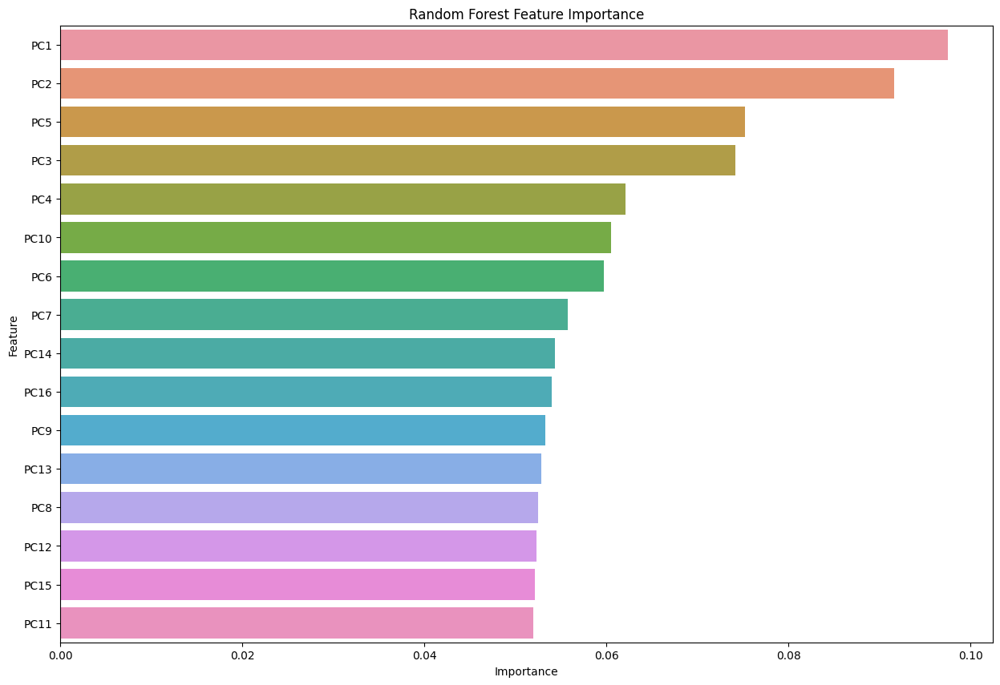

In [ ]:
Test_Performence(X_pca, y)

In [ ]:
X

,BidsPortfolioManager,BidsApi,BidsManual,VerificationType,LanguageCode,Age,Gender,Country,Interest,LoanDuration,MonthlyPayment,UseOfLoan,Education,MaritalStatus,EmploymentStatus,EmploymentDurationCurrentEmployer,OccupationArea,HomeOwnershipType,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,RefinanceLiabilities,DebtToIncome,FreeCash,MonthlyPaymentDay,Rating,CreditScoreEsMicroL,NoOfPreviousLoansBeforeLoan,PreviousRepaymentsBeforeLoan,PreviousEarlyRepaymentsCountBeforeLoan,Cluster
0,-1.452431,-0.588058,-0.713044,-3.110002,-1.059202,1.626883,-1.405118,-0.926427,-0.191222,-1.956384,0.408821,-1.460667,-1.431423,-1.570227,-1.286559,-1.610150,-1.773221,-1.204779,2.694744,-1.427117,-1.370583,-0.310468,-0.736490,-0.697550,1.716819,-1.329875,-0.413583,0.624861,-1.083023,-0.226723,2
1,-1.452431,-0.588058,-0.611388,-3.110002,-1.059202,0.785773,-1.405118,-0.926427,-0.572839,-1.945500,0.408821,-1.460667,-0.375288,-1.405900,-1.286559,-0.933442,-1.682397,-1.204779,2.715705,-1.427117,-1.370583,-0.310468,-0.736490,-0.697550,0.593702,-1.329875,-0.413583,1.197721,-0.354967,-0.226723,1
2,-1.452431,-0.588058,0.003053,-3.110002,-1.059202,1.444501,-1.405118,-0.926427,-0.572839,-1.933614,0.408821,-1.374655,0.526209,-1.570227,-1.286559,-0.327773,-1.584772,-1.204779,2.364073,-1.427117,-1.370583,-0.310468,-0.736490,-0.697550,1.716819,-1.329875,-0.413583,-0.831664,-1.083023,-0.226723,2
3,-1.452431,-0.588058,-0.954940,-3.110002,-1.059202,-1.535307,-1.405118,-0.926427,0.629608,-1.920588,0.408821,-1.274528,1.295032,-1.182988,0.468727,0.194664,-1.479203,-1.204779,2.767796,-1.427117,-1.370583,-0.310468,-0.736490,-0.697550,0.593702,-1.329875,-0.413583,0.624861,-1.083023,-0.226723,1
4,-1.452431,-0.588058,0.003054,-3.110002,-1.059202,-1.309411,-1.405118,-0.926427,-0.191222,-1.956384,0.408821,-1.155692,0.526209,-0.851572,-1.286559,0.194664,-1.773221,-1.204779,2.338183,-1.427117,-1.370583,-0.310468,-0.736490,-0.697550,1.716819,-1.329875,-0.413583,0.624861,-1.083023,-0.226723,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67309,1.357275,-0.588058,0.428542,1.745975,0.646990,-0.088175,0.315124,0.644573,-0.120855,-0.295227,0.145284,-1.274528,-1.431423,-1.182988,-1.286559,-0.933442,-1.479203,0.825133,0.209420,-0.724088,0.418363,-0.310468,0.489772,1.732729,-1.559807,0.846050,-0.413583,-0.831664,-1.083023,-0.226723,2
67310,1.077803,-0.588058,1.251940,1.745975,0.646990,-0.273624,0.315124,0.644573,-1.176354,-0.295227,-0.162922,-1.374655,-1.431423,-1.182988,-1.286559,-0.933442,0.019585,-1.204779,1.052015,0.945214,2.011261,-0.310468,1.506374,1.586954,-0.538000,1.609979,-0.413583,0.624861,-0.052999,-0.226723,2
67311,1.126897,-0.588058,0.512245,0.798445,0.646990,0.173545,0.315124,0.644573,-0.586790,-0.295227,-0.237067,-1.274528,-1.431423,-1.570227,1.950799,-0.933442,-1.097735,-1.204779,1.198096,-0.140069,1.648019,-0.310468,-0.124150,1.804719,-1.559807,0.406930,-0.413583,-0.831664,-1.083023,-0.226723,2
67312,1.056161,-0.588058,1.282965,-0.730376,-1.059202,0.714422,-1.405118,-0.926427,-1.226098,-0.295227,-0.175144,-1.460667,-0.375288,-1.570227,-1.286559,-0.933442,1.321485,-0.532162,-1.531541,1.542128,0.876012,3.222181,1.655130,-0.059624,-1.559807,1.609979,-0.413583,0.624861,-0.789345,-0.226723,2


In [ ]:
X_pca

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16
0,0.850037,0.277301,-2.243070,2.180778,3.673391,-3.503172,-1.341400,-0.791883,-1.910924,-1.158026,0.613709,0.840827,0.505687,-0.465754,-1.342318,-0.445214
1,0.297515,-0.301735,-2.254285,1.665888,3.888634,-2.914437,-0.616741,-1.280212,-1.270507,-0.256072,0.532633,0.307683,0.195188,-0.938319,-1.241756,-0.805861
2,0.749095,0.160094,-3.290287,2.083024,3.180327,-2.767383,-1.433675,-1.085682,-0.783125,-0.740831,-0.409707,1.054356,-0.277751,-0.221310,-0.892402,-1.451395
3,-0.261026,0.003035,-3.542726,0.922016,3.616068,-1.445244,0.027290,-1.736487,-1.127513,-0.889595,0.046361,0.367227,-0.517287,-0.486844,-1.068853,-1.449570
4,0.147040,-0.482454,-3.492812,1.483891,3.608232,-1.758232,0.272082,-1.017723,-1.171164,-1.614817,-0.289049,-0.039314,-0.587520,-0.506154,-0.834208,-1.366656
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67309,2.994228,1.742618,-0.221916,0.519847,-1.604127,-0.712658,0.630071,1.208011,-0.493407,1.327525,-0.026282,-0.455431,1.035792,0.153743,-1.002353,-0.319694
67310,3.573438,0.302640,2.509982,0.727264,-0.661135,-1.593317,0.514143,1.008213,-0.582084,0.771234,-0.398091,-2.014648,0.122130,0.282804,0.284593,-0.778164
67311,2.279538,1.661092,0.964700,0.757676,-0.823238,-1.584383,-0.985580,0.357207,-0.645108,0.671017,0.189799,-1.035257,0.271475,0.851237,-1.786324,-0.889881
67312,3.885698,-1.752064,0.476156,0.215027,1.087095,0.564670,-2.511649,1.487728,2.292320,1.151518,0.503651,-1.830487,1.244672,-0.394580,1.142204,0.975563


In [ ]:
# Concatenating PCA Components with data
X_pca = pd.concat( [ X , X_pca], axis = 1)
X_pca

,BidsPortfolioManager,BidsApi,BidsManual,VerificationType,LanguageCode,Age,Gender,Country,Interest,LoanDuration,MonthlyPayment,UseOfLoan,Education,MaritalStatus,EmploymentStatus,EmploymentDurationCurrentEmployer,OccupationArea,HomeOwnershipType,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,RefinanceLiabilities,DebtToIncome,FreeCash,MonthlyPaymentDay,Rating,CreditScoreEsMicroL,NoOfPreviousLoansBeforeLoan,PreviousRepaymentsBeforeLoan,PreviousEarlyRepaymentsCountBeforeLoan,Cluster,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16
0,-1.452431,-0.588058,-0.713044,-3.110002,-1.059202,1.626883,-1.405118,-0.926427,-0.191222,-1.956384,0.408821,-1.460667,-1.431423,-1.570227,-1.286559,-1.610150,-1.773221,-1.204779,2.694744,-1.427117,-1.370583,-0.310468,-0.736490,-0.697550,1.716819,-1.329875,-0.413583,0.624861,-1.083023,-0.226723,2,0.850037,0.277301,-2.243070,2.180778,3.673391,-3.503172,-1.341400,-0.791883,-1.910924,-1.158026,0.613709,0.840827,0.505687,-0.465754,-1.342318,-0.445214
1,-1.452431,-0.588058,-0.611388,-3.110002,-1.059202,0.785773,-1.405118,-0.926427,-0.572839,-1.945500,0.408821,-1.460667,-0.375288,-1.405900,-1.286559,-0.933442,-1.682397,-1.204779,2.715705,-1.427117,-1.370583,-0.310468,-0.736490,-0.697550,0.593702,-1.329875,-0.413583,1.197721,-0.354967,-0.226723,1,0.297515,-0.301735,-2.254285,1.665888,3.888634,-2.914437,-0.616741,-1.280212,-1.270507,-0.256072,0.532633,0.307683,0.195188,-0.938319,-1.241756,-0.805861
2,-1.452431,-0.588058,0.003053,-3.110002,-1.059202,1.444501,-1.405118,-0.926427,-0.572839,-1.933614,0.408821,-1.374655,0.526209,-1.570227,-1.286559,-0.327773,-1.584772,-1.204779,2.364073,-1.427117,-1.370583,-0.310468,-0.736490,-0.697550,1.716819,-1.329875,-0.413583,-0.831664,-1.083023,-0.226723,2,0.749095,0.160094,-3.290287,2.083024,3.180327,-2.767383,-1.433675,-1.085682,-0.783125,-0.740831,-0.409707,1.054356,-0.277751,-0.221310,-0.892402,-1.451395
3,-1.452431,-0.588058,-0.954940,-3.110002,-1.059202,-1.535307,-1.405118,-0.926427,0.629608,-1.920588,0.408821,-1.274528,1.295032,-1.182988,0.468727,0.194664,-1.479203,-1.204779,2.767796,-1.427117,-1.370583,-0.310468,-0.736490,-0.697550,0.593702,-1.329875,-0.413583,0.624861,-1.083023,-0.226723,1,-0.261026,0.003035,-3.542726,0.922016,3.616068,-1.445244,0.027290,-1.736487,-1.127513,-0.889595,0.046361,0.367227,-0.517287,-0.486844,-1.068853,-1.449570
4,-1.452431,-0.588058,0.003054,-3.110002,-1.059202,-1.309411,-1.405118,-0.926427,-0.191222,-1.956384,0.408821,-1.155692,0.526209,-0.851572,-1.286559,0.194664,-1.773221,-1.204779,2.338183,-1.427117,-1.370583,-0.310468,-0.736490,-0.697550,1.716819,-1.329875,-0.413583,0.624861,-1.083023,-0.226723,1,0.147040,-0.482454,-3.492812,1.483891,3.608232,-1.758232,0.272082,-1.017723,-1.171164,-1.614817,-0.289049,-0.039314,-0.587520,-0.506154,-0.834208,-1.366656
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67309,1.357275,-0.588058,0.428542,1.745975,0.646990,-0.088175,0.315124,0.644573,-0.120855,-0.295227,0.145284,-1.274528,-1.431423,-1.182988,-1.286559,-0.933442,-1.479203,0.825133,0.209420,-0.724088,0.418363,-0.310468,0.489772,1.732729,-1.559807,0.846050,-0.413583,-0.831664,-1.083023,-0.226723,2,2.994228,1.742618,-0.221916,0.519847,-1.604127,-0.712658,0.630071,1.208011,-0.493407,1.327525,-0.026282,-0.455431,1.035792,0.153743,-1.002353,-0.319694
67310,1.077803,-0.588058,1.251940,1.745975,0.646990,-0.273624,0.315124,0.644573,-1.176354,-0.295227,-0.162922,-1.374655,-1.431423,-1.182988,-1.286559,-0.933442,0.019585,-1.204779,1.052015,0.945214,2.011261,-0.310468,1.506374,1.586954,-0.538000,1.609979,-0.413583,0.624861,-0.052999,-0.226723,2,3.573438,0.302640,2.509982,0.727264,-0.661135,-1.593317,0.514143,1.008213,-0.582084,0.771234,-0.398091,-2.014648,0.122130,0.282804,0.284593,-0.778164
67311,1.126897,-0.588058,0.512245,0.798445,0.646990,0.173545,0.315124,0.644573,-0.586790,-0.295227,

Random Forest Test Set Accuracy:  0.735456652207499 



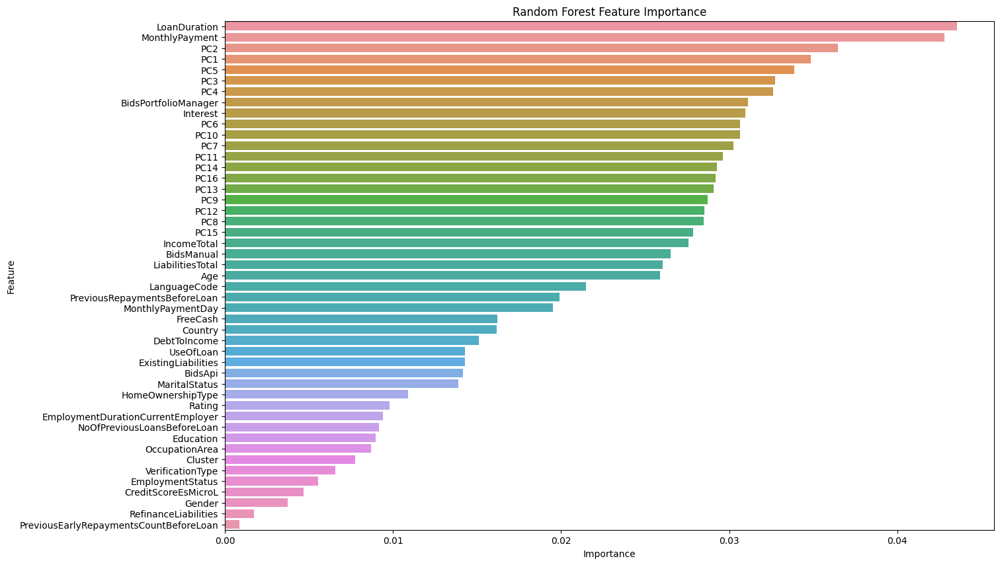

In [ ]:
Test_Performence(X_pca, y)

Random Forest Test Set Accuracy:  0.7427654643769683 



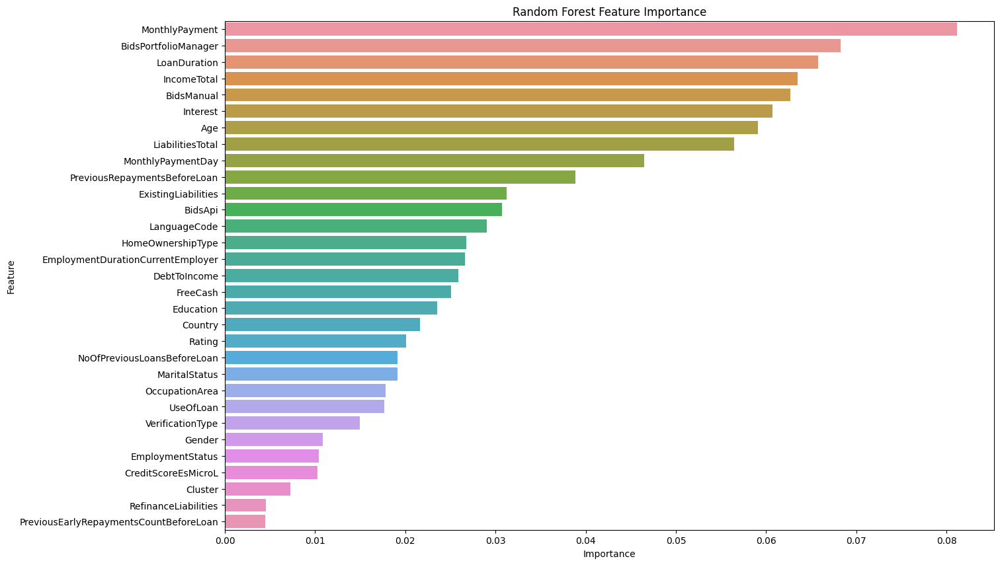

In [ ]:
Test_Performence(X, y)



---



# **Feature Selection Based on Random Forest Feature Importance**

In [ ]:
X_train, X_test, y_train, y_test = train_test_split( X , y, stratify=y, random_state=0 )

clf = RandomForestClassifier(random_state=0, n_estimators=500)

clf.fit(X_train,y_train)

print("Random Forest Test Set Accuracy: " , clf.score(X_test,y_test), "\n" )

# To plot Feature Importance

results = list(zip(X, clf.feature_importances_))

importance = pd.DataFrame(results, columns = ["Feature", "Importance"])

importance = importance.sort_values(by="Importance", ascending=False)

importance.sort_values(by="Importance" , ascending=False).style.background_gradient(cmap='YlOrRd',axis=0)

Random Forest Test Set Accuracy:  0.7438944678828213 



,Feature,Importance
10,MonthlyPayment,0.081654
0,BidsPortfolioManager,0.068436
9,LoanDuration,0.063752
2,BidsManual,0.063442
18,IncomeTotal,0.063214
8,Interest,0.061588
5,Age,0.059325
20,LiabilitiesTotal,0.056701
24,MonthlyPaymentDay,0.046327
28,PreviousRepaymentsBeforeLoan,0.038460


In [ ]:
X_reduced = X.drop(importance.Feature[importance.Importance < 0.02].tolist(), 1)
X_reduced

,BidsPortfolioManager,BidsApi,BidsManual,LanguageCode,Age,Country,Interest,LoanDuration,MonthlyPayment,UseOfLoan,Education,EmploymentDurationCurrentEmployer,HomeOwnershipType,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,DebtToIncome,FreeCash,MonthlyPaymentDay,Rating,PreviousRepaymentsBeforeLoan
0,-1.452431,-0.588058,-0.713044,-1.059202,1.626883,-0.926427,-0.191222,-1.956384,0.408821,-1.460667,-1.431423,-1.610150,-1.204779,2.694744,-1.427117,-1.370583,-0.736490,-0.697550,1.716819,-1.329875,-1.083023
1,-1.452431,-0.588058,-0.611388,-1.059202,0.785773,-0.926427,-0.572839,-1.945500,0.408821,-1.460667,-0.375288,-0.933442,-1.204779,2.715705,-1.427117,-1.370583,-0.736490,-0.697550,0.593702,-1.329875,-0.354967
2,-1.452431,-0.588058,0.003053,-1.059202,1.444501,-0.926427,-0.572839,-1.933614,0.408821,-1.374655,0.526209,-0.327773,-1.204779,2.364073,-1.427117,-1.370583,-0.736490,-0.697550,1.716819,-1.329875,-1.083023
3,-1.452431,-0.588058,-0.954940,-1.059202,-1.535307,-0.926427,0.629608,-1.920588,0.408821,-1.274528,1.295032,0.194664,-1.204779,2.767796,-1.427117,-1.370583,-0.736490,-0.697550,0.593702,-1.329875,-1.083023
4,-1.452431,-0.588058,0.003054,-1.059202,-1.309411,-0.926427,-0.191222,-1.956384,0.408821,-1.155692,0.526209,0.194664,-1.204779,2.338183,-1.427117,-1.370583,-0.736490,-0.697550,1.716819,-1.329875,-1.083023
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67309,1.357275,-0.588058,0.428542,0.646990,-0.088175,0.644573,-0.120855,-0.295227,0.145284,-1.274528,-1.431423,-0.933442,0.825133,0.209420,-0.724088,0.418363,0.489772,1.732729,-1.559807,0.846050,-1.083023
67310,1.077803,-0.588058,1.251940,0.646990,-0.273624,0.644573,-1.176354,-0.295227,-0.162922,-1.374655,-1.431423,-0.933442,-1.204779,1.052015,0.945214,2.011261,1.506374,1.586954,-0.538000,1.609979,-0.052999
67311,1.126897,-0.588058,0.512245,0.646990,0.173545,0.644573,-0.586790,-0.295227,-0.237067,-1.274528,-1.431423,-0.933442,-1.204779,1.198096,-0.140069,1.648019,-0.124150,1.804719,-1.559807,0.406930,-1.083023
67312,1.056161,-0.588058,1.282965,-1.059202,0.714422,-0.926427,-1.226098,-0.295227,-0.175144,-1.460667,-0.375288,-0.933442,-0.532162,-1.531541,1.542128,0.876012,1.655130,-0.059624,-1.559807,1.609979,-0.789345


Random Forest Test Set Accuracy:  0.7402697724166617 



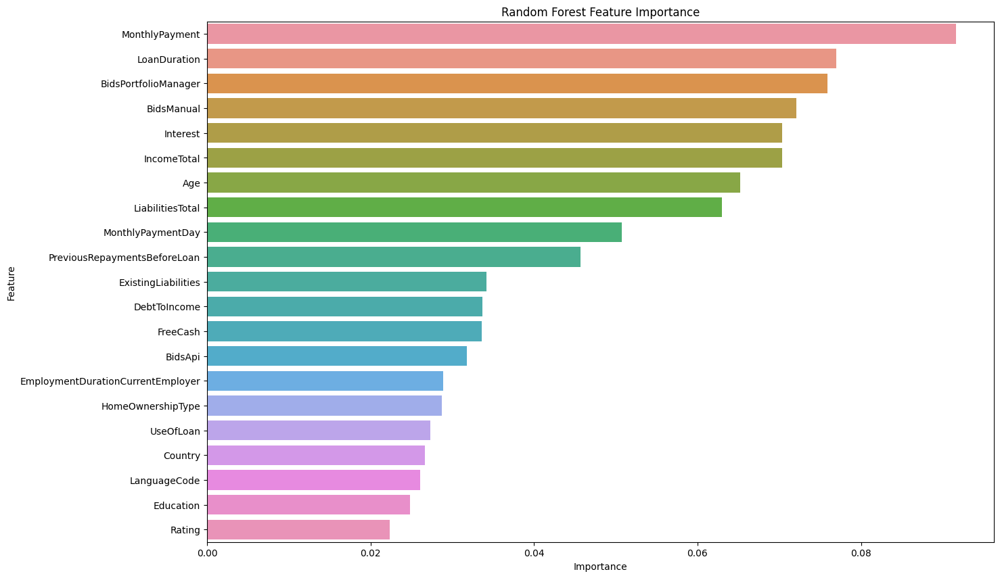

In [ ]:
Test_Performence(X_reduced, y)

# **RFE with Random Forest**

In [ ]:
from sklearn.feature_selection import RFE
from sklearn.metrics import accuracy_score

X_train, X_test, y_train, y_test = train_test_split( X , y, stratify=y, random_state=0)

rfe = RFE(estimator = RandomForestClassifier(random_state=0) , n_features_to_select= 20 , step = 10 , verbose=1)

rfe.fit(X_train, y_train)

Fitting estimator with 31 features.
Fitting estimator with 21 features.


RFE(estimator=RandomForestClassifier(random_state=0), n_features_to_select=20,
    step=10, verbose=1)

In [ ]:
reduced_X = X.loc[:, rfe.support_]
reduced_X

,BidsPortfolioManager,BidsApi,BidsManual,LanguageCode,Age,Country,Interest,LoanDuration,MonthlyPayment,Education,EmploymentDurationCurrentEmployer,HomeOwnershipType,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,DebtToIncome,FreeCash,MonthlyPaymentDay,Rating,PreviousRepaymentsBeforeLoan
0,-1.452431,-0.588058,-0.713044,-1.059202,1.626883,-0.926427,-0.191222,-1.956384,0.408821,-1.431423,-1.610150,-1.204779,2.694744,-1.427117,-1.370583,-0.736490,-0.697550,1.716819,-1.329875,-1.083023
1,-1.452431,-0.588058,-0.611388,-1.059202,0.785773,-0.926427,-0.572839,-1.945500,0.408821,-0.375288,-0.933442,-1.204779,2.715705,-1.427117,-1.370583,-0.736490,-0.697550,0.593702,-1.329875,-0.354967
2,-1.452431,-0.588058,0.003053,-1.059202,1.444501,-0.926427,-0.572839,-1.933614,0.408821,0.526209,-0.327773,-1.204779,2.364073,-1.427117,-1.370583,-0.736490,-0.697550,1.716819,-1.329875,-1.083023
3,-1.452431,-0.588058,-0.954940,-1.059202,-1.535307,-0.926427,0.629608,-1.920588,0.408821,1.295032,0.194664,-1.204779,2.767796,-1.427117,-1.370583,-0.736490,-0.697550,0.593702,-1.329875,-1.083023
4,-1.452431,-0.588058,0.003054,-1.059202,-1.309411,-0.926427,-0.191222,-1.956384,0.408821,0.526209,0.194664,-1.204779,2.338183,-1.427117,-1.370583,-0.736490,-0.697550,1.716819,-1.329875,-1.083023
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67309,1.357275,-0.588058,0.428542,0.646990,-0.088175,0.644573,-0.120855,-0.295227,0.145284,-1.431423,-0.933442,0.825133,0.209420,-0.724088,0.418363,0.489772,1.732729,-1.559807,0.846050,-1.083023
67310,1.077803,-0.588058,1.251940,0.646990,-0.273624,0.644573,-1.176354,-0.295227,-0.162922,-1.431423,-0.933442,-1.204779,1.052015,0.945214,2.011261,1.506374,1.586954,-0.538000,1.609979,-0.052999
67311,1.126897,-0.588058,0.512245,0.646990,0.173545,0.644573,-0.586790,-0.295227,-0.237067,-1.431423,-0.933442,-1.204779,1.198096,-0.140069,1.648019,-0.124150,1.804719,-1.559807,0.406930,-1.083023
67312,1.056161,-0.588058,1.282965,-1.059202,0.714422,-0.926427,-1.226098,-0.295227,-0.175144,-0.375288,-0.933442,-0.532162,-1.531541,1.542128,0.876012,1.655130,-0.059624,-1.559807,1.609979,-0.789345


In [ ]:
accuracy_score( y_test , rfe.predict(X_test)  )

0.7393784538594094

Random Forest Test Set Accuracy:  0.7393784538594094 



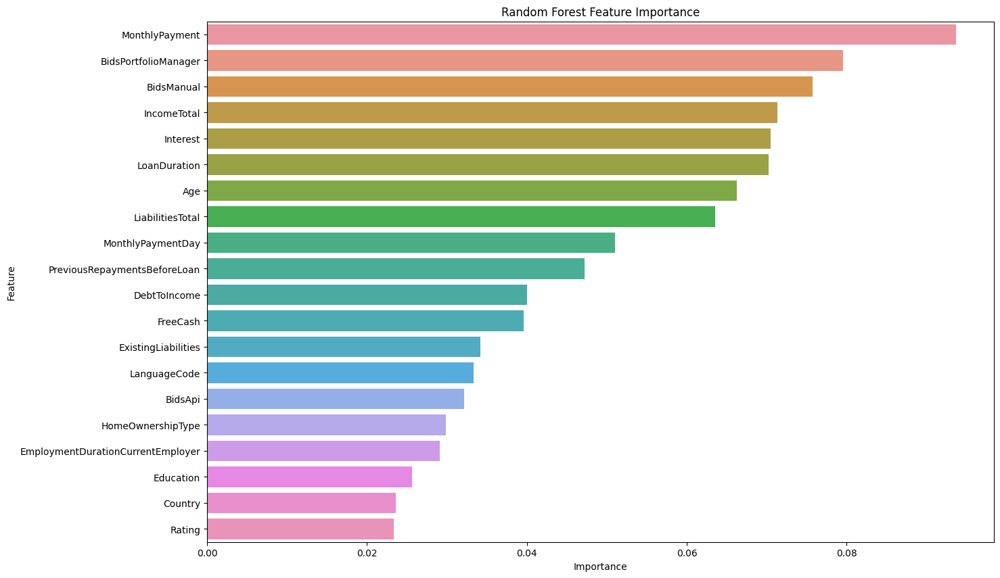

In [ ]:
Test_Performence(reduced_X,y)



---



# **Checking Feature Importance with XGBoost and LogisticRegression**

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
import xgboost as xgb
from sklearn.model_selection import train_test_split

In [ ]:
X_train, X_test, y_train, y_test = train_test_split( reduced_X , y, stratify=y)

In [ ]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(50485, 20)
(50485,)
(16829, 20)
(16829,)


**XGBoost**

In [ ]:
pipe = Pipeline([
        ('classifier', xgb.XGBClassifier(random_state=0))])

In [ ]:
pipe.fit(X_train , y_train)

Pipeline(steps=[('classifier', XGBClassifier())])

In [ ]:
pipe.score(X_test ,  y_test)

0.7239883534375186

In [ ]:
results = list(zip(reduced_X, pipe['classifier'].feature_importances_))
importance = pd.DataFrame(results, columns = ["Feature", "Importance"])
importance = importance.sort_values(by="Importance", ascending=False)
importance.sort_values(by="Importance" , ascending=False).style.background_gradient(cmap='YlOrRd',axis=0)

,Feature,Importance
7,LoanDuration,0.340446
5,Country,0.128580
16,FreeCash,0.084027
3,LanguageCode,0.077135
2,BidsManual,0.067510
15,DebtToIncome,0.045961
8,MonthlyPayment,0.045718
1,BidsApi,0.026371
19,PreviousRepaymentsBeforeLoan,0.024316
6,Interest,0.022999


**Logistic Regression**

In [ ]:
pipe = Pipeline([
        ('classifier', LogisticRegression(random_state=0))])

In [ ]:
pipe.fit(X_train , y_train)

Pipeline(steps=[('classifier', LogisticRegression(random_state=0))])

In [ ]:
pipe.score(X_test ,  y_test)

0.6875631350644721

In [ ]:
results = list(zip(reduced_X, pipe['classifier'].coef_[0]))

importance = pd.DataFrame(results, columns = ["Feature", "Coefficient"])
importance = importance.sort_values(by="Coefficient", ascending=False)
importance.sort_values(by="Coefficient" , ascending=False).style.background_gradient(cmap='YlOrRd',axis=0)

,Feature,Coefficient
5,Country,0.343674
7,LoanDuration,0.240439
3,LanguageCode,0.237904
0,BidsPortfolioManager,0.235710
2,BidsManual,0.155615
17,MonthlyPaymentDay,0.119518
1,BidsApi,0.115109
4,Age,0.112185
13,ExistingLiabilities,0.105402
10,EmploymentDurationCurrentEmployer,0.104234


**With PCA**

In [ ]:
X_train, X_test, y_train, y_test = train_test_split( reduced_X , y, stratify=y)

In [ ]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(50485, 20)
(50485,)
(16829, 20)
(16829,)


**XGBoost**

In [ ]:
pipe = Pipeline([
        ('reducer', PCA()),
        ('classifier', xgb.XGBClassifier(random_state=0))])

In [ ]:
pipe.fit(X_train , y_train)

Pipeline(steps=[('reducer', PCA()), ('classifier', XGBClassifier())])

In [ ]:
pipe["reducer"].explained_variance_ratio_.cumsum()

array([0.18671846, 0.32864229, 0.41333472, 0.48767364, 0.54733432,
       0.60022446, 0.6480277 , 0.69469007, 0.74032938, 0.78234301,
       0.82332278, 0.85758985, 0.89043161, 0.92173084, 0.94874241,
       0.96909272, 0.98286012, 0.99053115, 0.99750506, 1.        ])

In [ ]:
pipe.score(X_test ,  y_test)

0.7056866123952701

In [ ]:
component_names = [f"PC{i+1}" for i in range(X_pca.shape[1])]

results = list(zip(component_names, pipe['classifier'].feature_importances_))
importance = pd.DataFrame(results, columns = ["Feature", "Importance"])
importance = importance.sort_values(by="Importance", ascending=False)
importance.sort_values(by="Importance" , ascending=False).style.background_gradient(cmap='YlOrRd',axis=0)

,Feature,Importance
0,PC1,0.190684
4,PC5,0.130812
1,PC2,0.081159
3,PC4,0.072627
2,PC3,0.069635
5,PC6,0.053727
15,PC16,0.050581
8,PC9,0.050002
12,PC13,0.034512
18,PC19,0.034489


**Logistic Regression**

In [ ]:
pipe = Pipeline([
        ('reducer', PCA()),
        ('classifier', LogisticRegression(random_state=0))])

In [ ]:
pipe.fit(X_train , y_train)

Pipeline(steps=[('reducer', PCA()),
                ('classifier', LogisticRegression(random_state=0))])

In [ ]:
pipe["reducer"].explained_variance_ratio_.cumsum()

array([0.18671846, 0.32864229, 0.41333472, 0.48767364, 0.54733432,
       0.60022446, 0.6480277 , 0.69469007, 0.74032938, 0.78234301,
       0.82332278, 0.85758985, 0.89043161, 0.92173084, 0.94874241,
       0.96909272, 0.98286012, 0.99053115, 0.99750506, 1.        ])

In [ ]:
pipe.score(X_test ,  y_test)

0.6898805633133281

In [ ]:
component_names = [f"PC{i+1}" for i in range(X_pca.shape[1])]

results = list(zip(component_names, pipe['classifier'].coef_[0]))

importance = pd.DataFrame(results, columns = ["Feature", "Coefficient"])
importance = importance.sort_values(by="Coefficient", ascending=False)
importance.sort_values(by="Coefficient" , ascending=False).style.background_gradient(cmap='YlOrRd',axis=0)

,Feature,Coefficient
15,PC16,0.301017
8,PC9,0.192488
2,PC3,0.172121
14,PC15,0.155970
10,PC11,0.131661
18,PC19,0.064520
12,PC13,0.062050
7,PC8,0.049813
11,PC12,0.043878
13,PC14,0.034789


# **Making Pipelines**

In [ ]:
df

,BidsPortfolioManager,BidsApi,BidsManual,VerificationType,LanguageCode,Age,Gender,Country,Interest,LoanDuration,MonthlyPayment,UseOfLoan,Education,MaritalStatus,EmploymentStatus,EmploymentDurationCurrentEmployer,OccupationArea,HomeOwnershipType,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,RefinanceLiabilities,DebtToIncome,FreeCash,MonthlyPaymentDay,Rating,CreditScoreEsMicroL,NoOfPreviousLoansBeforeLoan,PreviousRepaymentsBeforeLoan,PreviousEarlyRepaymentsCountBeforeLoan,Defaulted
0,0,0,115.0410,0,0,61,0,0,30.00,0,130.393314,0,0,0,0,0,0,0,10500.0,0,0.00,0,0.00,0.00,25,0,0,1,0.0000,0,0
1,0,0,140.6057,0,0,48,0,0,25.00,1,130.393314,0,1,1,0,1,1,0,10800.0,0,0.00,0,0.00,0.00,15,0,0,2,258.6256,0,0
2,0,0,319.5580,0,0,58,0,0,25.00,2,130.393314,1,2,0,0,2,2,0,7000.0,0,0.00,0,0.00,0.00,25,0,0,0,0.0000,0,1
3,0,0,57.5205,0,0,23,0,0,45.00,3,130.393314,2,3,2,1,3,3,0,11600.0,0,0.00,0,0.00,0.00,15,0,0,1,0.0000,0,0
4,0,0,319.5582,0,0,25,0,0,30.00,0,130.393314,3,2,3,0,3,0,0,6800.0,0,0.00,0,0.00,0.00,25,0,0,1,0.0000,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77389,2515,0,485.0000,3,2,37,1,1,31.01,22,107.680000,2,0,2,0,1,3,4,1400.0,1,500.00,0,7.69,792.32,1,4,0,0,0.0000,0,0
77390,1880,0,1120.0000,3,2,35,1,1,18.25,22,85.330000,1,0,2,0,1,11,0,2265.0,5,1777.46,0,31.58,520.67,7,6,0,1,389.3600,0,0
77391,1975,0,525.0000,2,2,40,1,1,24.83,22,80.420000,2,0,0,3,1,6,0,2500.0,2,1350.00,0,3.22,1069.58,1,3,0,0,0.0000,0,1
77392,1840,0,1160.0000,1,0,47,0,0,17.74,22,84.510000,0,1,0,0,1,14,1,540.0,8,732.05,2,44.35,50.49,1,6,0,1,96.8000,0,0


In [ ]:
Preprocessing_Pipeline = Pipeline([
    ("Scaler", StandardScaler() ),
    ("Transformer", PowerTransformer() ),
])

In [ ]:
X = df.copy()
y = X.pop("Defaulted")


X_train, X_test, y_train, y_test = train_test_split( X , y, stratify=y )

X_train = Preprocessing_Pipeline.fit_transform(X_train)

In [ ]:
X_train = pd.DataFrame(X_train, columns =df.drop(columns="Defaulted").columns)
X_train

,BidsPortfolioManager,BidsApi,BidsManual,VerificationType,LanguageCode,Age,Gender,Country,Interest,LoanDuration,MonthlyPayment,UseOfLoan,Education,MaritalStatus,EmploymentStatus,EmploymentDurationCurrentEmployer,OccupationArea,HomeOwnershipType,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,RefinanceLiabilities,DebtToIncome,FreeCash,MonthlyPaymentDay,Rating,CreditScoreEsMicroL,NoOfPreviousLoansBeforeLoan,PreviousRepaymentsBeforeLoan,PreviousEarlyRepaymentsCountBeforeLoan
0,0.027454,-0.590676,1.362905,0.797028,-1.057002,-0.982022,-1.404937,-0.921379,-0.209693,0.830779,-0.075977,-1.459653,0.526531,-1.183467,2.750051,0.632563,-0.292940,0.032943,-1.585408,-0.725320,-0.321328,-0.308761,1.155252,0.903245,1.184456,0.405437,-0.412741,-0.830238,-1.079138,-0.227628
1,-0.340304,-0.398517,-1.121845,0.797028,-1.057002,2.033604,0.316223,-0.921379,-0.265338,0.830779,-1.254314,0.788471,0.526531,0.796799,0.465186,1.946222,0.394555,-1.202814,-1.834352,-0.725320,-0.590668,-0.308761,-0.736490,-0.697665,-0.379016,0.405437,-0.412741,0.626180,-0.415887,-0.227628
2,-1.451547,-0.590676,1.958558,-0.731148,-1.057002,-0.180409,-1.404937,-0.921379,-0.513120,-0.294360,-0.055748,-1.373556,-0.375238,-1.183467,-1.288957,-0.931244,-1.477484,0.032943,0.860937,1.696501,1.558293,-0.308761,1.584311,1.672101,1.926300,-0.684002,-0.412741,1.882316,2.303885,-0.227628
3,-0.304271,-0.590676,-1.209961,-0.731148,-1.057002,1.567585,-1.404937,-0.921379,-1.936645,0.830779,-1.355172,0.788471,0.526531,0.796799,0.465186,1.009526,0.394555,0.476097,-1.004164,1.542083,0.770087,-0.308761,-0.736490,-0.697665,0.470030,1.242164,-0.412741,1.473004,0.580526,-0.227628
4,0.834332,2.327412,-1.191238,0.797028,-1.057002,0.925132,-1.404937,-0.921379,0.203261,1.624950,0.477022,-1.459653,-1.430113,-1.406069,-1.288957,-0.931244,-0.292940,1.602258,-0.099985,0.667172,0.747098,-0.308761,1.569116,1.468758,0.067536,0.844908,-0.412741,-0.830238,-1.079138,-0.227628
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50480,1.002670,-0.590676,0.178247,0.797028,-1.057002,-0.274179,0.316223,-0.921379,-1.356000,0.830779,-0.209157,0.788471,-1.430113,0.796799,0.465186,0.632563,0.394555,0.476097,-1.020578,0.667172,-0.365288,-0.308761,-0.736490,-0.697665,1.926300,1.609477,-0.412741,0.626180,1.227637,-0.227628
50481,0.702900,-0.590676,0.041473,0.797028,0.654431,0.785757,-1.404937,0.655032,0.837415,-0.294360,2.341269,0.788471,-0.375238,0.796799,0.465186,-0.931244,0.394555,0.476097,0.179198,-1.425770,-1.369376,-0.308761,-0.736490,-0.697665,-1.205028,-1.332281,-0.412741,-0.830238,0.717887,-0.227628
50482,-0.356701,-0.590676,-1.214656,-0.731148,-0.115663,-0.369923,-1.404937,-0.921379,-0.260954,-0.294360,-1.375687,-1.009720,-1.430113,-1.570104,-1.288957,-1.608869,-1.771129,1.375169,-2.007462,1.369161,0.338160,3.239890,1.353392,-0.546433,-0.076529,-0.684002,-0.412741,-0.830238,-1.079138,-0.227628
50483,-0.782542,0.258228,0.473111,-0.731148,1.302067,0.785757,2.373967,1.423419,1.102412,1.624950,-0.541784,0.788471,0.526531,0.796799,0.465186,-0.931244,0.394555,1.120021,-0.368983,-1.425770,-1.369376,-0.308761,-0.736490,-0.697665,-0.379016,-1.332281,-0.412741,-0.830238,0.717887,-0.227628


In [ ]:
Modeling_Pipeline = Pipeline([
    ("Classifier",RandomForestClassifier() ),
])

Modeling_Pipeline.fit(X_train,y_train)

Pipeline(steps=[('Classifier', RandomForestClassifier())])

In [ ]:
X_test = Preprocessing_Pipeline.transform(X_test)

X_test = pd.DataFrame(X_test, columns =df.drop(columns="Defaulted").columns)
X_test

,BidsPortfolioManager,BidsApi,BidsManual,VerificationType,LanguageCode,Age,Gender,Country,Interest,LoanDuration,MonthlyPayment,UseOfLoan,Education,MaritalStatus,EmploymentStatus,EmploymentDurationCurrentEmployer,OccupationArea,HomeOwnershipType,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,RefinanceLiabilities,DebtToIncome,FreeCash,MonthlyPaymentDay,Rating,CreditScoreEsMicroL,NoOfPreviousLoansBeforeLoan,PreviousRepaymentsBeforeLoan,PreviousEarlyRepaymentsCountBeforeLoan
0,-1.451547,-0.590676,1.151087,0.797028,-1.057002,-1.766953,0.316223,-0.921379,0.639908,-0.294360,-0.828798,-1.154424,0.526531,-1.183467,-1.288957,0.632563,-1.096383,1.375169,-0.368983,-0.142737,0.169928,-0.308761,0.912221,1.642681,0.839070,-1.332281,-0.412741,0.626180,-0.308353,4.393126
1,1.387807,-0.590676,-1.214656,-0.731148,-1.057002,1.445196,-1.404937,-0.921379,-1.198935,-1.389536,0.409784,-1.273345,0.526531,-1.570104,-1.288957,-0.931244,-1.582929,-1.202814,-1.447376,1.542083,-0.379368,3.239974,1.462798,1.312001,0.206329,-0.684002,-0.412741,-0.830238,-1.079138,-0.227628
2,1.092943,-0.398517,1.554618,0.797028,0.654431,-0.567034,0.316223,0.655032,0.367252,0.830779,1.235882,0.788471,-1.430113,0.796799,0.465186,-0.931244,0.394555,1.120021,0.726980,0.667172,0.940907,-0.308761,-0.736490,-0.697665,0.596151,0.844908,-0.412741,1.198570,0.218017,-0.227628
3,-0.304271,-0.590676,-1.209961,-0.731148,1.302067,-1.535648,0.316223,1.423419,2.373057,0.830779,-0.446294,0.788471,0.526531,0.796799,0.465186,0.632563,0.394555,0.032943,-0.670055,-0.725320,-1.177003,-0.308761,-0.736490,-0.697665,0.596151,-0.100072,2.447259,-0.830238,-1.079138,-0.227628
4,1.012005,-0.590676,1.605946,-0.731148,1.880839,-0.668271,0.316223,-0.921379,-0.361512,0.830779,1.630305,0.788471,-0.375238,0.796799,0.465186,0.632563,0.394555,0.476097,2.044347,-0.725320,-0.759764,-0.308761,-0.736490,-0.697665,-0.698428,0.405437,-0.412741,1.198570,0.456361,-0.227628
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16824,-0.329436,1.294536,-1.214656,-0.731148,-1.057002,-0.369923,0.316223,-0.921379,-0.404414,-0.294360,-1.246264,-1.373556,-1.430113,-0.852351,-1.288957,-0.931244,-1.096383,1.375169,0.340728,1.369161,1.352378,-0.308761,1.494905,1.461153,1.721862,0.405437,-0.412741,1.198570,0.064793,4.393126
16825,-0.808272,-0.590676,1.331868,-0.731148,0.654431,0.415148,-1.404937,0.655032,0.381346,0.830779,0.885062,0.788471,-0.375238,0.796799,0.465186,-0.931244,0.394555,-1.202814,2.023398,0.667172,2.056512,-0.308761,-0.736490,-0.697665,1.511810,0.844908,-0.412741,0.626180,-0.683551,-0.227628
16826,-0.356701,-0.590676,-1.214656,0.797028,-0.115663,-1.535648,0.316223,-0.921379,0.076315,-0.294360,-1.360451,-1.459653,-1.430113,-1.183467,-1.288957,0.632563,-1.362632,1.375169,-0.889066,-0.725320,-0.321328,-0.308761,-0.273819,1.594060,-1.032757,0.844908,-0.412741,-0.830238,-1.079138,-0.227628
16827,-0.675528,-0.590676,-0.925681,0.797028,-1.057002,-0.274179,0.316223,-0.921379,-0.976670,-0.294360,-1.423393,0.788471,-1.430113,0.796799,0.465186,1.009526,0.394555,0.032943,-1.636899,-0.142737,-1.135614,-0.308761,-0.736490,-0.697665,0.956493,-0.684002,-0.412741,1.198570,-0.943703,-0.227628


In [ ]:
Modeling_Pipeline.score(X_test, y_test)

0.7404480361281122

In [ ]:
from sklearn.metrics import accuracy_score

print(accuracy_score(y_test, Modeling_Pipeline.predict(X_test)))

0.7404480361281122


In [ ]:
Modeling_Pipeline.predict(X_test)

array([0, 0, 1, ..., 0, 1, 1])

**With Reduced Features from RFE**

In [ ]:
reduced_X.columns

Index(['BidsPortfolioManager', 'BidsApi', 'BidsManual', 'LanguageCode', 'Age',
       'Country', 'Interest', 'LoanDuration', 'MonthlyPayment', 'Education',
       'EmploymentDurationCurrentEmployer', 'HomeOwnershipType', 'IncomeTotal',
       'ExistingLiabilities', 'LiabilitiesTotal', 'DebtToIncome', 'FreeCash',
       'MonthlyPaymentDay', 'Rating', 'PreviousRepaymentsBeforeLoan'],
      dtype='object')

In [ ]:
reduced_df = df.loc[:, reduced_X.columns ]
reduced_df

,BidsPortfolioManager,BidsApi,BidsManual,LanguageCode,Age,Country,Interest,LoanDuration,MonthlyPayment,Education,EmploymentDurationCurrentEmployer,HomeOwnershipType,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,DebtToIncome,FreeCash,MonthlyPaymentDay,Rating,PreviousRepaymentsBeforeLoan
0,0,0,115.0410,0,61,0,30.00,0,130.393314,0,0,0,10500.0,0,0.00,0.00,0.00,25,0,0.0000
1,0,0,140.6057,0,48,0,25.00,1,130.393314,1,1,0,10800.0,0,0.00,0.00,0.00,15,0,258.6256
2,0,0,319.5580,0,58,0,25.00,2,130.393314,2,2,0,7000.0,0,0.00,0.00,0.00,25,0,0.0000
3,0,0,57.5205,0,23,0,45.00,3,130.393314,3,3,0,11600.0,0,0.00,0.00,0.00,15,0,0.0000
4,0,0,319.5582,0,25,0,30.00,0,130.393314,2,3,0,6800.0,0,0.00,0.00,0.00,25,0,0.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77389,2515,0,485.0000,2,37,1,31.01,22,107.680000,0,1,4,1400.0,1,500.00,7.69,792.32,1,4,0.0000
77390,1880,0,1120.0000,2,35,1,18.25,22,85.330000,0,1,0,2265.0,5,1777.46,31.58,520.67,7,6,389.3600
77391,1975,0,525.0000,2,40,1,24.83,22,80.420000,0,1,0,2500.0,2,1350.00,3.22,1069.58,1,3,0.0000
77392,1840,0,1160.0000,0,47,0,17.74,22,84.510000,1,1,1,540.0,8,732.05,44.35,50.49,1,6,96.8000


In [ ]:
X = reduced_df.copy()
#y = X.pop("Defaulted")


X_train, X_test, y_train, y_test = train_test_split( X , y, stratify=y )

X_train = Preprocessing_Pipeline.fit_transform(X_train)

In [ ]:
X_train = pd.DataFrame(X_train, columns =reduced_df.columns)
X_train

,BidsPortfolioManager,BidsApi,BidsManual,LanguageCode,Age,Country,Interest,LoanDuration,MonthlyPayment,Education,EmploymentDurationCurrentEmployer,HomeOwnershipType,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,DebtToIncome,FreeCash,MonthlyPaymentDay,Rating,PreviousRepaymentsBeforeLoan
0,-1.181438,-0.589290,-0.409186,0.650404,-0.466091,0.649516,-1.296778,-0.297180,-0.976165,-1.426755,1.007204,2.004760,0.342496,-1.427237,-1.372256,-0.736336,-0.696915,-1.207889,-0.684773,0.715478
1,-0.313775,-0.589290,-1.191860,-1.059543,0.174770,-0.925288,-2.040090,0.829326,-1.353890,-0.370068,-0.935556,1.381886,-0.283957,1.694840,0.963945,1.619123,1.277844,-0.080669,1.950582,1.122334
2,1.149174,2.306156,-1.191860,0.650404,-0.770116,0.649516,0.772882,-1.956312,1.209928,-1.426755,0.192183,-0.527131,1.305246,0.947494,1.393442,1.233923,1.846661,-1.207889,-0.101907,-1.083054
3,1.647218,2.332328,1.444700,-1.059543,0.174770,-0.925288,-0.419618,1.625150,0.990977,0.530885,-0.330573,0.480817,0.465057,-0.136895,0.782371,1.377014,1.705404,0.063207,0.402998,0.446026
4,-1.096176,0.648922,-0.227864,-1.059543,0.174770,-0.925288,-1.166065,-0.297180,-1.429886,0.530885,-0.330573,0.036877,-0.972487,1.175382,0.585524,-0.736336,-0.696915,1.916559,-0.684773,0.715478
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50480,-0.915857,-0.589290,0.268732,1.303208,-1.198725,1.424957,0.854685,0.829326,0.334863,0.530885,1.007204,0.036877,-0.102971,-0.722024,-0.123218,-0.736336,-0.696915,-1.561553,-1.331589,0.715478
50481,1.790887,2.131299,-1.201214,-0.121731,1.382292,-0.925288,-1.166065,0.829326,0.760348,1.298878,0.192183,-1.202864,-1.123503,0.672911,0.321775,1.725661,0.157079,0.590853,-0.684773,-1.083054
50482,-1.098518,-0.589290,1.579860,-1.059543,1.626315,-0.925288,0.137968,-0.297180,-1.768383,0.530885,0.192183,1.381886,-1.371888,-0.136895,0.011302,1.431673,0.856674,-0.080669,-0.684773,-1.083054
50483,-1.290762,-0.589290,0.718942,0.650404,-0.466091,0.649516,0.413683,0.829326,0.883625,-0.370068,-0.935556,0.480817,1.932374,-1.427237,-1.372256,-0.736336,-0.696915,0.950228,0.842088,0.715478


In [ ]:
Modeling_Pipeline = Pipeline([
    ("Classifier",RandomForestClassifier() ),
])

Modeling_Pipeline.fit(X_train,y_train)

Pipeline(steps=[('Classifier', RandomForestClassifier())])

In [ ]:
X_test = Preprocessing_Pipeline.transform(X_test)

X_test = pd.DataFrame(X_test, columns =reduced_df.columns)
X_test

,BidsPortfolioManager,BidsApi,BidsManual,LanguageCode,Age,Country,Interest,LoanDuration,MonthlyPayment,Education,EmploymentDurationCurrentEmployer,HomeOwnershipType,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,DebtToIncome,FreeCash,MonthlyPaymentDay,Rating,PreviousRepaymentsBeforeLoan
0,0.898364,0.648922,-1.201214,-1.059543,0.174770,-0.925288,-0.371137,-0.297180,-0.665780,1.298878,0.628465,-1.202864,-1.295770,1.542051,0.833884,1.759375,-0.686466,-0.080669,0.402998,-1.083054
1,1.490225,-0.589290,-1.191860,1.303208,1.060578,1.424957,0.651929,-0.297180,1.466240,0.530885,-0.935556,0.480817,0.284556,0.947494,0.562444,-0.736336,-0.696915,-0.080669,-1.331589,1.251995
2,-0.742637,-0.589290,0.802054,1.303208,0.786610,1.424957,1.042333,-0.297180,-0.671115,-0.370068,-0.935556,1.126093,0.796855,0.672911,1.603862,1.221341,1.625618,1.712943,-0.101907,-0.894623
3,0.315102,2.316335,-1.205900,-1.059543,-1.422170,-0.925288,-0.543463,0.829326,-0.819839,0.530885,0.192183,-0.527131,-1.326051,-0.136895,-0.019523,1.305527,1.115414,-0.080669,0.402998,-0.469428
4,-0.179707,-0.589290,1.196188,-0.121731,0.174770,-0.925288,-2.147203,0.829326,0.593034,1.994284,0.628465,-1.202864,-0.467998,-0.722024,-0.586683,-0.736336,-0.696915,0.335514,1.950582,0.715478
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16824,-1.454110,-0.589290,0.472885,-1.059543,-0.466091,-0.925288,0.196595,-1.890540,0.410094,0.530885,-0.935556,-1.202864,2.581374,-1.427237,-1.372256,-0.736336,-0.696915,-0.080669,-1.331589,0.000665
16825,1.065504,2.302005,1.447066,-0.121731,0.856702,-0.925288,-0.849965,-0.297180,1.670187,0.530885,1.659947,-1.202864,-0.467998,-1.427237,-1.372256,-0.736336,-0.696915,-0.080669,-0.684773,0.715478
16826,1.134446,2.326312,-1.191860,0.650404,-0.178735,0.649516,1.674594,0.829326,1.753419,0.530885,1.007204,0.831831,-0.004272,-1.427237,-1.372256,-0.736336,-0.696915,-1.561553,-0.101907,-1.083054
16827,-0.437123,-0.589290,1.519966,-1.059543,-0.565667,-0.925288,0.285845,-0.297180,0.789561,0.530885,0.628465,-1.202864,0.342496,-1.427237,-1.372256,-0.736336,-0.696915,-0.229453,0.842088,0.715478


In [ ]:
Modeling_Pipeline.score(X_test, y_test)

0.7375958167449046

In [ ]:
from sklearn.metrics import accuracy_score

print(accuracy_score(y_test, Modeling_Pipeline.predict(X_test)))

0.7375958167449046


In [ ]:
Modeling_Pipeline.predict(X_test)

array([1, 1, 1, ..., 1, 1, 1])